In [2]:
import keras
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

Using TensorFlow backend.


In [3]:
(x_train, y_train), (x_test, y_test) = keras.datasets.fashion_mnist.load_data()

4423680/4422102 [==============================] - 2s 0us/step


In [0]:
x_train = x_train/127.5-1

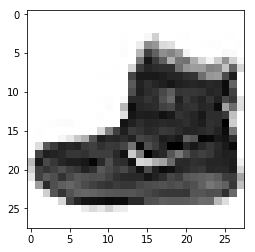

In [5]:
plt.imshow(x_train[0], cmap='Greys')

In [0]:
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU

In [0]:
x_train = np.expand_dims(x_train, axis=3)

In [8]:
def create_generator():
  model = Sequential()

  model.add(Dense(256, input_dim=100))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))
  
  model.add(Dense(512))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))

  model.add(Dense(1024))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))

  model.add(Dense(np.prod((28, 28, 1)), activation='tanh'))
  model.add(Reshape((28, 28, 1)))

  model.summary()

  noise = Input(shape=(100,))
  img = model(noise)

  return Model(noise, img)

generator = create_generator()
z = Input(shape=(100,))
img = generator(z)





Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 256)               25856     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
dense_2 (Dense)              (None, 512)               131584    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 512)               2048      
_________________________________________________________________
dense_3 (Dense)              (None, 1024)         

In [9]:
def create_discriminator():
  model = Sequential()

  model.add(Flatten(input_shape=(28, 28, 1)))
  model.add(Dense(512))
  model.add(LeakyReLU(0.2))
  model.add(Dense(256))
  model.add(LeakyReLU(0.2))
  model.add(Dense(1, activation='sigmoid'))
  model.summary()

  img = Input(shape=(28, 28, 1))
  validity = model(img)

  return Model(img, validity)

discriminator = create_discriminator()
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5), metrics=['accuracy'])
discriminator.trainable = False

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
________________________________________________

In [0]:
validity = discriminator(img)
combined = Model(z, validity)
combined.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5))

In [0]:
def sample_images(epoch):
  r, c = 5, 5
  noise = np.random.normal(0, 1, (r*c, 100))
  gen_imgs = generator.predict(noise)

  # Rescale images 0 - 1
  gen_imgs = 0.5*gen_imgs+0.5

  fig, axs = plt.subplots(r, c)
  cnt = 0
  for i in range(r):
    for j in range(c):
      axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
      axs[i, j].axis('off')
      cnt += 1
  #fig.savefig("images/%d.png" % epoch)
  plt.show()
  plt.close()

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'



0 [D loss: 0.593956, acc.: 50.00%] [G loss: 0.544333]


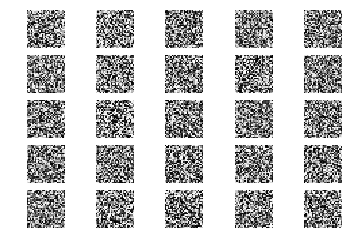

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


1 [D loss: 0.512779, acc.: 56.25%] [G loss: 0.599612]
2 [D loss: 0.484279, acc.: 62.50%] [G loss: 0.694943]
3 [D loss: 0.339850, acc.: 84.38%] [G loss: 0.837413]
4 [D loss: 0.312589, acc.: 89.06%] [G loss: 0.995201]
5 [D loss: 0.282557, acc.: 92.19%] [G loss: 1.089407]
6 [D loss: 0.225337, acc.: 98.44%] [G loss: 1.193146]
7 [D loss: 0.220323, acc.: 96.88%] [G loss: 1.253309]
8 [D loss: 0.186584, acc.: 100.00%] [G loss: 1.358251]
9 [D loss: 0.167624, acc.: 100.00%] [G loss: 1.444465]
10 [D loss: 0.157187, acc.: 100.00%] [G loss: 1.568468]
11 [D loss: 0.131328, acc.: 100.00%] [G loss: 1.670143]
12 [D loss: 0.121680, acc.: 100.00%] [G loss: 1.734733]
13 [D loss: 0.139177, acc.: 100.00%] [G loss: 1.847716]
14 [D loss: 0.110523, acc.: 100.00%] [G loss: 1.882341]
15 [D loss: 0.105348, acc.: 100.00%] [G loss: 1.950349]
16 [D loss: 0.107620, acc.: 100.00%] [G loss: 2.145672]
17 [D loss: 0.098401, acc.: 100.00%] [G loss: 2.087461]
18 [D loss: 0.084784, acc.: 100.00%] [G loss: 2.260606]
19 [D lo

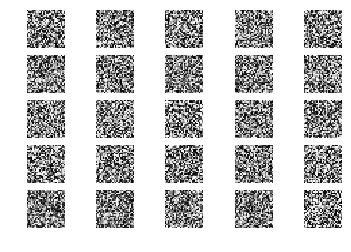

51 [D loss: 0.024511, acc.: 100.00%] [G loss: 3.616113]
52 [D loss: 0.025683, acc.: 100.00%] [G loss: 3.554159]
53 [D loss: 0.021943, acc.: 100.00%] [G loss: 3.523245]
54 [D loss: 0.025331, acc.: 100.00%] [G loss: 3.598725]
55 [D loss: 0.022334, acc.: 100.00%] [G loss: 3.650253]
56 [D loss: 0.022542, acc.: 100.00%] [G loss: 3.577630]
57 [D loss: 0.019752, acc.: 100.00%] [G loss: 3.570040]
58 [D loss: 0.021681, acc.: 100.00%] [G loss: 3.719456]
59 [D loss: 0.046692, acc.: 98.44%] [G loss: 3.613448]
60 [D loss: 0.021461, acc.: 100.00%] [G loss: 3.567087]
61 [D loss: 0.020779, acc.: 100.00%] [G loss: 3.719224]
62 [D loss: 0.024931, acc.: 100.00%] [G loss: 3.765486]
63 [D loss: 0.021011, acc.: 100.00%] [G loss: 3.811604]
64 [D loss: 0.078871, acc.: 98.44%] [G loss: 3.676377]
65 [D loss: 0.018408, acc.: 100.00%] [G loss: 3.726029]
66 [D loss: 0.026424, acc.: 100.00%] [G loss: 3.891762]
67 [D loss: 0.013624, acc.: 100.00%] [G loss: 3.767753]
68 [D loss: 0.018691, acc.: 100.00%] [G loss: 3.83

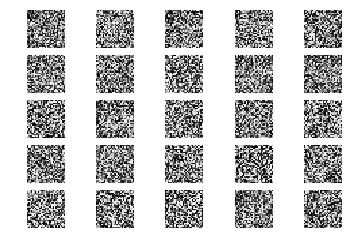

101 [D loss: 0.017121, acc.: 100.00%] [G loss: 4.386494]
102 [D loss: 0.014334, acc.: 100.00%] [G loss: 4.482565]
103 [D loss: 0.023125, acc.: 100.00%] [G loss: 4.385058]
104 [D loss: 0.017641, acc.: 100.00%] [G loss: 4.537346]
105 [D loss: 0.018253, acc.: 100.00%] [G loss: 4.410138]
106 [D loss: 0.017140, acc.: 100.00%] [G loss: 4.588041]
107 [D loss: 0.015197, acc.: 100.00%] [G loss: 4.313025]
108 [D loss: 0.014830, acc.: 100.00%] [G loss: 4.573237]
109 [D loss: 0.020629, acc.: 100.00%] [G loss: 4.428754]
110 [D loss: 0.019117, acc.: 100.00%] [G loss: 4.441367]
111 [D loss: 0.026886, acc.: 100.00%] [G loss: 4.526483]
112 [D loss: 0.018573, acc.: 100.00%] [G loss: 4.626204]
113 [D loss: 0.018965, acc.: 100.00%] [G loss: 4.600279]
114 [D loss: 0.017645, acc.: 100.00%] [G loss: 4.578735]
115 [D loss: 0.022148, acc.: 100.00%] [G loss: 4.642194]
116 [D loss: 0.011829, acc.: 100.00%] [G loss: 4.852162]
117 [D loss: 0.019757, acc.: 100.00%] [G loss: 4.766519]
118 [D loss: 0.060057, acc.: 98

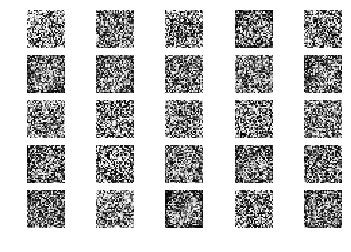

151 [D loss: 0.037464, acc.: 100.00%] [G loss: 4.759709]
152 [D loss: 0.033211, acc.: 100.00%] [G loss: 4.611278]
153 [D loss: 0.079002, acc.: 98.44%] [G loss: 4.226055]
154 [D loss: 0.092056, acc.: 98.44%] [G loss: 5.079403]
155 [D loss: 0.138304, acc.: 95.31%] [G loss: 4.269413]
156 [D loss: 0.062533, acc.: 98.44%] [G loss: 4.498919]
157 [D loss: 0.039624, acc.: 98.44%] [G loss: 4.850822]
158 [D loss: 0.053516, acc.: 98.44%] [G loss: 4.605515]
159 [D loss: 0.034898, acc.: 100.00%] [G loss: 4.689310]
160 [D loss: 0.035029, acc.: 100.00%] [G loss: 4.824230]
161 [D loss: 0.052196, acc.: 100.00%] [G loss: 4.902391]
162 [D loss: 0.023993, acc.: 100.00%] [G loss: 4.797904]
163 [D loss: 0.035189, acc.: 98.44%] [G loss: 4.804983]
164 [D loss: 0.163425, acc.: 92.19%] [G loss: 4.092750]
165 [D loss: 0.078922, acc.: 98.44%] [G loss: 4.525540]
166 [D loss: 0.062839, acc.: 100.00%] [G loss: 4.574935]
167 [D loss: 0.099267, acc.: 96.88%] [G loss: 4.290268]
168 [D loss: 0.102748, acc.: 98.44%] [G l

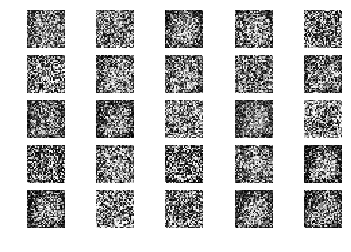

201 [D loss: 0.047860, acc.: 98.44%] [G loss: 4.663897]
202 [D loss: 0.111743, acc.: 96.88%] [G loss: 4.362534]
203 [D loss: 0.097985, acc.: 96.88%] [G loss: 4.196696]
204 [D loss: 0.045173, acc.: 100.00%] [G loss: 4.233595]
205 [D loss: 0.100244, acc.: 96.88%] [G loss: 5.091036]
206 [D loss: 0.155993, acc.: 93.75%] [G loss: 3.869683]
207 [D loss: 0.101194, acc.: 95.31%] [G loss: 4.080353]
208 [D loss: 0.085405, acc.: 96.88%] [G loss: 4.674805]
209 [D loss: 0.229875, acc.: 95.31%] [G loss: 4.528580]
210 [D loss: 0.296105, acc.: 84.38%] [G loss: 4.030325]
211 [D loss: 0.111494, acc.: 95.31%] [G loss: 5.085264]
212 [D loss: 0.358042, acc.: 84.38%] [G loss: 3.603245]
213 [D loss: 0.091651, acc.: 96.88%] [G loss: 4.289109]
214 [D loss: 0.169423, acc.: 92.19%] [G loss: 4.925781]
215 [D loss: 0.284803, acc.: 93.75%] [G loss: 3.773678]
216 [D loss: 0.232644, acc.: 90.62%] [G loss: 4.499667]
217 [D loss: 0.075622, acc.: 96.88%] [G loss: 4.435517]
218 [D loss: 0.231407, acc.: 85.94%] [G loss: 4

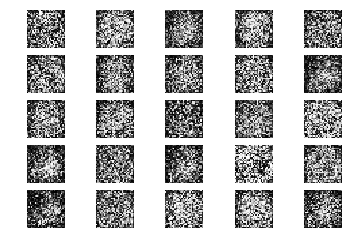

251 [D loss: 0.159621, acc.: 95.31%] [G loss: 3.019800]
252 [D loss: 0.174498, acc.: 95.31%] [G loss: 3.460850]
253 [D loss: 0.074172, acc.: 100.00%] [G loss: 3.725668]
254 [D loss: 0.171684, acc.: 95.31%] [G loss: 2.931580]
255 [D loss: 0.103264, acc.: 96.88%] [G loss: 3.447290]
256 [D loss: 0.225283, acc.: 90.62%] [G loss: 3.373351]
257 [D loss: 0.314621, acc.: 82.81%] [G loss: 4.010570]
258 [D loss: 0.433806, acc.: 75.00%] [G loss: 3.743850]
259 [D loss: 0.332216, acc.: 85.94%] [G loss: 3.065392]
260 [D loss: 0.139238, acc.: 96.88%] [G loss: 3.498147]
261 [D loss: 0.160147, acc.: 96.88%] [G loss: 3.230111]
262 [D loss: 0.280180, acc.: 84.38%] [G loss: 4.345360]
263 [D loss: 0.287421, acc.: 87.50%] [G loss: 3.801625]
264 [D loss: 0.118459, acc.: 96.88%] [G loss: 4.087011]
265 [D loss: 0.351238, acc.: 84.38%] [G loss: 3.816581]
266 [D loss: 0.092855, acc.: 98.44%] [G loss: 3.920750]
267 [D loss: 0.262826, acc.: 87.50%] [G loss: 3.561666]
268 [D loss: 0.220013, acc.: 93.75%] [G loss: 4

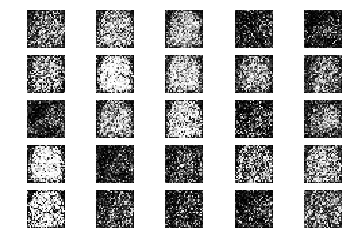

301 [D loss: 0.365432, acc.: 85.94%] [G loss: 3.094258]
302 [D loss: 0.170363, acc.: 95.31%] [G loss: 3.494436]
303 [D loss: 0.249197, acc.: 92.19%] [G loss: 2.962772]
304 [D loss: 0.334316, acc.: 90.62%] [G loss: 3.465410]
305 [D loss: 0.182263, acc.: 90.62%] [G loss: 3.213537]
306 [D loss: 0.188251, acc.: 93.75%] [G loss: 3.769410]
307 [D loss: 0.283757, acc.: 87.50%] [G loss: 3.650159]
308 [D loss: 0.439083, acc.: 79.69%] [G loss: 3.654483]
309 [D loss: 0.355345, acc.: 79.69%] [G loss: 3.211765]
310 [D loss: 0.228972, acc.: 90.62%] [G loss: 3.775062]
311 [D loss: 0.204325, acc.: 90.62%] [G loss: 4.010677]
312 [D loss: 0.393978, acc.: 78.12%] [G loss: 2.627037]
313 [D loss: 0.210553, acc.: 95.31%] [G loss: 3.572941]
314 [D loss: 0.304679, acc.: 84.38%] [G loss: 3.559397]
315 [D loss: 0.227333, acc.: 90.62%] [G loss: 4.061315]
316 [D loss: 0.667041, acc.: 73.44%] [G loss: 3.166032]
317 [D loss: 0.270242, acc.: 90.62%] [G loss: 3.218571]
318 [D loss: 0.371299, acc.: 85.94%] [G loss: 3.

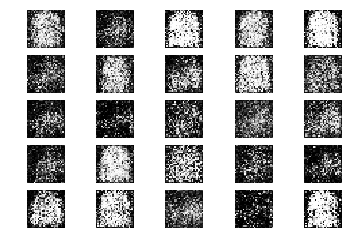

351 [D loss: 0.541118, acc.: 71.88%] [G loss: 2.707438]
352 [D loss: 0.319062, acc.: 90.62%] [G loss: 2.869600]
353 [D loss: 0.441818, acc.: 79.69%] [G loss: 2.557456]
354 [D loss: 0.298941, acc.: 89.06%] [G loss: 2.827553]
355 [D loss: 0.555553, acc.: 79.69%] [G loss: 2.492953]
356 [D loss: 0.420641, acc.: 84.38%] [G loss: 2.876080]
357 [D loss: 0.431778, acc.: 73.44%] [G loss: 2.774309]
358 [D loss: 0.523960, acc.: 82.81%] [G loss: 2.583689]
359 [D loss: 0.337274, acc.: 89.06%] [G loss: 2.466398]
360 [D loss: 0.850606, acc.: 67.19%] [G loss: 2.076175]
361 [D loss: 0.582479, acc.: 60.94%] [G loss: 3.133947]
362 [D loss: 0.484870, acc.: 76.56%] [G loss: 2.407743]
363 [D loss: 0.589068, acc.: 65.62%] [G loss: 2.257473]
364 [D loss: 0.361773, acc.: 84.38%] [G loss: 2.647099]
365 [D loss: 0.440494, acc.: 96.88%] [G loss: 2.531252]
366 [D loss: 0.562537, acc.: 76.56%] [G loss: 2.638624]
367 [D loss: 0.337490, acc.: 92.19%] [G loss: 2.809722]
368 [D loss: 0.514496, acc.: 82.81%] [G loss: 2.

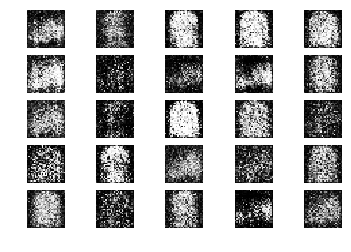

401 [D loss: 0.474564, acc.: 82.81%] [G loss: 2.129378]
402 [D loss: 0.571096, acc.: 71.88%] [G loss: 1.831170]
403 [D loss: 0.677417, acc.: 65.62%] [G loss: 1.802727]
404 [D loss: 0.625685, acc.: 71.88%] [G loss: 2.300428]
405 [D loss: 0.705697, acc.: 62.50%] [G loss: 1.821542]
406 [D loss: 0.898777, acc.: 56.25%] [G loss: 1.500390]
407 [D loss: 0.686881, acc.: 68.75%] [G loss: 1.874369]
408 [D loss: 0.722923, acc.: 68.75%] [G loss: 1.761949]
409 [D loss: 0.585319, acc.: 68.75%] [G loss: 2.112684]
410 [D loss: 1.006398, acc.: 46.88%] [G loss: 1.296102]
411 [D loss: 0.572670, acc.: 71.88%] [G loss: 1.791140]
412 [D loss: 0.845483, acc.: 56.25%] [G loss: 1.256028]
413 [D loss: 0.677720, acc.: 60.94%] [G loss: 1.335483]
414 [D loss: 0.473665, acc.: 75.00%] [G loss: 1.654134]
415 [D loss: 0.619638, acc.: 64.06%] [G loss: 1.562003]
416 [D loss: 0.600137, acc.: 60.94%] [G loss: 1.407324]
417 [D loss: 0.655229, acc.: 62.50%] [G loss: 1.391135]
418 [D loss: 0.566327, acc.: 68.75%] [G loss: 1.

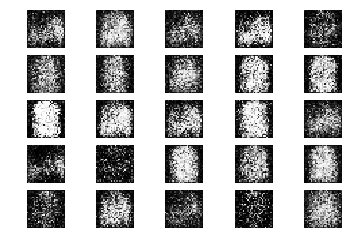

451 [D loss: 0.796521, acc.: 46.88%] [G loss: 1.091472]
452 [D loss: 0.722884, acc.: 62.50%] [G loss: 1.067865]
453 [D loss: 0.656588, acc.: 59.38%] [G loss: 1.112108]
454 [D loss: 0.555691, acc.: 68.75%] [G loss: 1.283438]
455 [D loss: 0.696509, acc.: 57.81%] [G loss: 1.366067]
456 [D loss: 0.662866, acc.: 60.94%] [G loss: 1.322730]
457 [D loss: 0.651297, acc.: 67.19%] [G loss: 1.097994]
458 [D loss: 0.602624, acc.: 75.00%] [G loss: 1.185010]
459 [D loss: 0.791758, acc.: 60.94%] [G loss: 1.312844]
460 [D loss: 0.635153, acc.: 70.31%] [G loss: 1.342643]
461 [D loss: 0.776741, acc.: 56.25%] [G loss: 1.189002]
462 [D loss: 0.689340, acc.: 68.75%] [G loss: 1.084840]
463 [D loss: 0.641982, acc.: 67.19%] [G loss: 1.084970]
464 [D loss: 0.653755, acc.: 57.81%] [G loss: 1.103068]
465 [D loss: 0.651465, acc.: 57.81%] [G loss: 1.259775]
466 [D loss: 0.717468, acc.: 59.38%] [G loss: 1.154532]
467 [D loss: 0.656564, acc.: 62.50%] [G loss: 1.189803]
468 [D loss: 0.653217, acc.: 75.00%] [G loss: 1.

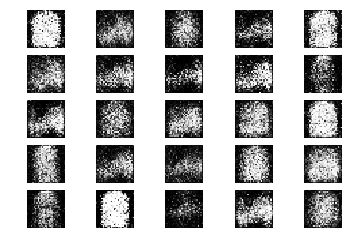

501 [D loss: 0.748324, acc.: 57.81%] [G loss: 1.014136]
502 [D loss: 0.642923, acc.: 62.50%] [G loss: 1.060647]
503 [D loss: 0.704555, acc.: 60.94%] [G loss: 0.976333]
504 [D loss: 0.685201, acc.: 65.62%] [G loss: 1.039729]
505 [D loss: 0.658580, acc.: 68.75%] [G loss: 1.015317]
506 [D loss: 0.536198, acc.: 71.88%] [G loss: 1.043334]
507 [D loss: 0.628823, acc.: 67.19%] [G loss: 1.104238]
508 [D loss: 0.588878, acc.: 64.06%] [G loss: 1.125737]
509 [D loss: 0.649003, acc.: 64.06%] [G loss: 1.153250]
510 [D loss: 0.686523, acc.: 59.38%] [G loss: 1.221040]
511 [D loss: 0.740982, acc.: 62.50%] [G loss: 1.058498]
512 [D loss: 0.615880, acc.: 78.12%] [G loss: 1.033256]
513 [D loss: 0.589933, acc.: 73.44%] [G loss: 1.014936]
514 [D loss: 0.674945, acc.: 71.88%] [G loss: 1.129764]
515 [D loss: 0.665302, acc.: 64.06%] [G loss: 1.065363]
516 [D loss: 0.675350, acc.: 56.25%] [G loss: 1.075992]
517 [D loss: 0.647137, acc.: 67.19%] [G loss: 1.086772]
518 [D loss: 0.679049, acc.: 56.25%] [G loss: 1.

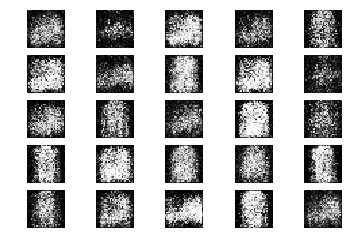

551 [D loss: 0.689404, acc.: 62.50%] [G loss: 0.965577]
552 [D loss: 0.511949, acc.: 81.25%] [G loss: 1.014250]
553 [D loss: 0.619159, acc.: 56.25%] [G loss: 1.121061]
554 [D loss: 0.568888, acc.: 70.31%] [G loss: 1.093240]
555 [D loss: 0.649098, acc.: 59.38%] [G loss: 1.164259]
556 [D loss: 0.627607, acc.: 60.94%] [G loss: 1.055281]
557 [D loss: 0.652792, acc.: 62.50%] [G loss: 1.021326]
558 [D loss: 0.719549, acc.: 48.44%] [G loss: 0.919888]
559 [D loss: 0.674717, acc.: 54.69%] [G loss: 0.969922]
560 [D loss: 0.684873, acc.: 65.62%] [G loss: 0.998991]
561 [D loss: 0.598589, acc.: 64.06%] [G loss: 0.989658]
562 [D loss: 0.547389, acc.: 75.00%] [G loss: 0.928656]
563 [D loss: 0.625541, acc.: 62.50%] [G loss: 1.015291]
564 [D loss: 0.606290, acc.: 73.44%] [G loss: 1.025546]
565 [D loss: 0.617996, acc.: 67.19%] [G loss: 0.971715]
566 [D loss: 0.524511, acc.: 78.12%] [G loss: 1.083091]
567 [D loss: 0.606791, acc.: 64.06%] [G loss: 1.068069]
568 [D loss: 0.567334, acc.: 70.31%] [G loss: 1.

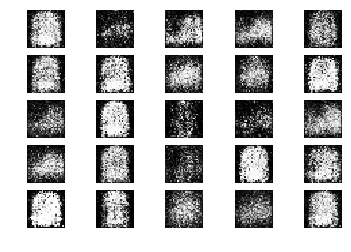

601 [D loss: 0.519568, acc.: 81.25%] [G loss: 1.069469]
602 [D loss: 0.518943, acc.: 75.00%] [G loss: 1.169026]
603 [D loss: 0.711330, acc.: 67.19%] [G loss: 0.992137]
604 [D loss: 0.592144, acc.: 67.19%] [G loss: 1.014635]
605 [D loss: 0.533942, acc.: 79.69%] [G loss: 1.046784]
606 [D loss: 0.628131, acc.: 64.06%] [G loss: 0.966160]
607 [D loss: 0.591821, acc.: 65.62%] [G loss: 1.076378]
608 [D loss: 0.578889, acc.: 71.88%] [G loss: 0.966403]
609 [D loss: 0.477805, acc.: 87.50%] [G loss: 1.076653]
610 [D loss: 0.538195, acc.: 71.88%] [G loss: 1.075581]
611 [D loss: 0.612989, acc.: 64.06%] [G loss: 1.006719]
612 [D loss: 0.629614, acc.: 68.75%] [G loss: 1.089629]
613 [D loss: 0.596146, acc.: 68.75%] [G loss: 1.045144]
614 [D loss: 0.557875, acc.: 68.75%] [G loss: 1.095616]
615 [D loss: 0.512448, acc.: 82.81%] [G loss: 1.150451]
616 [D loss: 0.636211, acc.: 62.50%] [G loss: 1.056611]
617 [D loss: 0.665215, acc.: 56.25%] [G loss: 0.967896]
618 [D loss: 0.522649, acc.: 82.81%] [G loss: 1.

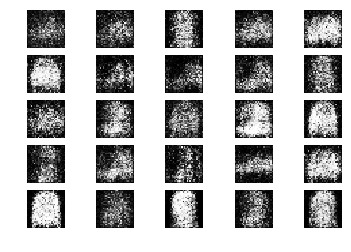

651 [D loss: 0.597140, acc.: 67.19%] [G loss: 1.038420]
652 [D loss: 0.619251, acc.: 60.94%] [G loss: 1.028664]
653 [D loss: 0.601004, acc.: 73.44%] [G loss: 1.094604]
654 [D loss: 0.581752, acc.: 70.31%] [G loss: 1.019619]
655 [D loss: 0.530536, acc.: 75.00%] [G loss: 1.054884]
656 [D loss: 0.621666, acc.: 62.50%] [G loss: 1.017429]
657 [D loss: 0.649861, acc.: 62.50%] [G loss: 0.982798]
658 [D loss: 0.664575, acc.: 64.06%] [G loss: 1.149374]
659 [D loss: 0.524856, acc.: 82.81%] [G loss: 0.899291]
660 [D loss: 0.608518, acc.: 71.88%] [G loss: 1.078814]
661 [D loss: 0.679060, acc.: 57.81%] [G loss: 1.069248]
662 [D loss: 0.564789, acc.: 70.31%] [G loss: 1.046382]
663 [D loss: 0.593384, acc.: 71.88%] [G loss: 0.966780]
664 [D loss: 0.628638, acc.: 62.50%] [G loss: 0.963557]
665 [D loss: 0.580544, acc.: 65.62%] [G loss: 1.009630]
666 [D loss: 0.559316, acc.: 76.56%] [G loss: 0.979785]
667 [D loss: 0.532851, acc.: 67.19%] [G loss: 1.017987]
668 [D loss: 0.580551, acc.: 68.75%] [G loss: 1.

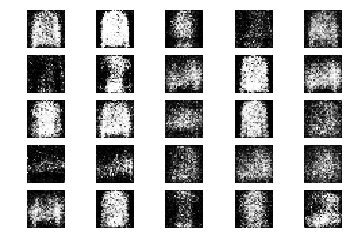

701 [D loss: 0.630533, acc.: 65.62%] [G loss: 1.115326]
702 [D loss: 0.557511, acc.: 73.44%] [G loss: 0.967329]
703 [D loss: 0.547971, acc.: 73.44%] [G loss: 0.999996]
704 [D loss: 0.595821, acc.: 68.75%] [G loss: 0.935748]
705 [D loss: 0.570554, acc.: 71.88%] [G loss: 1.026950]
706 [D loss: 0.534608, acc.: 75.00%] [G loss: 1.112873]
707 [D loss: 0.721322, acc.: 56.25%] [G loss: 0.980847]
708 [D loss: 0.635046, acc.: 60.94%] [G loss: 0.990078]
709 [D loss: 0.546933, acc.: 79.69%] [G loss: 0.954185]
710 [D loss: 0.682258, acc.: 65.62%] [G loss: 0.955314]
711 [D loss: 0.577533, acc.: 68.75%] [G loss: 0.995423]
712 [D loss: 0.596994, acc.: 67.19%] [G loss: 1.049962]
713 [D loss: 0.669093, acc.: 60.94%] [G loss: 1.055436]
714 [D loss: 0.586726, acc.: 70.31%] [G loss: 1.116543]
715 [D loss: 0.641358, acc.: 73.44%] [G loss: 1.038218]
716 [D loss: 0.634649, acc.: 67.19%] [G loss: 0.922888]
717 [D loss: 0.563670, acc.: 75.00%] [G loss: 0.966893]
718 [D loss: 0.641782, acc.: 64.06%] [G loss: 0.

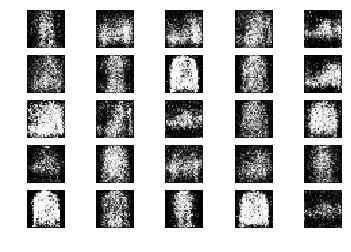

751 [D loss: 0.608476, acc.: 71.88%] [G loss: 1.014253]
752 [D loss: 0.616743, acc.: 68.75%] [G loss: 0.920997]
753 [D loss: 0.569685, acc.: 70.31%] [G loss: 0.982015]
754 [D loss: 0.672977, acc.: 67.19%] [G loss: 1.082379]
755 [D loss: 0.618070, acc.: 68.75%] [G loss: 1.076135]
756 [D loss: 0.630725, acc.: 59.38%] [G loss: 0.967984]
757 [D loss: 0.613018, acc.: 65.62%] [G loss: 1.162772]
758 [D loss: 0.657421, acc.: 60.94%] [G loss: 0.985970]
759 [D loss: 0.646160, acc.: 65.62%] [G loss: 0.948189]
760 [D loss: 0.610047, acc.: 64.06%] [G loss: 1.039353]
761 [D loss: 0.656593, acc.: 57.81%] [G loss: 0.983389]
762 [D loss: 0.590343, acc.: 67.19%] [G loss: 1.047200]
763 [D loss: 0.570499, acc.: 81.25%] [G loss: 1.056169]
764 [D loss: 0.633757, acc.: 65.62%] [G loss: 1.037741]
765 [D loss: 0.654870, acc.: 62.50%] [G loss: 0.972180]
766 [D loss: 0.563733, acc.: 73.44%] [G loss: 1.040586]
767 [D loss: 0.649588, acc.: 53.12%] [G loss: 1.017752]
768 [D loss: 0.644301, acc.: 60.94%] [G loss: 0.

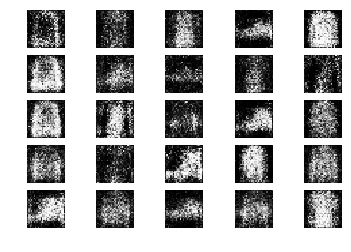

801 [D loss: 0.648524, acc.: 60.94%] [G loss: 0.993137]
802 [D loss: 0.632991, acc.: 65.62%] [G loss: 1.050370]
803 [D loss: 0.592567, acc.: 70.31%] [G loss: 1.109778]
804 [D loss: 0.574012, acc.: 76.56%] [G loss: 0.927539]
805 [D loss: 0.623189, acc.: 60.94%] [G loss: 0.990215]
806 [D loss: 0.563302, acc.: 67.19%] [G loss: 0.956374]
807 [D loss: 0.569328, acc.: 65.62%] [G loss: 0.989037]
808 [D loss: 0.541119, acc.: 75.00%] [G loss: 0.951137]
809 [D loss: 0.584369, acc.: 70.31%] [G loss: 0.956118]
810 [D loss: 0.629979, acc.: 57.81%] [G loss: 1.056427]
811 [D loss: 0.631708, acc.: 62.50%] [G loss: 0.995411]
812 [D loss: 0.614690, acc.: 60.94%] [G loss: 1.082308]
813 [D loss: 0.593993, acc.: 68.75%] [G loss: 1.008186]
814 [D loss: 0.568701, acc.: 71.88%] [G loss: 0.992040]
815 [D loss: 0.594899, acc.: 73.44%] [G loss: 1.018283]
816 [D loss: 0.583558, acc.: 64.06%] [G loss: 0.965612]
817 [D loss: 0.633487, acc.: 64.06%] [G loss: 1.072473]
818 [D loss: 0.581394, acc.: 76.56%] [G loss: 1.

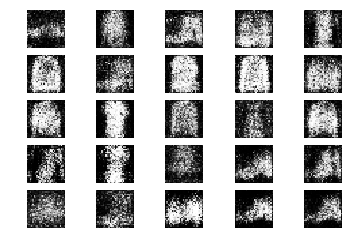

851 [D loss: 0.586338, acc.: 73.44%] [G loss: 0.988246]
852 [D loss: 0.604603, acc.: 70.31%] [G loss: 0.926354]
853 [D loss: 0.577383, acc.: 73.44%] [G loss: 0.972761]
854 [D loss: 0.556221, acc.: 76.56%] [G loss: 0.884670]
855 [D loss: 0.554018, acc.: 71.88%] [G loss: 0.910542]
856 [D loss: 0.600520, acc.: 65.62%] [G loss: 1.039351]
857 [D loss: 0.600496, acc.: 67.19%] [G loss: 0.880611]
858 [D loss: 0.627820, acc.: 65.62%] [G loss: 0.936368]
859 [D loss: 0.632491, acc.: 70.31%] [G loss: 1.011586]
860 [D loss: 0.474296, acc.: 81.25%] [G loss: 0.998141]
861 [D loss: 0.579994, acc.: 64.06%] [G loss: 0.972895]
862 [D loss: 0.499413, acc.: 75.00%] [G loss: 1.049235]
863 [D loss: 0.493083, acc.: 79.69%] [G loss: 0.963419]
864 [D loss: 0.699462, acc.: 57.81%] [G loss: 1.135321]
865 [D loss: 0.641483, acc.: 65.62%] [G loss: 1.038439]
866 [D loss: 0.625894, acc.: 64.06%] [G loss: 1.078350]
867 [D loss: 0.638504, acc.: 60.94%] [G loss: 0.868295]
868 [D loss: 0.656208, acc.: 62.50%] [G loss: 0.

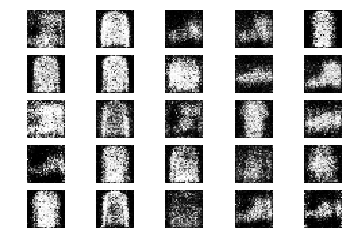

901 [D loss: 0.635043, acc.: 65.62%] [G loss: 1.067200]
902 [D loss: 0.621855, acc.: 71.88%] [G loss: 1.029916]
903 [D loss: 0.589138, acc.: 71.88%] [G loss: 0.957811]
904 [D loss: 0.637252, acc.: 60.94%] [G loss: 0.863809]
905 [D loss: 0.618751, acc.: 65.62%] [G loss: 0.848237]
906 [D loss: 0.672714, acc.: 57.81%] [G loss: 1.000956]
907 [D loss: 0.652418, acc.: 59.38%] [G loss: 1.029832]
908 [D loss: 0.608943, acc.: 73.44%] [G loss: 0.951380]
909 [D loss: 0.643120, acc.: 59.38%] [G loss: 0.937154]
910 [D loss: 0.699222, acc.: 48.44%] [G loss: 0.878444]
911 [D loss: 0.556937, acc.: 73.44%] [G loss: 0.910336]
912 [D loss: 0.586892, acc.: 68.75%] [G loss: 0.965647]
913 [D loss: 0.584538, acc.: 71.88%] [G loss: 1.032505]
914 [D loss: 0.584827, acc.: 70.31%] [G loss: 0.968477]
915 [D loss: 0.672919, acc.: 62.50%] [G loss: 0.984033]
916 [D loss: 0.648125, acc.: 60.94%] [G loss: 0.869348]
917 [D loss: 0.662359, acc.: 56.25%] [G loss: 0.954280]
918 [D loss: 0.539815, acc.: 71.88%] [G loss: 1.

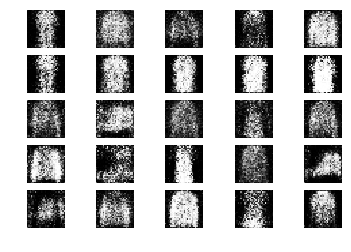

951 [D loss: 0.635501, acc.: 60.94%] [G loss: 1.063449]
952 [D loss: 0.544171, acc.: 75.00%] [G loss: 0.941168]
953 [D loss: 0.599327, acc.: 70.31%] [G loss: 0.953263]
954 [D loss: 0.631617, acc.: 68.75%] [G loss: 0.903401]
955 [D loss: 0.637478, acc.: 62.50%] [G loss: 1.040205]
956 [D loss: 0.576388, acc.: 67.19%] [G loss: 1.026812]
957 [D loss: 0.554359, acc.: 75.00%] [G loss: 0.993276]
958 [D loss: 0.560640, acc.: 65.62%] [G loss: 1.007792]
959 [D loss: 0.593993, acc.: 71.88%] [G loss: 1.049425]
960 [D loss: 0.659572, acc.: 56.25%] [G loss: 0.969739]
961 [D loss: 0.514091, acc.: 76.56%] [G loss: 0.938849]
962 [D loss: 0.566356, acc.: 76.56%] [G loss: 0.858738]
963 [D loss: 0.568675, acc.: 73.44%] [G loss: 0.976253]
964 [D loss: 0.602428, acc.: 67.19%] [G loss: 1.006988]
965 [D loss: 0.688514, acc.: 57.81%] [G loss: 0.961322]
966 [D loss: 0.578363, acc.: 64.06%] [G loss: 0.941390]
967 [D loss: 0.641251, acc.: 68.75%] [G loss: 1.069041]
968 [D loss: 0.587254, acc.: 64.06%] [G loss: 1.

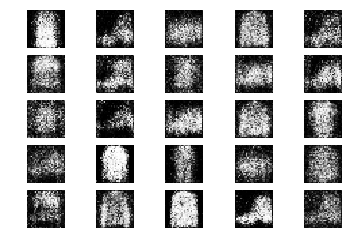

1001 [D loss: 0.546304, acc.: 71.88%] [G loss: 0.942508]
1002 [D loss: 0.657598, acc.: 60.94%] [G loss: 0.985672]
1003 [D loss: 0.592154, acc.: 62.50%] [G loss: 1.001014]
1004 [D loss: 0.606593, acc.: 68.75%] [G loss: 0.990862]
1005 [D loss: 0.597819, acc.: 70.31%] [G loss: 0.956791]
1006 [D loss: 0.580115, acc.: 73.44%] [G loss: 0.954590]
1007 [D loss: 0.588050, acc.: 71.88%] [G loss: 0.885769]
1008 [D loss: 0.572810, acc.: 76.56%] [G loss: 0.897171]
1009 [D loss: 0.544317, acc.: 78.12%] [G loss: 0.889061]
1010 [D loss: 0.574065, acc.: 71.88%] [G loss: 0.874059]
1011 [D loss: 0.577354, acc.: 73.44%] [G loss: 1.006981]
1012 [D loss: 0.586362, acc.: 65.62%] [G loss: 0.923985]
1013 [D loss: 0.646357, acc.: 65.62%] [G loss: 0.937769]
1014 [D loss: 0.610614, acc.: 64.06%] [G loss: 0.938445]
1015 [D loss: 0.550925, acc.: 78.12%] [G loss: 0.963180]
1016 [D loss: 0.539798, acc.: 78.12%] [G loss: 0.955404]
1017 [D loss: 0.551791, acc.: 73.44%] [G loss: 1.050427]
1018 [D loss: 0.583975, acc.: 7

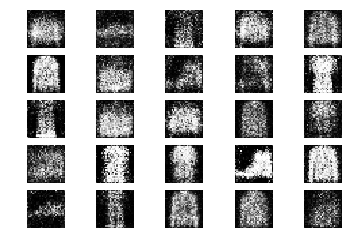

1051 [D loss: 0.606558, acc.: 70.31%] [G loss: 0.912672]
1052 [D loss: 0.599412, acc.: 68.75%] [G loss: 0.775168]
1053 [D loss: 0.600399, acc.: 70.31%] [G loss: 0.912500]
1054 [D loss: 0.632997, acc.: 64.06%] [G loss: 0.957712]
1055 [D loss: 0.514144, acc.: 70.31%] [G loss: 1.009022]
1056 [D loss: 0.587281, acc.: 64.06%] [G loss: 0.967709]
1057 [D loss: 0.523296, acc.: 78.12%] [G loss: 1.037992]
1058 [D loss: 0.593080, acc.: 68.75%] [G loss: 1.082002]
1059 [D loss: 0.607779, acc.: 68.75%] [G loss: 0.995730]
1060 [D loss: 0.677737, acc.: 53.12%] [G loss: 1.132072]
1061 [D loss: 0.637114, acc.: 64.06%] [G loss: 1.019081]
1062 [D loss: 0.662657, acc.: 56.25%] [G loss: 1.021174]
1063 [D loss: 0.560173, acc.: 76.56%] [G loss: 0.965241]
1064 [D loss: 0.559230, acc.: 76.56%] [G loss: 0.874477]
1065 [D loss: 0.568592, acc.: 70.31%] [G loss: 0.911222]
1066 [D loss: 0.668179, acc.: 62.50%] [G loss: 1.039925]
1067 [D loss: 0.612104, acc.: 68.75%] [G loss: 0.992088]
1068 [D loss: 0.613189, acc.: 6

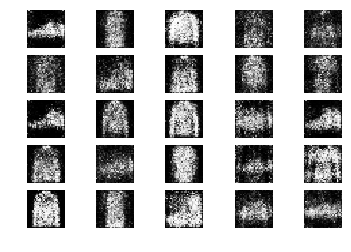

1101 [D loss: 0.568687, acc.: 73.44%] [G loss: 0.922032]
1102 [D loss: 0.625115, acc.: 65.62%] [G loss: 0.927161]
1103 [D loss: 0.577432, acc.: 70.31%] [G loss: 0.910148]
1104 [D loss: 0.631199, acc.: 59.38%] [G loss: 1.033123]
1105 [D loss: 0.598193, acc.: 70.31%] [G loss: 0.993465]
1106 [D loss: 0.681366, acc.: 60.94%] [G loss: 0.929911]
1107 [D loss: 0.620220, acc.: 64.06%] [G loss: 0.848419]
1108 [D loss: 0.670022, acc.: 60.94%] [G loss: 0.958122]
1109 [D loss: 0.561811, acc.: 70.31%] [G loss: 0.992745]
1110 [D loss: 0.601971, acc.: 64.06%] [G loss: 0.920249]
1111 [D loss: 0.629796, acc.: 70.31%] [G loss: 1.019531]
1112 [D loss: 0.586062, acc.: 68.75%] [G loss: 0.960799]
1113 [D loss: 0.589129, acc.: 71.88%] [G loss: 0.972617]
1114 [D loss: 0.561657, acc.: 73.44%] [G loss: 0.913140]
1115 [D loss: 0.649807, acc.: 59.38%] [G loss: 1.030759]
1116 [D loss: 0.563011, acc.: 73.44%] [G loss: 0.901515]
1117 [D loss: 0.542047, acc.: 75.00%] [G loss: 1.057955]
1118 [D loss: 0.736997, acc.: 5

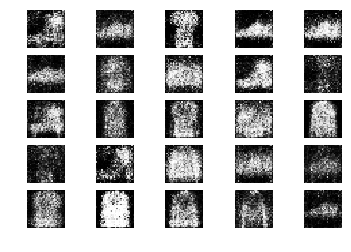

1151 [D loss: 0.587477, acc.: 71.88%] [G loss: 0.861664]
1152 [D loss: 0.601262, acc.: 71.88%] [G loss: 0.935238]
1153 [D loss: 0.710345, acc.: 46.88%] [G loss: 0.962232]
1154 [D loss: 0.557471, acc.: 79.69%] [G loss: 0.931102]
1155 [D loss: 0.577491, acc.: 65.62%] [G loss: 1.000332]
1156 [D loss: 0.597208, acc.: 71.88%] [G loss: 0.912923]
1157 [D loss: 0.634864, acc.: 62.50%] [G loss: 0.867518]
1158 [D loss: 0.575496, acc.: 73.44%] [G loss: 0.903377]
1159 [D loss: 0.612884, acc.: 71.88%] [G loss: 0.861743]
1160 [D loss: 0.628895, acc.: 67.19%] [G loss: 0.879978]
1161 [D loss: 0.609759, acc.: 76.56%] [G loss: 0.942145]
1162 [D loss: 0.623574, acc.: 67.19%] [G loss: 0.898943]
1163 [D loss: 0.552635, acc.: 68.75%] [G loss: 1.033039]
1164 [D loss: 0.632621, acc.: 60.94%] [G loss: 0.956971]
1165 [D loss: 0.551160, acc.: 78.12%] [G loss: 1.004333]
1166 [D loss: 0.654221, acc.: 62.50%] [G loss: 0.918858]
1167 [D loss: 0.590131, acc.: 70.31%] [G loss: 0.864183]
1168 [D loss: 0.591725, acc.: 6

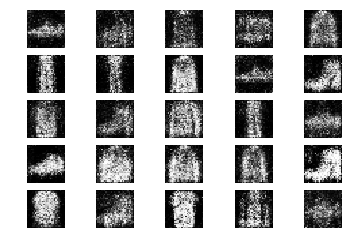

1201 [D loss: 0.588089, acc.: 60.94%] [G loss: 0.817743]
1202 [D loss: 0.602450, acc.: 70.31%] [G loss: 0.838126]
1203 [D loss: 0.587251, acc.: 64.06%] [G loss: 0.900587]
1204 [D loss: 0.641619, acc.: 67.19%] [G loss: 0.870904]
1205 [D loss: 0.527979, acc.: 78.12%] [G loss: 0.945204]
1206 [D loss: 0.600514, acc.: 70.31%] [G loss: 0.947371]
1207 [D loss: 0.617387, acc.: 68.75%] [G loss: 0.944379]
1208 [D loss: 0.726687, acc.: 51.56%] [G loss: 0.902137]
1209 [D loss: 0.586690, acc.: 73.44%] [G loss: 0.969858]
1210 [D loss: 0.568097, acc.: 75.00%] [G loss: 0.858441]
1211 [D loss: 0.638720, acc.: 57.81%] [G loss: 0.919743]
1212 [D loss: 0.648582, acc.: 64.06%] [G loss: 0.979618]
1213 [D loss: 0.605726, acc.: 73.44%] [G loss: 0.895846]
1214 [D loss: 0.659767, acc.: 54.69%] [G loss: 0.852843]
1215 [D loss: 0.630348, acc.: 62.50%] [G loss: 1.019970]
1216 [D loss: 0.579134, acc.: 70.31%] [G loss: 0.968315]
1217 [D loss: 0.670791, acc.: 62.50%] [G loss: 0.876891]
1218 [D loss: 0.571763, acc.: 6

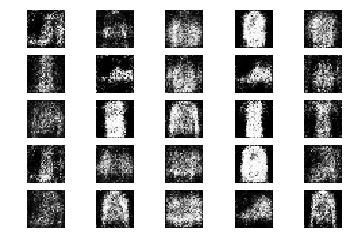

1251 [D loss: 0.609401, acc.: 62.50%] [G loss: 1.017317]
1252 [D loss: 0.583525, acc.: 71.88%] [G loss: 1.002005]
1253 [D loss: 0.531964, acc.: 67.19%] [G loss: 0.988444]
1254 [D loss: 0.681769, acc.: 57.81%] [G loss: 0.948443]
1255 [D loss: 0.566919, acc.: 71.88%] [G loss: 1.034859]
1256 [D loss: 0.645778, acc.: 64.06%] [G loss: 0.873357]
1257 [D loss: 0.554892, acc.: 75.00%] [G loss: 0.951673]
1258 [D loss: 0.585337, acc.: 75.00%] [G loss: 0.929728]
1259 [D loss: 0.562308, acc.: 75.00%] [G loss: 0.832197]
1260 [D loss: 0.667083, acc.: 59.38%] [G loss: 0.883515]
1261 [D loss: 0.625916, acc.: 68.75%] [G loss: 0.849870]
1262 [D loss: 0.595192, acc.: 67.19%] [G loss: 0.971470]
1263 [D loss: 0.637320, acc.: 60.94%] [G loss: 0.895774]
1264 [D loss: 0.634320, acc.: 62.50%] [G loss: 0.996412]
1265 [D loss: 0.594980, acc.: 70.31%] [G loss: 0.922748]
1266 [D loss: 0.597259, acc.: 76.56%] [G loss: 0.967492]
1267 [D loss: 0.645500, acc.: 65.62%] [G loss: 0.905328]
1268 [D loss: 0.649838, acc.: 5

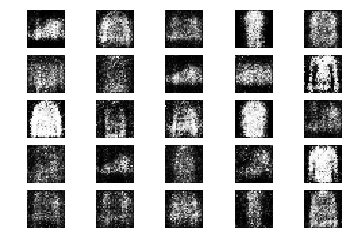

1301 [D loss: 0.597566, acc.: 62.50%] [G loss: 0.884776]
1302 [D loss: 0.578358, acc.: 67.19%] [G loss: 0.910951]
1303 [D loss: 0.561484, acc.: 73.44%] [G loss: 0.867789]
1304 [D loss: 0.660157, acc.: 56.25%] [G loss: 0.844712]
1305 [D loss: 0.636299, acc.: 64.06%] [G loss: 0.986947]
1306 [D loss: 0.624564, acc.: 64.06%] [G loss: 1.018857]
1307 [D loss: 0.612600, acc.: 65.62%] [G loss: 0.925674]
1308 [D loss: 0.563960, acc.: 76.56%] [G loss: 1.021097]
1309 [D loss: 0.590671, acc.: 70.31%] [G loss: 0.942043]
1310 [D loss: 0.613744, acc.: 68.75%] [G loss: 1.058383]
1311 [D loss: 0.691833, acc.: 51.56%] [G loss: 0.969747]
1312 [D loss: 0.560250, acc.: 79.69%] [G loss: 0.954457]
1313 [D loss: 0.547583, acc.: 75.00%] [G loss: 0.819478]
1314 [D loss: 0.635904, acc.: 59.38%] [G loss: 0.871658]
1315 [D loss: 0.632885, acc.: 60.94%] [G loss: 0.897218]
1316 [D loss: 0.629233, acc.: 65.62%] [G loss: 0.951118]
1317 [D loss: 0.587092, acc.: 71.88%] [G loss: 0.937232]
1318 [D loss: 0.623200, acc.: 7

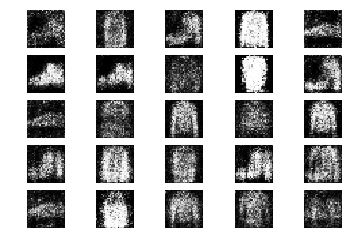

1351 [D loss: 0.692495, acc.: 54.69%] [G loss: 0.935899]
1352 [D loss: 0.612399, acc.: 62.50%] [G loss: 0.906772]
1353 [D loss: 0.624956, acc.: 64.06%] [G loss: 0.907378]
1354 [D loss: 0.640276, acc.: 60.94%] [G loss: 1.060620]
1355 [D loss: 0.592917, acc.: 71.88%] [G loss: 0.914336]
1356 [D loss: 0.626877, acc.: 64.06%] [G loss: 0.933588]
1357 [D loss: 0.607031, acc.: 67.19%] [G loss: 0.917453]
1358 [D loss: 0.591748, acc.: 70.31%] [G loss: 0.919889]
1359 [D loss: 0.614073, acc.: 64.06%] [G loss: 0.938777]
1360 [D loss: 0.564514, acc.: 73.44%] [G loss: 0.986164]
1361 [D loss: 0.661680, acc.: 62.50%] [G loss: 0.897064]
1362 [D loss: 0.564686, acc.: 67.19%] [G loss: 0.940710]
1363 [D loss: 0.634684, acc.: 65.62%] [G loss: 0.920813]
1364 [D loss: 0.617925, acc.: 64.06%] [G loss: 0.919669]
1365 [D loss: 0.644270, acc.: 73.44%] [G loss: 0.963302]
1366 [D loss: 0.552158, acc.: 75.00%] [G loss: 0.960315]
1367 [D loss: 0.574893, acc.: 68.75%] [G loss: 0.889814]
1368 [D loss: 0.613606, acc.: 6

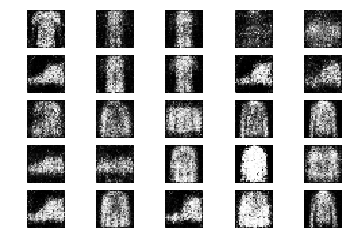

1401 [D loss: 0.586007, acc.: 70.31%] [G loss: 0.957320]
1402 [D loss: 0.611302, acc.: 67.19%] [G loss: 0.926280]
1403 [D loss: 0.649360, acc.: 64.06%] [G loss: 0.867514]
1404 [D loss: 0.567422, acc.: 76.56%] [G loss: 0.953633]
1405 [D loss: 0.567230, acc.: 75.00%] [G loss: 0.980269]
1406 [D loss: 0.662168, acc.: 57.81%] [G loss: 0.887064]
1407 [D loss: 0.573600, acc.: 65.62%] [G loss: 0.903742]
1408 [D loss: 0.585369, acc.: 71.88%] [G loss: 0.899377]
1409 [D loss: 0.588512, acc.: 64.06%] [G loss: 0.897090]
1410 [D loss: 0.708874, acc.: 59.38%] [G loss: 1.052007]
1411 [D loss: 0.610997, acc.: 68.75%] [G loss: 0.929549]
1412 [D loss: 0.594032, acc.: 64.06%] [G loss: 0.890541]
1413 [D loss: 0.695487, acc.: 54.69%] [G loss: 0.880797]
1414 [D loss: 0.584016, acc.: 79.69%] [G loss: 0.920862]
1415 [D loss: 0.604633, acc.: 68.75%] [G loss: 0.899655]
1416 [D loss: 0.593407, acc.: 65.62%] [G loss: 0.907673]
1417 [D loss: 0.562200, acc.: 75.00%] [G loss: 0.875920]
1418 [D loss: 0.583979, acc.: 6

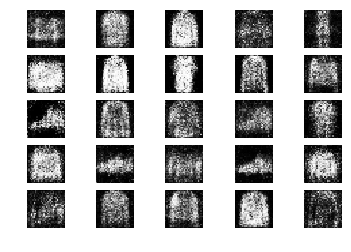

1451 [D loss: 0.526867, acc.: 76.56%] [G loss: 0.971233]
1452 [D loss: 0.636564, acc.: 62.50%] [G loss: 0.930618]
1453 [D loss: 0.655112, acc.: 60.94%] [G loss: 0.872219]
1454 [D loss: 0.582389, acc.: 68.75%] [G loss: 0.924897]
1455 [D loss: 0.559891, acc.: 73.44%] [G loss: 0.920289]
1456 [D loss: 0.564612, acc.: 71.88%] [G loss: 0.998555]
1457 [D loss: 0.665472, acc.: 59.38%] [G loss: 0.898279]
1458 [D loss: 0.558696, acc.: 81.25%] [G loss: 1.048846]
1459 [D loss: 0.682214, acc.: 64.06%] [G loss: 0.922138]
1460 [D loss: 0.627043, acc.: 65.62%] [G loss: 0.947286]
1461 [D loss: 0.628513, acc.: 62.50%] [G loss: 0.929959]
1462 [D loss: 0.580591, acc.: 70.31%] [G loss: 0.983864]
1463 [D loss: 0.591524, acc.: 65.62%] [G loss: 0.929038]
1464 [D loss: 0.634342, acc.: 70.31%] [G loss: 0.872985]
1465 [D loss: 0.590504, acc.: 68.75%] [G loss: 1.026459]
1466 [D loss: 0.672866, acc.: 64.06%] [G loss: 0.951720]
1467 [D loss: 0.609419, acc.: 67.19%] [G loss: 1.004958]
1468 [D loss: 0.638007, acc.: 6

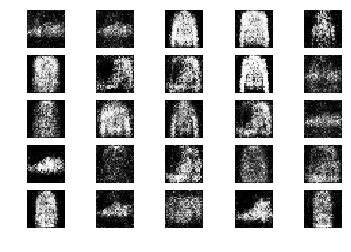

1501 [D loss: 0.610125, acc.: 65.62%] [G loss: 0.976495]
1502 [D loss: 0.609887, acc.: 65.62%] [G loss: 0.943251]
1503 [D loss: 0.609324, acc.: 67.19%] [G loss: 0.969602]
1504 [D loss: 0.650241, acc.: 64.06%] [G loss: 0.880968]
1505 [D loss: 0.615659, acc.: 71.88%] [G loss: 0.944373]
1506 [D loss: 0.600584, acc.: 68.75%] [G loss: 0.984804]
1507 [D loss: 0.611607, acc.: 64.06%] [G loss: 0.927053]
1508 [D loss: 0.613142, acc.: 62.50%] [G loss: 0.877029]
1509 [D loss: 0.597640, acc.: 68.75%] [G loss: 0.798363]
1510 [D loss: 0.631171, acc.: 57.81%] [G loss: 0.908603]
1511 [D loss: 0.580385, acc.: 64.06%] [G loss: 0.913490]
1512 [D loss: 0.675630, acc.: 62.50%] [G loss: 0.952128]
1513 [D loss: 0.562001, acc.: 75.00%] [G loss: 0.896431]
1514 [D loss: 0.697768, acc.: 57.81%] [G loss: 0.917752]
1515 [D loss: 0.580733, acc.: 73.44%] [G loss: 0.867409]
1516 [D loss: 0.651178, acc.: 57.81%] [G loss: 0.887478]
1517 [D loss: 0.611492, acc.: 70.31%] [G loss: 0.921246]
1518 [D loss: 0.660112, acc.: 6

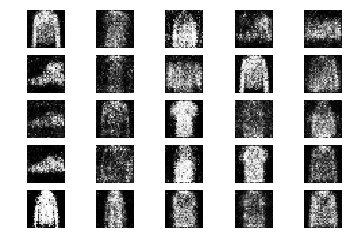

1551 [D loss: 0.572648, acc.: 70.31%] [G loss: 0.876502]
1552 [D loss: 0.648740, acc.: 64.06%] [G loss: 0.936133]
1553 [D loss: 0.569472, acc.: 73.44%] [G loss: 0.883543]
1554 [D loss: 0.656542, acc.: 62.50%] [G loss: 0.899522]
1555 [D loss: 0.593195, acc.: 70.31%] [G loss: 0.887364]
1556 [D loss: 0.558440, acc.: 76.56%] [G loss: 0.886022]
1557 [D loss: 0.584149, acc.: 75.00%] [G loss: 0.855887]
1558 [D loss: 0.643781, acc.: 60.94%] [G loss: 0.905963]
1559 [D loss: 0.590448, acc.: 64.06%] [G loss: 0.945337]
1560 [D loss: 0.655010, acc.: 64.06%] [G loss: 0.891616]
1561 [D loss: 0.617443, acc.: 65.62%] [G loss: 0.940904]
1562 [D loss: 0.635320, acc.: 59.38%] [G loss: 0.920657]
1563 [D loss: 0.659639, acc.: 53.12%] [G loss: 0.872730]
1564 [D loss: 0.685705, acc.: 57.81%] [G loss: 0.916431]
1565 [D loss: 0.616772, acc.: 67.19%] [G loss: 0.873123]
1566 [D loss: 0.612746, acc.: 64.06%] [G loss: 0.927615]
1567 [D loss: 0.613064, acc.: 67.19%] [G loss: 0.896350]
1568 [D loss: 0.606371, acc.: 7

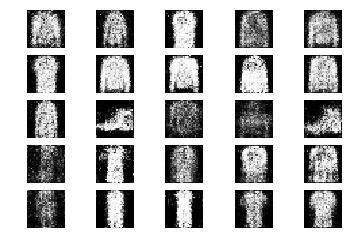

1601 [D loss: 0.593879, acc.: 65.62%] [G loss: 0.894344]
1602 [D loss: 0.573165, acc.: 70.31%] [G loss: 0.932836]
1603 [D loss: 0.618811, acc.: 60.94%] [G loss: 0.877674]
1604 [D loss: 0.622752, acc.: 62.50%] [G loss: 0.954317]
1605 [D loss: 0.615293, acc.: 62.50%] [G loss: 0.902328]
1606 [D loss: 0.688985, acc.: 62.50%] [G loss: 0.905440]
1607 [D loss: 0.580721, acc.: 73.44%] [G loss: 0.810860]
1608 [D loss: 0.615506, acc.: 60.94%] [G loss: 0.906596]
1609 [D loss: 0.639221, acc.: 57.81%] [G loss: 0.929588]
1610 [D loss: 0.591524, acc.: 73.44%] [G loss: 0.998392]
1611 [D loss: 0.603921, acc.: 67.19%] [G loss: 0.880138]
1612 [D loss: 0.581741, acc.: 76.56%] [G loss: 0.859625]
1613 [D loss: 0.606996, acc.: 67.19%] [G loss: 0.929989]
1614 [D loss: 0.626747, acc.: 67.19%] [G loss: 0.934698]
1615 [D loss: 0.668548, acc.: 59.38%] [G loss: 0.923206]
1616 [D loss: 0.675637, acc.: 60.94%] [G loss: 0.897475]
1617 [D loss: 0.612722, acc.: 67.19%] [G loss: 0.856339]
1618 [D loss: 0.656653, acc.: 6

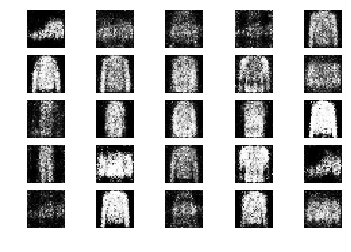

1651 [D loss: 0.625742, acc.: 62.50%] [G loss: 0.828708]
1652 [D loss: 0.539451, acc.: 71.88%] [G loss: 0.936482]
1653 [D loss: 0.593457, acc.: 70.31%] [G loss: 0.869363]
1654 [D loss: 0.638000, acc.: 54.69%] [G loss: 0.805434]
1655 [D loss: 0.629227, acc.: 60.94%] [G loss: 0.926352]
1656 [D loss: 0.643383, acc.: 65.62%] [G loss: 0.948360]
1657 [D loss: 0.645110, acc.: 57.81%] [G loss: 0.949543]
1658 [D loss: 0.617404, acc.: 70.31%] [G loss: 0.872886]
1659 [D loss: 0.619975, acc.: 64.06%] [G loss: 0.932895]
1660 [D loss: 0.599427, acc.: 71.88%] [G loss: 0.875697]
1661 [D loss: 0.671852, acc.: 62.50%] [G loss: 0.970983]
1662 [D loss: 0.625229, acc.: 67.19%] [G loss: 0.875888]
1663 [D loss: 0.665585, acc.: 53.12%] [G loss: 0.928185]
1664 [D loss: 0.663007, acc.: 67.19%] [G loss: 0.910455]
1665 [D loss: 0.602438, acc.: 67.19%] [G loss: 0.891938]
1666 [D loss: 0.634798, acc.: 60.94%] [G loss: 0.909808]
1667 [D loss: 0.580750, acc.: 70.31%] [G loss: 0.863764]
1668 [D loss: 0.631193, acc.: 6

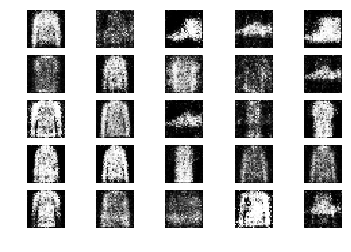

1701 [D loss: 0.632767, acc.: 57.81%] [G loss: 0.838817]
1702 [D loss: 0.611088, acc.: 73.44%] [G loss: 0.777394]
1703 [D loss: 0.628284, acc.: 59.38%] [G loss: 0.798018]
1704 [D loss: 0.652596, acc.: 64.06%] [G loss: 0.850691]
1705 [D loss: 0.678201, acc.: 56.25%] [G loss: 0.883951]
1706 [D loss: 0.638190, acc.: 65.62%] [G loss: 0.992494]
1707 [D loss: 0.611357, acc.: 70.31%] [G loss: 0.896519]
1708 [D loss: 0.580411, acc.: 68.75%] [G loss: 0.928458]
1709 [D loss: 0.600617, acc.: 67.19%] [G loss: 0.925035]
1710 [D loss: 0.624504, acc.: 71.88%] [G loss: 0.850610]
1711 [D loss: 0.698428, acc.: 51.56%] [G loss: 0.838009]
1712 [D loss: 0.570062, acc.: 78.12%] [G loss: 0.929851]
1713 [D loss: 0.587570, acc.: 78.12%] [G loss: 0.936249]
1714 [D loss: 0.618250, acc.: 73.44%] [G loss: 0.960558]
1715 [D loss: 0.590711, acc.: 82.81%] [G loss: 0.971111]
1716 [D loss: 0.601086, acc.: 75.00%] [G loss: 0.891781]
1717 [D loss: 0.625002, acc.: 67.19%] [G loss: 0.905702]
1718 [D loss: 0.636408, acc.: 6

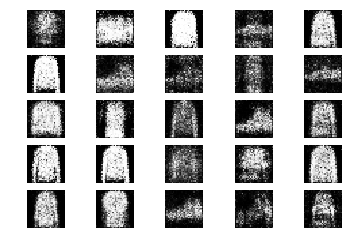

1751 [D loss: 0.593395, acc.: 67.19%] [G loss: 0.856248]
1752 [D loss: 0.672377, acc.: 62.50%] [G loss: 0.873543]
1753 [D loss: 0.509945, acc.: 78.12%] [G loss: 0.968726]
1754 [D loss: 0.589782, acc.: 62.50%] [G loss: 0.927590]
1755 [D loss: 0.620905, acc.: 68.75%] [G loss: 0.946407]
1756 [D loss: 0.612137, acc.: 67.19%] [G loss: 0.928835]
1757 [D loss: 0.547483, acc.: 75.00%] [G loss: 0.927336]
1758 [D loss: 0.622828, acc.: 67.19%] [G loss: 0.936131]
1759 [D loss: 0.714248, acc.: 53.12%] [G loss: 0.933682]
1760 [D loss: 0.550120, acc.: 78.12%] [G loss: 1.054216]
1761 [D loss: 0.702191, acc.: 59.38%] [G loss: 0.943895]
1762 [D loss: 0.561461, acc.: 76.56%] [G loss: 0.944538]
1763 [D loss: 0.626966, acc.: 64.06%] [G loss: 0.884529]
1764 [D loss: 0.674522, acc.: 59.38%] [G loss: 0.938129]
1765 [D loss: 0.593063, acc.: 68.75%] [G loss: 0.937538]
1766 [D loss: 0.616139, acc.: 68.75%] [G loss: 1.042295]
1767 [D loss: 0.662573, acc.: 62.50%] [G loss: 0.982892]
1768 [D loss: 0.572466, acc.: 7

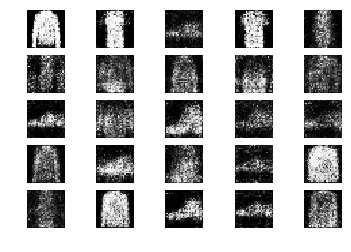

1801 [D loss: 0.663715, acc.: 65.62%] [G loss: 0.810869]
1802 [D loss: 0.651464, acc.: 59.38%] [G loss: 0.897016]
1803 [D loss: 0.607060, acc.: 65.62%] [G loss: 0.897580]
1804 [D loss: 0.611326, acc.: 67.19%] [G loss: 0.830732]
1805 [D loss: 0.622804, acc.: 71.88%] [G loss: 0.855608]
1806 [D loss: 0.636683, acc.: 64.06%] [G loss: 0.955596]
1807 [D loss: 0.671958, acc.: 54.69%] [G loss: 0.975592]
1808 [D loss: 0.595247, acc.: 68.75%] [G loss: 0.995272]
1809 [D loss: 0.598858, acc.: 70.31%] [G loss: 0.994900]
1810 [D loss: 0.585080, acc.: 76.56%] [G loss: 0.911827]
1811 [D loss: 0.658397, acc.: 54.69%] [G loss: 0.994508]
1812 [D loss: 0.644889, acc.: 60.94%] [G loss: 0.951426]
1813 [D loss: 0.633255, acc.: 62.50%] [G loss: 0.854082]
1814 [D loss: 0.677244, acc.: 54.69%] [G loss: 0.891981]
1815 [D loss: 0.644198, acc.: 65.62%] [G loss: 0.908698]
1816 [D loss: 0.630231, acc.: 64.06%] [G loss: 0.964303]
1817 [D loss: 0.683796, acc.: 65.62%] [G loss: 0.869981]
1818 [D loss: 0.618550, acc.: 6

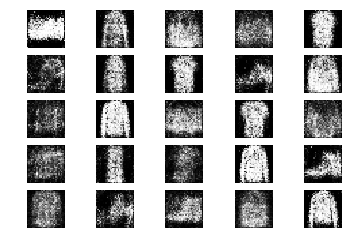

1851 [D loss: 0.639328, acc.: 56.25%] [G loss: 0.870214]
1852 [D loss: 0.609687, acc.: 67.19%] [G loss: 0.866405]
1853 [D loss: 0.614705, acc.: 68.75%] [G loss: 0.902611]
1854 [D loss: 0.621734, acc.: 65.62%] [G loss: 0.859012]
1855 [D loss: 0.655820, acc.: 65.62%] [G loss: 0.919108]
1856 [D loss: 0.616733, acc.: 59.38%] [G loss: 0.846157]
1857 [D loss: 0.642021, acc.: 59.38%] [G loss: 0.865904]
1858 [D loss: 0.561692, acc.: 75.00%] [G loss: 0.935268]
1859 [D loss: 0.618075, acc.: 71.88%] [G loss: 0.852569]
1860 [D loss: 0.540464, acc.: 76.56%] [G loss: 0.997859]
1861 [D loss: 0.724507, acc.: 54.69%] [G loss: 0.975495]
1862 [D loss: 0.678521, acc.: 60.94%] [G loss: 0.972207]
1863 [D loss: 0.672665, acc.: 57.81%] [G loss: 0.956571]
1864 [D loss: 0.637121, acc.: 60.94%] [G loss: 0.888898]
1865 [D loss: 0.704203, acc.: 50.00%] [G loss: 0.875296]
1866 [D loss: 0.643974, acc.: 68.75%] [G loss: 0.881615]
1867 [D loss: 0.647644, acc.: 62.50%] [G loss: 0.836057]
1868 [D loss: 0.633240, acc.: 5

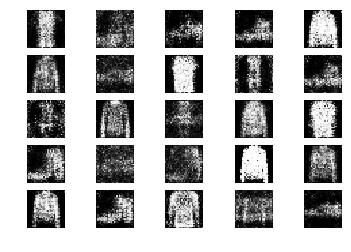

1901 [D loss: 0.616976, acc.: 68.75%] [G loss: 0.894537]
1902 [D loss: 0.655744, acc.: 65.62%] [G loss: 0.867876]
1903 [D loss: 0.577610, acc.: 65.62%] [G loss: 0.915040]
1904 [D loss: 0.716147, acc.: 60.94%] [G loss: 0.927370]
1905 [D loss: 0.538910, acc.: 79.69%] [G loss: 0.915023]
1906 [D loss: 0.604007, acc.: 65.62%] [G loss: 0.927929]
1907 [D loss: 0.546517, acc.: 79.69%] [G loss: 0.909389]
1908 [D loss: 0.609549, acc.: 67.19%] [G loss: 0.985000]
1909 [D loss: 0.628962, acc.: 68.75%] [G loss: 1.034598]
1910 [D loss: 0.647192, acc.: 56.25%] [G loss: 0.925466]
1911 [D loss: 0.572293, acc.: 75.00%] [G loss: 1.031104]
1912 [D loss: 0.629715, acc.: 64.06%] [G loss: 0.947091]
1913 [D loss: 0.655457, acc.: 57.81%] [G loss: 0.899037]
1914 [D loss: 0.579733, acc.: 70.31%] [G loss: 0.965841]
1915 [D loss: 0.662447, acc.: 60.94%] [G loss: 1.000506]
1916 [D loss: 0.600041, acc.: 64.06%] [G loss: 0.944683]
1917 [D loss: 0.612328, acc.: 67.19%] [G loss: 0.928816]
1918 [D loss: 0.646255, acc.: 5

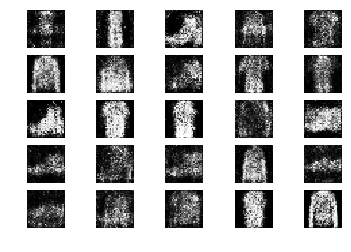

1951 [D loss: 0.659294, acc.: 65.62%] [G loss: 0.850501]
1952 [D loss: 0.648963, acc.: 60.94%] [G loss: 0.925067]
1953 [D loss: 0.576483, acc.: 70.31%] [G loss: 0.958469]
1954 [D loss: 0.601762, acc.: 75.00%] [G loss: 0.826332]
1955 [D loss: 0.642555, acc.: 54.69%] [G loss: 0.977780]
1956 [D loss: 0.591006, acc.: 62.50%] [G loss: 0.988192]
1957 [D loss: 0.580964, acc.: 70.31%] [G loss: 0.864641]
1958 [D loss: 0.640474, acc.: 62.50%] [G loss: 0.851466]
1959 [D loss: 0.677981, acc.: 50.00%] [G loss: 0.867097]
1960 [D loss: 0.710146, acc.: 53.12%] [G loss: 0.945039]
1961 [D loss: 0.650753, acc.: 59.38%] [G loss: 0.881537]
1962 [D loss: 0.590467, acc.: 73.44%] [G loss: 0.910929]
1963 [D loss: 0.614380, acc.: 62.50%] [G loss: 0.895699]
1964 [D loss: 0.619942, acc.: 64.06%] [G loss: 0.820951]
1965 [D loss: 0.654107, acc.: 59.38%] [G loss: 0.802869]
1966 [D loss: 0.632764, acc.: 60.94%] [G loss: 0.899848]
1967 [D loss: 0.622210, acc.: 59.38%] [G loss: 0.925256]
1968 [D loss: 0.642872, acc.: 5

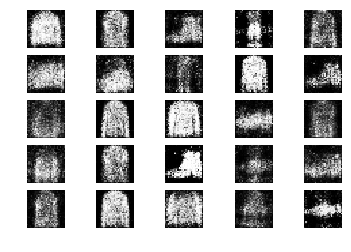

2001 [D loss: 0.608954, acc.: 70.31%] [G loss: 0.899809]
2002 [D loss: 0.638320, acc.: 68.75%] [G loss: 0.881284]
2003 [D loss: 0.635442, acc.: 62.50%] [G loss: 0.910728]
2004 [D loss: 0.638519, acc.: 57.81%] [G loss: 0.914144]
2005 [D loss: 0.639599, acc.: 65.62%] [G loss: 0.943389]
2006 [D loss: 0.641688, acc.: 64.06%] [G loss: 0.871074]
2007 [D loss: 0.542852, acc.: 75.00%] [G loss: 0.901552]
2008 [D loss: 0.583572, acc.: 71.88%] [G loss: 0.905093]
2009 [D loss: 0.602667, acc.: 62.50%] [G loss: 0.864231]
2010 [D loss: 0.572224, acc.: 75.00%] [G loss: 1.011066]
2011 [D loss: 0.553346, acc.: 78.12%] [G loss: 0.903361]
2012 [D loss: 0.602234, acc.: 70.31%] [G loss: 0.925794]
2013 [D loss: 0.603762, acc.: 70.31%] [G loss: 0.921087]
2014 [D loss: 0.645420, acc.: 67.19%] [G loss: 0.966956]
2015 [D loss: 0.602894, acc.: 59.38%] [G loss: 0.818832]
2016 [D loss: 0.591101, acc.: 71.88%] [G loss: 0.895381]
2017 [D loss: 0.641818, acc.: 68.75%] [G loss: 0.945162]
2018 [D loss: 0.576536, acc.: 7

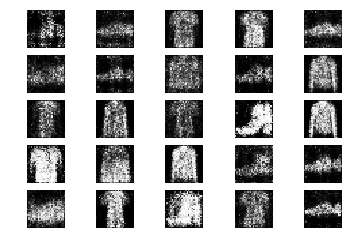

2051 [D loss: 0.649815, acc.: 59.38%] [G loss: 0.920689]
2052 [D loss: 0.523096, acc.: 85.94%] [G loss: 0.963689]
2053 [D loss: 0.608135, acc.: 65.62%] [G loss: 0.921582]
2054 [D loss: 0.675722, acc.: 54.69%] [G loss: 0.918886]
2055 [D loss: 0.587609, acc.: 73.44%] [G loss: 0.902563]
2056 [D loss: 0.658456, acc.: 53.12%] [G loss: 0.937513]
2057 [D loss: 0.577019, acc.: 71.88%] [G loss: 0.947232]
2058 [D loss: 0.565809, acc.: 71.88%] [G loss: 1.000398]
2059 [D loss: 0.654716, acc.: 60.94%] [G loss: 0.973459]
2060 [D loss: 0.673740, acc.: 65.62%] [G loss: 0.876951]
2061 [D loss: 0.655719, acc.: 64.06%] [G loss: 0.882690]
2062 [D loss: 0.640562, acc.: 62.50%] [G loss: 0.863218]
2063 [D loss: 0.655185, acc.: 60.94%] [G loss: 0.938605]
2064 [D loss: 0.644019, acc.: 60.94%] [G loss: 0.922777]
2065 [D loss: 0.733455, acc.: 53.12%] [G loss: 0.893085]
2066 [D loss: 0.642153, acc.: 59.38%] [G loss: 0.888913]
2067 [D loss: 0.639493, acc.: 62.50%] [G loss: 0.919313]
2068 [D loss: 0.698475, acc.: 5

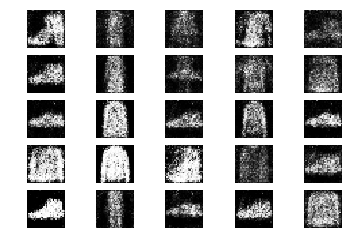

2101 [D loss: 0.659035, acc.: 54.69%] [G loss: 0.927053]
2102 [D loss: 0.703838, acc.: 53.12%] [G loss: 0.792066]
2103 [D loss: 0.649136, acc.: 65.62%] [G loss: 0.828175]
2104 [D loss: 0.611169, acc.: 65.62%] [G loss: 0.907038]
2105 [D loss: 0.646056, acc.: 62.50%] [G loss: 0.844177]
2106 [D loss: 0.561903, acc.: 75.00%] [G loss: 0.896213]
2107 [D loss: 0.640198, acc.: 60.94%] [G loss: 0.863863]
2108 [D loss: 0.638119, acc.: 62.50%] [G loss: 0.897350]
2109 [D loss: 0.566831, acc.: 82.81%] [G loss: 0.820419]
2110 [D loss: 0.620487, acc.: 68.75%] [G loss: 0.940380]
2111 [D loss: 0.532102, acc.: 75.00%] [G loss: 0.890769]
2112 [D loss: 0.661859, acc.: 57.81%] [G loss: 0.888054]
2113 [D loss: 0.688096, acc.: 62.50%] [G loss: 0.852906]
2114 [D loss: 0.598491, acc.: 62.50%] [G loss: 0.835573]
2115 [D loss: 0.626776, acc.: 65.62%] [G loss: 0.925975]
2116 [D loss: 0.615310, acc.: 60.94%] [G loss: 0.902955]
2117 [D loss: 0.687727, acc.: 68.75%] [G loss: 0.979608]
2118 [D loss: 0.629927, acc.: 6

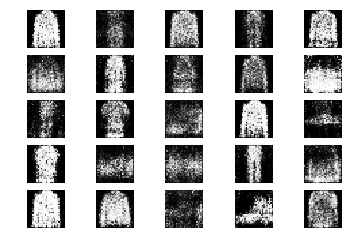

2151 [D loss: 0.661053, acc.: 60.94%] [G loss: 0.882336]
2152 [D loss: 0.557726, acc.: 78.12%] [G loss: 0.893008]
2153 [D loss: 0.594391, acc.: 71.88%] [G loss: 0.882371]
2154 [D loss: 0.695884, acc.: 53.12%] [G loss: 0.904112]
2155 [D loss: 0.674054, acc.: 43.75%] [G loss: 1.017239]
2156 [D loss: 0.581672, acc.: 76.56%] [G loss: 1.039890]
2157 [D loss: 0.698456, acc.: 54.69%] [G loss: 0.837794]
2158 [D loss: 0.637113, acc.: 65.62%] [G loss: 0.849005]
2159 [D loss: 0.737495, acc.: 51.56%] [G loss: 0.863348]
2160 [D loss: 0.629538, acc.: 64.06%] [G loss: 0.893509]
2161 [D loss: 0.617511, acc.: 70.31%] [G loss: 0.941848]
2162 [D loss: 0.616722, acc.: 67.19%] [G loss: 0.989970]
2163 [D loss: 0.616463, acc.: 68.75%] [G loss: 1.058702]
2164 [D loss: 0.652150, acc.: 62.50%] [G loss: 0.891948]
2165 [D loss: 0.631442, acc.: 70.31%] [G loss: 0.835815]
2166 [D loss: 0.662556, acc.: 67.19%] [G loss: 0.890048]
2167 [D loss: 0.672312, acc.: 56.25%] [G loss: 1.055509]
2168 [D loss: 0.612152, acc.: 7

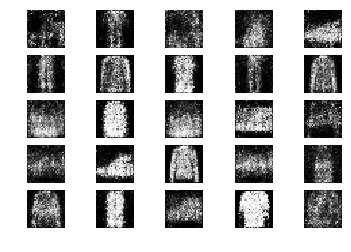

2201 [D loss: 0.594198, acc.: 71.88%] [G loss: 0.921654]
2202 [D loss: 0.580788, acc.: 73.44%] [G loss: 0.938829]
2203 [D loss: 0.548245, acc.: 76.56%] [G loss: 0.890558]
2204 [D loss: 0.597250, acc.: 70.31%] [G loss: 0.903360]
2205 [D loss: 0.606795, acc.: 64.06%] [G loss: 0.982451]
2206 [D loss: 0.662661, acc.: 64.06%] [G loss: 0.966605]
2207 [D loss: 0.612567, acc.: 62.50%] [G loss: 0.992843]
2208 [D loss: 0.609365, acc.: 73.44%] [G loss: 0.871880]
2209 [D loss: 0.594083, acc.: 68.75%] [G loss: 0.957723]
2210 [D loss: 0.545514, acc.: 82.81%] [G loss: 0.977762]
2211 [D loss: 0.604339, acc.: 67.19%] [G loss: 0.995924]
2212 [D loss: 0.624861, acc.: 64.06%] [G loss: 0.861796]
2213 [D loss: 0.686622, acc.: 54.69%] [G loss: 0.847766]
2214 [D loss: 0.604261, acc.: 62.50%] [G loss: 0.875058]
2215 [D loss: 0.537765, acc.: 81.25%] [G loss: 1.014950]
2216 [D loss: 0.646950, acc.: 62.50%] [G loss: 0.917985]
2217 [D loss: 0.619837, acc.: 68.75%] [G loss: 0.852932]
2218 [D loss: 0.659984, acc.: 6

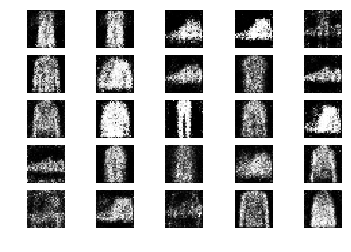

2251 [D loss: 0.590466, acc.: 68.75%] [G loss: 0.877354]
2252 [D loss: 0.620570, acc.: 64.06%] [G loss: 0.924690]
2253 [D loss: 0.598095, acc.: 75.00%] [G loss: 0.825099]
2254 [D loss: 0.681747, acc.: 53.12%] [G loss: 0.934663]
2255 [D loss: 0.559601, acc.: 71.88%] [G loss: 0.871655]
2256 [D loss: 0.559504, acc.: 76.56%] [G loss: 0.937480]
2257 [D loss: 0.612561, acc.: 64.06%] [G loss: 0.949472]
2258 [D loss: 0.614273, acc.: 65.62%] [G loss: 0.947433]
2259 [D loss: 0.636011, acc.: 57.81%] [G loss: 0.937897]
2260 [D loss: 0.621501, acc.: 59.38%] [G loss: 0.965932]
2261 [D loss: 0.623419, acc.: 64.06%] [G loss: 0.898395]
2262 [D loss: 0.675363, acc.: 57.81%] [G loss: 0.949405]
2263 [D loss: 0.579439, acc.: 71.88%] [G loss: 1.024333]
2264 [D loss: 0.601226, acc.: 68.75%] [G loss: 1.036163]
2265 [D loss: 0.592530, acc.: 70.31%] [G loss: 0.950922]
2266 [D loss: 0.621893, acc.: 60.94%] [G loss: 0.987971]
2267 [D loss: 0.632907, acc.: 68.75%] [G loss: 0.935104]
2268 [D loss: 0.611330, acc.: 7

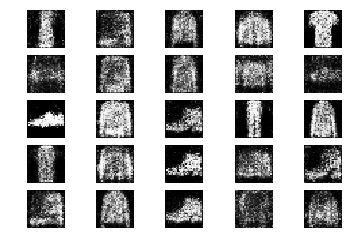

2301 [D loss: 0.633002, acc.: 70.31%] [G loss: 0.985712]
2302 [D loss: 0.658516, acc.: 62.50%] [G loss: 0.881869]
2303 [D loss: 0.575206, acc.: 75.00%] [G loss: 0.906040]
2304 [D loss: 0.653030, acc.: 59.38%] [G loss: 0.908676]
2305 [D loss: 0.616481, acc.: 68.75%] [G loss: 0.943813]
2306 [D loss: 0.604414, acc.: 67.19%] [G loss: 0.914007]
2307 [D loss: 0.575590, acc.: 70.31%] [G loss: 0.909640]
2308 [D loss: 0.596054, acc.: 64.06%] [G loss: 0.893079]
2309 [D loss: 0.577467, acc.: 75.00%] [G loss: 1.062646]
2310 [D loss: 0.636285, acc.: 65.62%] [G loss: 1.062934]
2311 [D loss: 0.612641, acc.: 67.19%] [G loss: 0.997231]
2312 [D loss: 0.658411, acc.: 59.38%] [G loss: 0.983676]
2313 [D loss: 0.703376, acc.: 54.69%] [G loss: 0.941256]
2314 [D loss: 0.581213, acc.: 65.62%] [G loss: 0.819155]
2315 [D loss: 0.587686, acc.: 65.62%] [G loss: 0.877992]
2316 [D loss: 0.616428, acc.: 60.94%] [G loss: 0.898023]
2317 [D loss: 0.571713, acc.: 70.31%] [G loss: 0.982273]
2318 [D loss: 0.619417, acc.: 7

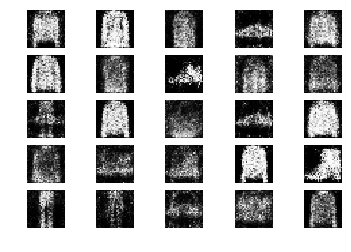

2351 [D loss: 0.595727, acc.: 68.75%] [G loss: 0.911813]
2352 [D loss: 0.672631, acc.: 59.38%] [G loss: 0.917434]
2353 [D loss: 0.614388, acc.: 60.94%] [G loss: 0.919818]
2354 [D loss: 0.673382, acc.: 51.56%] [G loss: 0.870229]
2355 [D loss: 0.583070, acc.: 68.75%] [G loss: 0.876553]
2356 [D loss: 0.662196, acc.: 65.62%] [G loss: 0.933341]
2357 [D loss: 0.625632, acc.: 64.06%] [G loss: 1.077081]
2358 [D loss: 0.588232, acc.: 65.62%] [G loss: 0.923636]
2359 [D loss: 0.596693, acc.: 70.31%] [G loss: 0.888342]
2360 [D loss: 0.607051, acc.: 67.19%] [G loss: 0.874828]
2361 [D loss: 0.578588, acc.: 78.12%] [G loss: 0.906527]
2362 [D loss: 0.606908, acc.: 68.75%] [G loss: 0.836168]
2363 [D loss: 0.627494, acc.: 62.50%] [G loss: 0.960157]
2364 [D loss: 0.631157, acc.: 62.50%] [G loss: 0.942836]
2365 [D loss: 0.596278, acc.: 65.62%] [G loss: 0.979329]
2366 [D loss: 0.625082, acc.: 65.62%] [G loss: 0.921989]
2367 [D loss: 0.694070, acc.: 54.69%] [G loss: 0.988996]
2368 [D loss: 0.624786, acc.: 5

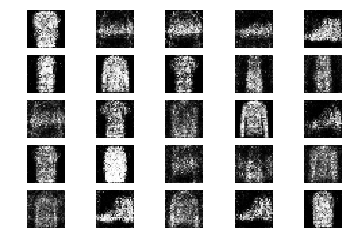

2401 [D loss: 0.617001, acc.: 65.62%] [G loss: 0.857354]
2402 [D loss: 0.616749, acc.: 68.75%] [G loss: 1.005441]
2403 [D loss: 0.654440, acc.: 62.50%] [G loss: 0.969196]
2404 [D loss: 0.625237, acc.: 67.19%] [G loss: 1.011334]
2405 [D loss: 0.626284, acc.: 65.62%] [G loss: 0.929807]
2406 [D loss: 0.611001, acc.: 62.50%] [G loss: 0.910537]
2407 [D loss: 0.592674, acc.: 71.88%] [G loss: 0.868158]
2408 [D loss: 0.616987, acc.: 64.06%] [G loss: 0.889436]
2409 [D loss: 0.652019, acc.: 60.94%] [G loss: 0.974992]
2410 [D loss: 0.671664, acc.: 51.56%] [G loss: 0.965488]
2411 [D loss: 0.644957, acc.: 62.50%] [G loss: 1.044902]
2412 [D loss: 0.666853, acc.: 57.81%] [G loss: 0.979672]
2413 [D loss: 0.601717, acc.: 73.44%] [G loss: 0.915978]
2414 [D loss: 0.597095, acc.: 68.75%] [G loss: 1.025773]
2415 [D loss: 0.609047, acc.: 64.06%] [G loss: 0.935260]
2416 [D loss: 0.594856, acc.: 67.19%] [G loss: 0.937938]
2417 [D loss: 0.621144, acc.: 59.38%] [G loss: 0.860763]
2418 [D loss: 0.575439, acc.: 7

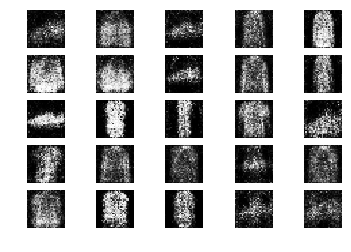

2451 [D loss: 0.609194, acc.: 68.75%] [G loss: 0.981187]
2452 [D loss: 0.669470, acc.: 53.12%] [G loss: 0.991040]
2453 [D loss: 0.582582, acc.: 71.88%] [G loss: 0.963773]
2454 [D loss: 0.584651, acc.: 67.19%] [G loss: 0.936417]
2455 [D loss: 0.665631, acc.: 64.06%] [G loss: 0.933833]
2456 [D loss: 0.662074, acc.: 67.19%] [G loss: 0.983020]
2457 [D loss: 0.559825, acc.: 76.56%] [G loss: 0.937066]
2458 [D loss: 0.578414, acc.: 68.75%] [G loss: 0.946877]
2459 [D loss: 0.552418, acc.: 75.00%] [G loss: 0.907696]
2460 [D loss: 0.560210, acc.: 70.31%] [G loss: 1.065422]
2461 [D loss: 0.605135, acc.: 73.44%] [G loss: 0.953494]
2462 [D loss: 0.621401, acc.: 68.75%] [G loss: 0.939442]
2463 [D loss: 0.645806, acc.: 68.75%] [G loss: 0.908780]
2464 [D loss: 0.585718, acc.: 65.62%] [G loss: 0.945417]
2465 [D loss: 0.558798, acc.: 73.44%] [G loss: 1.033017]
2466 [D loss: 0.641174, acc.: 67.19%] [G loss: 0.919302]
2467 [D loss: 0.697117, acc.: 54.69%] [G loss: 0.956881]
2468 [D loss: 0.568596, acc.: 6

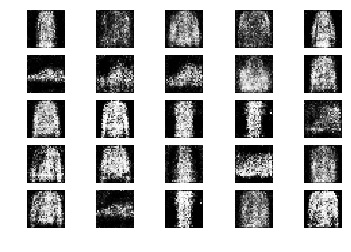

2501 [D loss: 0.638880, acc.: 64.06%] [G loss: 1.076370]
2502 [D loss: 0.618449, acc.: 54.69%] [G loss: 0.973257]
2503 [D loss: 0.690658, acc.: 60.94%] [G loss: 0.934191]
2504 [D loss: 0.575525, acc.: 71.88%] [G loss: 0.885419]
2505 [D loss: 0.637765, acc.: 59.38%] [G loss: 0.922348]
2506 [D loss: 0.650970, acc.: 64.06%] [G loss: 0.969392]
2507 [D loss: 0.596002, acc.: 67.19%] [G loss: 0.953973]
2508 [D loss: 0.636925, acc.: 60.94%] [G loss: 0.977376]
2509 [D loss: 0.599357, acc.: 68.75%] [G loss: 0.929447]
2510 [D loss: 0.657107, acc.: 65.62%] [G loss: 0.936194]
2511 [D loss: 0.596594, acc.: 71.88%] [G loss: 0.958558]
2512 [D loss: 0.551185, acc.: 71.88%] [G loss: 0.951096]
2513 [D loss: 0.598612, acc.: 68.75%] [G loss: 0.954351]
2514 [D loss: 0.608650, acc.: 65.62%] [G loss: 0.931124]
2515 [D loss: 0.700536, acc.: 57.81%] [G loss: 0.891075]
2516 [D loss: 0.570349, acc.: 76.56%] [G loss: 0.932491]
2517 [D loss: 0.558505, acc.: 76.56%] [G loss: 1.019572]
2518 [D loss: 0.610454, acc.: 7

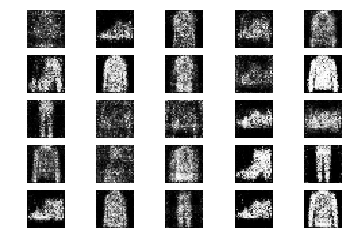

2551 [D loss: 0.616639, acc.: 64.06%] [G loss: 0.931688]
2552 [D loss: 0.572920, acc.: 68.75%] [G loss: 0.872688]
2553 [D loss: 0.672594, acc.: 51.56%] [G loss: 0.913737]
2554 [D loss: 0.605083, acc.: 64.06%] [G loss: 0.914270]
2555 [D loss: 0.647909, acc.: 62.50%] [G loss: 0.884620]
2556 [D loss: 0.634970, acc.: 60.94%] [G loss: 0.946727]
2557 [D loss: 0.640312, acc.: 64.06%] [G loss: 1.007331]
2558 [D loss: 0.562052, acc.: 78.12%] [G loss: 0.864722]
2559 [D loss: 0.669160, acc.: 60.94%] [G loss: 0.966768]
2560 [D loss: 0.628329, acc.: 62.50%] [G loss: 0.934654]
2561 [D loss: 0.645371, acc.: 64.06%] [G loss: 1.066732]
2562 [D loss: 0.648433, acc.: 64.06%] [G loss: 0.916469]
2563 [D loss: 0.576604, acc.: 71.88%] [G loss: 0.845778]
2564 [D loss: 0.612037, acc.: 68.75%] [G loss: 0.936703]
2565 [D loss: 0.591416, acc.: 68.75%] [G loss: 0.927301]
2566 [D loss: 0.592999, acc.: 73.44%] [G loss: 0.948351]
2567 [D loss: 0.614316, acc.: 60.94%] [G loss: 0.821761]
2568 [D loss: 0.601193, acc.: 7

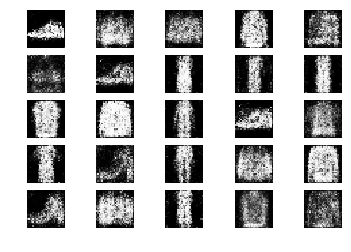

2601 [D loss: 0.596701, acc.: 70.31%] [G loss: 0.950989]
2602 [D loss: 0.598541, acc.: 70.31%] [G loss: 0.992843]
2603 [D loss: 0.588957, acc.: 70.31%] [G loss: 1.048561]
2604 [D loss: 0.639017, acc.: 59.38%] [G loss: 0.918948]
2605 [D loss: 0.564296, acc.: 70.31%] [G loss: 1.000153]
2606 [D loss: 0.662210, acc.: 62.50%] [G loss: 0.913077]
2607 [D loss: 0.605164, acc.: 70.31%] [G loss: 1.005846]
2608 [D loss: 0.571147, acc.: 68.75%] [G loss: 1.011287]
2609 [D loss: 0.518730, acc.: 75.00%] [G loss: 0.955359]
2610 [D loss: 0.602355, acc.: 73.44%] [G loss: 0.866114]
2611 [D loss: 0.651532, acc.: 65.62%] [G loss: 0.971415]
2612 [D loss: 0.591484, acc.: 68.75%] [G loss: 0.977858]
2613 [D loss: 0.545793, acc.: 79.69%] [G loss: 0.886943]
2614 [D loss: 0.654668, acc.: 57.81%] [G loss: 1.032581]
2615 [D loss: 0.614129, acc.: 65.62%] [G loss: 1.048314]
2616 [D loss: 0.639407, acc.: 60.94%] [G loss: 1.124755]
2617 [D loss: 0.725354, acc.: 56.25%] [G loss: 0.991537]
2618 [D loss: 0.627845, acc.: 6

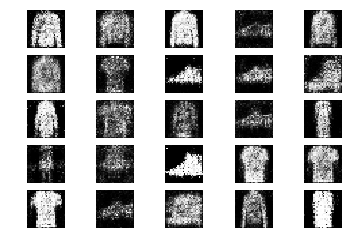

2651 [D loss: 0.640531, acc.: 64.06%] [G loss: 0.901809]
2652 [D loss: 0.577786, acc.: 67.19%] [G loss: 0.883097]
2653 [D loss: 0.634944, acc.: 67.19%] [G loss: 0.883112]
2654 [D loss: 0.605002, acc.: 75.00%] [G loss: 0.858894]
2655 [D loss: 0.648568, acc.: 62.50%] [G loss: 0.916053]
2656 [D loss: 0.612138, acc.: 62.50%] [G loss: 1.005247]
2657 [D loss: 0.624211, acc.: 70.31%] [G loss: 0.955211]
2658 [D loss: 0.660343, acc.: 57.81%] [G loss: 0.920244]
2659 [D loss: 0.630897, acc.: 67.19%] [G loss: 1.012659]
2660 [D loss: 0.634885, acc.: 60.94%] [G loss: 0.945354]
2661 [D loss: 0.567899, acc.: 79.69%] [G loss: 0.989191]
2662 [D loss: 0.653449, acc.: 60.94%] [G loss: 0.942113]
2663 [D loss: 0.579067, acc.: 65.62%] [G loss: 0.850157]
2664 [D loss: 0.544936, acc.: 70.31%] [G loss: 1.003248]
2665 [D loss: 0.586983, acc.: 71.88%] [G loss: 0.891258]
2666 [D loss: 0.667748, acc.: 54.69%] [G loss: 0.964277]
2667 [D loss: 0.635599, acc.: 65.62%] [G loss: 0.993234]
2668 [D loss: 0.584853, acc.: 7

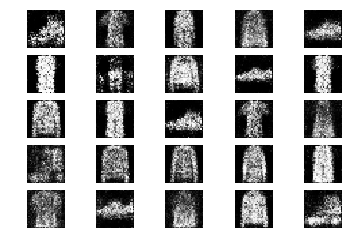

2701 [D loss: 0.624425, acc.: 67.19%] [G loss: 0.991234]
2702 [D loss: 0.698974, acc.: 53.12%] [G loss: 0.970602]
2703 [D loss: 0.668963, acc.: 57.81%] [G loss: 0.947782]
2704 [D loss: 0.629784, acc.: 62.50%] [G loss: 1.062787]
2705 [D loss: 0.685555, acc.: 51.56%] [G loss: 0.968514]
2706 [D loss: 0.682417, acc.: 59.38%] [G loss: 1.011429]
2707 [D loss: 0.549291, acc.: 70.31%] [G loss: 0.977148]
2708 [D loss: 0.605841, acc.: 64.06%] [G loss: 0.968352]
2709 [D loss: 0.586949, acc.: 64.06%] [G loss: 0.971809]
2710 [D loss: 0.713693, acc.: 51.56%] [G loss: 0.935664]
2711 [D loss: 0.656488, acc.: 62.50%] [G loss: 0.943995]
2712 [D loss: 0.563939, acc.: 73.44%] [G loss: 0.985763]
2713 [D loss: 0.603838, acc.: 68.75%] [G loss: 0.947220]
2714 [D loss: 0.600583, acc.: 62.50%] [G loss: 0.894144]
2715 [D loss: 0.660271, acc.: 60.94%] [G loss: 0.954126]
2716 [D loss: 0.623096, acc.: 68.75%] [G loss: 0.999550]
2717 [D loss: 0.551745, acc.: 76.56%] [G loss: 0.849895]
2718 [D loss: 0.583023, acc.: 6

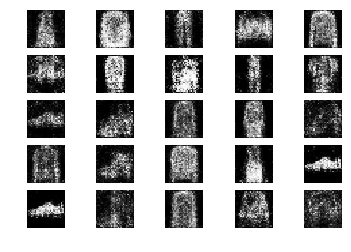

2751 [D loss: 0.604806, acc.: 70.31%] [G loss: 0.820088]
2752 [D loss: 0.567874, acc.: 73.44%] [G loss: 0.848202]
2753 [D loss: 0.595218, acc.: 75.00%] [G loss: 0.828328]
2754 [D loss: 0.690373, acc.: 60.94%] [G loss: 0.864554]
2755 [D loss: 0.663032, acc.: 64.06%] [G loss: 0.986502]
2756 [D loss: 0.633893, acc.: 62.50%] [G loss: 1.025379]
2757 [D loss: 0.649784, acc.: 62.50%] [G loss: 0.933738]
2758 [D loss: 0.622329, acc.: 65.62%] [G loss: 0.978759]
2759 [D loss: 0.664122, acc.: 56.25%] [G loss: 0.911373]
2760 [D loss: 0.634846, acc.: 59.38%] [G loss: 1.042815]
2761 [D loss: 0.660818, acc.: 59.38%] [G loss: 0.967082]
2762 [D loss: 0.646587, acc.: 59.38%] [G loss: 0.994449]
2763 [D loss: 0.551865, acc.: 73.44%] [G loss: 0.996626]
2764 [D loss: 0.723125, acc.: 50.00%] [G loss: 1.019233]
2765 [D loss: 0.622290, acc.: 64.06%] [G loss: 0.938333]
2766 [D loss: 0.628622, acc.: 62.50%] [G loss: 0.872081]
2767 [D loss: 0.635142, acc.: 62.50%] [G loss: 0.924115]
2768 [D loss: 0.565681, acc.: 7

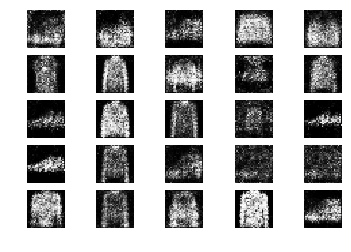

2801 [D loss: 0.624023, acc.: 67.19%] [G loss: 0.953500]
2802 [D loss: 0.555842, acc.: 71.88%] [G loss: 1.001211]
2803 [D loss: 0.535352, acc.: 73.44%] [G loss: 0.958802]
2804 [D loss: 0.592140, acc.: 67.19%] [G loss: 0.971787]
2805 [D loss: 0.611147, acc.: 64.06%] [G loss: 0.936473]
2806 [D loss: 0.637994, acc.: 64.06%] [G loss: 0.944936]
2807 [D loss: 0.631265, acc.: 64.06%] [G loss: 0.955208]
2808 [D loss: 0.573605, acc.: 70.31%] [G loss: 0.913920]
2809 [D loss: 0.658286, acc.: 67.19%] [G loss: 0.907842]
2810 [D loss: 0.624121, acc.: 60.94%] [G loss: 1.025090]
2811 [D loss: 0.619413, acc.: 59.38%] [G loss: 0.875725]
2812 [D loss: 0.634439, acc.: 59.38%] [G loss: 0.914481]
2813 [D loss: 0.598141, acc.: 56.25%] [G loss: 0.880523]
2814 [D loss: 0.545845, acc.: 75.00%] [G loss: 0.981477]
2815 [D loss: 0.629760, acc.: 57.81%] [G loss: 1.055658]
2816 [D loss: 0.581719, acc.: 68.75%] [G loss: 0.933445]
2817 [D loss: 0.708281, acc.: 56.25%] [G loss: 0.999383]
2818 [D loss: 0.554608, acc.: 7

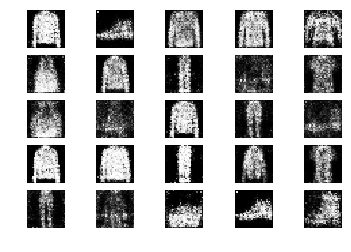

2851 [D loss: 0.632724, acc.: 70.31%] [G loss: 0.859955]
2852 [D loss: 0.698697, acc.: 60.94%] [G loss: 0.855670]
2853 [D loss: 0.651280, acc.: 56.25%] [G loss: 0.913905]
2854 [D loss: 0.579823, acc.: 68.75%] [G loss: 0.974975]
2855 [D loss: 0.614416, acc.: 65.62%] [G loss: 0.956644]
2856 [D loss: 0.626724, acc.: 56.25%] [G loss: 0.902759]
2857 [D loss: 0.651956, acc.: 70.31%] [G loss: 0.887330]
2858 [D loss: 0.602108, acc.: 68.75%] [G loss: 0.914384]
2859 [D loss: 0.632738, acc.: 70.31%] [G loss: 0.898536]
2860 [D loss: 0.646148, acc.: 62.50%] [G loss: 0.868066]
2861 [D loss: 0.647178, acc.: 54.69%] [G loss: 0.850152]
2862 [D loss: 0.596956, acc.: 60.94%] [G loss: 1.060777]
2863 [D loss: 0.703172, acc.: 57.81%] [G loss: 0.947033]
2864 [D loss: 0.628401, acc.: 59.38%] [G loss: 0.857942]
2865 [D loss: 0.593879, acc.: 70.31%] [G loss: 0.936188]
2866 [D loss: 0.584258, acc.: 73.44%] [G loss: 0.925472]
2867 [D loss: 0.676351, acc.: 57.81%] [G loss: 0.866935]
2868 [D loss: 0.633504, acc.: 6

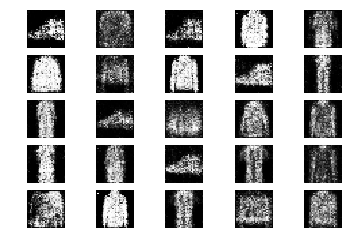

2901 [D loss: 0.632069, acc.: 64.06%] [G loss: 0.867566]
2902 [D loss: 0.627678, acc.: 64.06%] [G loss: 0.919670]
2903 [D loss: 0.646888, acc.: 59.38%] [G loss: 0.949841]
2904 [D loss: 0.642801, acc.: 60.94%] [G loss: 0.861658]
2905 [D loss: 0.629656, acc.: 62.50%] [G loss: 0.943143]
2906 [D loss: 0.609195, acc.: 65.62%] [G loss: 0.879486]
2907 [D loss: 0.611814, acc.: 67.19%] [G loss: 0.983328]
2908 [D loss: 0.654199, acc.: 59.38%] [G loss: 0.906132]
2909 [D loss: 0.619283, acc.: 65.62%] [G loss: 1.027483]
2910 [D loss: 0.633441, acc.: 54.69%] [G loss: 0.925400]
2911 [D loss: 0.592086, acc.: 71.88%] [G loss: 0.872209]
2912 [D loss: 0.587766, acc.: 70.31%] [G loss: 1.000103]
2913 [D loss: 0.552804, acc.: 73.44%] [G loss: 1.014280]
2914 [D loss: 0.586320, acc.: 70.31%] [G loss: 0.952570]
2915 [D loss: 0.607870, acc.: 65.62%] [G loss: 1.071249]
2916 [D loss: 0.596686, acc.: 70.31%] [G loss: 1.050260]
2917 [D loss: 0.562228, acc.: 73.44%] [G loss: 1.071455]
2918 [D loss: 0.668624, acc.: 5

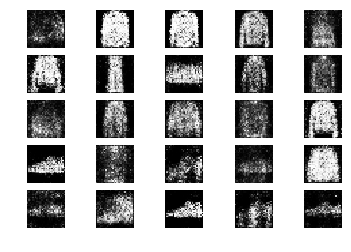

2951 [D loss: 0.632711, acc.: 57.81%] [G loss: 0.998120]
2952 [D loss: 0.627311, acc.: 62.50%] [G loss: 0.893946]
2953 [D loss: 0.590393, acc.: 68.75%] [G loss: 0.936966]
2954 [D loss: 0.601238, acc.: 68.75%] [G loss: 0.942593]
2955 [D loss: 0.625652, acc.: 67.19%] [G loss: 0.911290]
2956 [D loss: 0.573969, acc.: 73.44%] [G loss: 0.969205]
2957 [D loss: 0.561978, acc.: 79.69%] [G loss: 0.965599]
2958 [D loss: 0.671748, acc.: 57.81%] [G loss: 0.930718]
2959 [D loss: 0.674214, acc.: 62.50%] [G loss: 0.853820]
2960 [D loss: 0.588675, acc.: 68.75%] [G loss: 0.961766]
2961 [D loss: 0.654026, acc.: 59.38%] [G loss: 0.911146]
2962 [D loss: 0.656603, acc.: 62.50%] [G loss: 0.932621]
2963 [D loss: 0.696387, acc.: 62.50%] [G loss: 0.995305]
2964 [D loss: 0.643687, acc.: 64.06%] [G loss: 0.919717]
2965 [D loss: 0.618295, acc.: 75.00%] [G loss: 0.813120]
2966 [D loss: 0.613191, acc.: 68.75%] [G loss: 0.981204]
2967 [D loss: 0.667627, acc.: 60.94%] [G loss: 0.887064]
2968 [D loss: 0.686269, acc.: 5

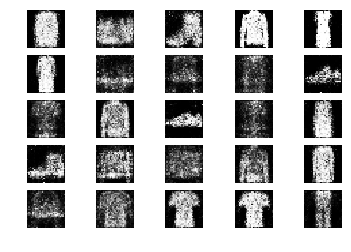

3001 [D loss: 0.637665, acc.: 62.50%] [G loss: 0.911948]
3002 [D loss: 0.590791, acc.: 71.88%] [G loss: 0.966416]
3003 [D loss: 0.624549, acc.: 62.50%] [G loss: 0.868536]
3004 [D loss: 0.554075, acc.: 67.19%] [G loss: 1.027652]
3005 [D loss: 0.627813, acc.: 64.06%] [G loss: 1.075013]
3006 [D loss: 0.602998, acc.: 67.19%] [G loss: 0.928916]
3007 [D loss: 0.649480, acc.: 65.62%] [G loss: 1.014531]
3008 [D loss: 0.647783, acc.: 57.81%] [G loss: 0.938040]
3009 [D loss: 0.611303, acc.: 67.19%] [G loss: 0.977578]
3010 [D loss: 0.594043, acc.: 65.62%] [G loss: 0.978144]
3011 [D loss: 0.640384, acc.: 64.06%] [G loss: 0.955648]
3012 [D loss: 0.637717, acc.: 64.06%] [G loss: 0.916070]
3013 [D loss: 0.654694, acc.: 64.06%] [G loss: 0.924903]
3014 [D loss: 0.568974, acc.: 70.31%] [G loss: 0.916730]
3015 [D loss: 0.580833, acc.: 68.75%] [G loss: 1.015934]
3016 [D loss: 0.594010, acc.: 62.50%] [G loss: 0.979165]
3017 [D loss: 0.629748, acc.: 62.50%] [G loss: 0.930329]
3018 [D loss: 0.591447, acc.: 7

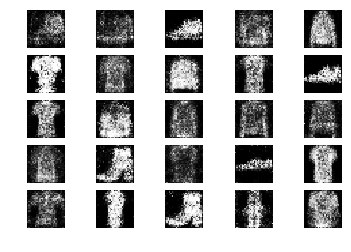

3051 [D loss: 0.638229, acc.: 60.94%] [G loss: 0.805896]
3052 [D loss: 0.599453, acc.: 70.31%] [G loss: 0.902670]
3053 [D loss: 0.587199, acc.: 68.75%] [G loss: 0.939969]
3054 [D loss: 0.588726, acc.: 73.44%] [G loss: 0.964411]
3055 [D loss: 0.639800, acc.: 68.75%] [G loss: 0.954889]
3056 [D loss: 0.692252, acc.: 57.81%] [G loss: 0.976748]
3057 [D loss: 0.598208, acc.: 67.19%] [G loss: 0.987003]
3058 [D loss: 0.638341, acc.: 68.75%] [G loss: 0.905130]
3059 [D loss: 0.675526, acc.: 57.81%] [G loss: 0.834865]
3060 [D loss: 0.618420, acc.: 65.62%] [G loss: 0.960992]
3061 [D loss: 0.682723, acc.: 60.94%] [G loss: 0.945588]
3062 [D loss: 0.620355, acc.: 59.38%] [G loss: 0.907486]
3063 [D loss: 0.757086, acc.: 48.44%] [G loss: 1.055471]
3064 [D loss: 0.620238, acc.: 68.75%] [G loss: 0.952265]
3065 [D loss: 0.577391, acc.: 76.56%] [G loss: 0.981040]
3066 [D loss: 0.603140, acc.: 64.06%] [G loss: 0.966425]
3067 [D loss: 0.578099, acc.: 76.56%] [G loss: 0.850721]
3068 [D loss: 0.689333, acc.: 5

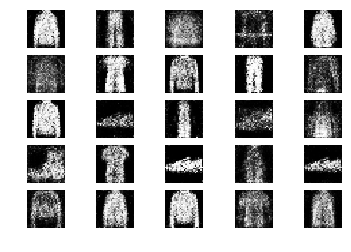

3101 [D loss: 0.731706, acc.: 50.00%] [G loss: 0.958475]
3102 [D loss: 0.624061, acc.: 62.50%] [G loss: 0.933125]
3103 [D loss: 0.629591, acc.: 65.62%] [G loss: 1.011009]
3104 [D loss: 0.601558, acc.: 68.75%] [G loss: 0.994501]
3105 [D loss: 0.683868, acc.: 56.25%] [G loss: 0.886585]
3106 [D loss: 0.584178, acc.: 70.31%] [G loss: 0.891509]
3107 [D loss: 0.604756, acc.: 60.94%] [G loss: 0.963765]
3108 [D loss: 0.582153, acc.: 71.88%] [G loss: 0.891658]
3109 [D loss: 0.701621, acc.: 51.56%] [G loss: 1.008626]
3110 [D loss: 0.618625, acc.: 67.19%] [G loss: 1.056206]
3111 [D loss: 0.584193, acc.: 70.31%] [G loss: 0.986941]
3112 [D loss: 0.596352, acc.: 67.19%] [G loss: 0.881538]
3113 [D loss: 0.625900, acc.: 62.50%] [G loss: 1.020477]
3114 [D loss: 0.614258, acc.: 64.06%] [G loss: 0.967508]
3115 [D loss: 0.632544, acc.: 56.25%] [G loss: 1.014137]
3116 [D loss: 0.658273, acc.: 56.25%] [G loss: 0.976424]
3117 [D loss: 0.617884, acc.: 73.44%] [G loss: 0.967934]
3118 [D loss: 0.666482, acc.: 5

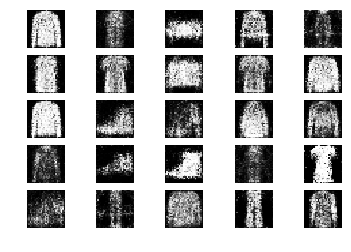

3151 [D loss: 0.812010, acc.: 53.12%] [G loss: 0.924002]
3152 [D loss: 0.658440, acc.: 62.50%] [G loss: 0.956826]
3153 [D loss: 0.609540, acc.: 65.62%] [G loss: 0.974151]
3154 [D loss: 0.588191, acc.: 73.44%] [G loss: 0.952536]
3155 [D loss: 0.661427, acc.: 56.25%] [G loss: 0.991688]
3156 [D loss: 0.617554, acc.: 62.50%] [G loss: 1.059597]
3157 [D loss: 0.585790, acc.: 68.75%] [G loss: 1.036217]
3158 [D loss: 0.646439, acc.: 65.62%] [G loss: 0.951669]
3159 [D loss: 0.638995, acc.: 65.62%] [G loss: 0.881179]
3160 [D loss: 0.655737, acc.: 70.31%] [G loss: 0.950439]
3161 [D loss: 0.654965, acc.: 54.69%] [G loss: 0.913491]
3162 [D loss: 0.561360, acc.: 75.00%] [G loss: 0.943340]
3163 [D loss: 0.705050, acc.: 48.44%] [G loss: 0.840125]
3164 [D loss: 0.569626, acc.: 75.00%] [G loss: 1.019831]
3165 [D loss: 0.607432, acc.: 65.62%] [G loss: 0.909876]
3166 [D loss: 0.656966, acc.: 56.25%] [G loss: 1.002005]
3167 [D loss: 0.649470, acc.: 59.38%] [G loss: 1.085742]
3168 [D loss: 0.602566, acc.: 6

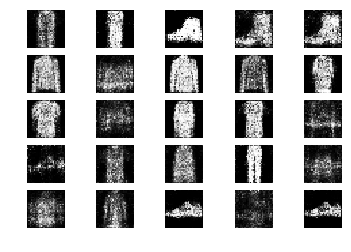

3201 [D loss: 0.657296, acc.: 62.50%] [G loss: 1.011254]
3202 [D loss: 0.677869, acc.: 62.50%] [G loss: 0.902182]
3203 [D loss: 0.625770, acc.: 62.50%] [G loss: 0.965850]
3204 [D loss: 0.624758, acc.: 67.19%] [G loss: 0.965634]
3205 [D loss: 0.609568, acc.: 68.75%] [G loss: 0.950708]
3206 [D loss: 0.694612, acc.: 64.06%] [G loss: 0.979912]
3207 [D loss: 0.581206, acc.: 65.62%] [G loss: 0.895777]
3208 [D loss: 0.570443, acc.: 68.75%] [G loss: 0.963880]
3209 [D loss: 0.638920, acc.: 62.50%] [G loss: 0.903198]
3210 [D loss: 0.665597, acc.: 59.38%] [G loss: 0.811297]
3211 [D loss: 0.595878, acc.: 62.50%] [G loss: 0.878612]
3212 [D loss: 0.655317, acc.: 62.50%] [G loss: 0.959317]
3213 [D loss: 0.580440, acc.: 68.75%] [G loss: 1.042378]
3214 [D loss: 0.585564, acc.: 67.19%] [G loss: 0.976621]
3215 [D loss: 0.713917, acc.: 60.94%] [G loss: 0.868761]
3216 [D loss: 0.633715, acc.: 65.62%] [G loss: 0.903287]
3217 [D loss: 0.636191, acc.: 60.94%] [G loss: 0.986308]
3218 [D loss: 0.644526, acc.: 6

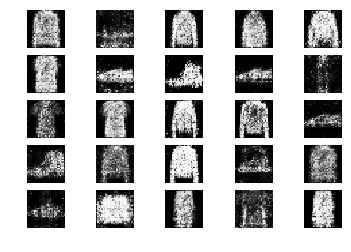

3251 [D loss: 0.634070, acc.: 57.81%] [G loss: 0.899937]
3252 [D loss: 0.586772, acc.: 64.06%] [G loss: 0.948630]
3253 [D loss: 0.652737, acc.: 60.94%] [G loss: 1.019085]
3254 [D loss: 0.618199, acc.: 56.25%] [G loss: 0.897094]
3255 [D loss: 0.694472, acc.: 54.69%] [G loss: 0.909171]
3256 [D loss: 0.591854, acc.: 65.62%] [G loss: 0.933398]
3257 [D loss: 0.662506, acc.: 56.25%] [G loss: 1.003974]
3258 [D loss: 0.590278, acc.: 70.31%] [G loss: 0.979201]
3259 [D loss: 0.595694, acc.: 62.50%] [G loss: 0.952327]
3260 [D loss: 0.735966, acc.: 50.00%] [G loss: 1.012180]
3261 [D loss: 0.593146, acc.: 67.19%] [G loss: 0.985926]
3262 [D loss: 0.639037, acc.: 64.06%] [G loss: 1.037688]
3263 [D loss: 0.614118, acc.: 67.19%] [G loss: 0.910691]
3264 [D loss: 0.527645, acc.: 82.81%] [G loss: 0.915720]
3265 [D loss: 0.613374, acc.: 65.62%] [G loss: 0.938541]
3266 [D loss: 0.708595, acc.: 50.00%] [G loss: 0.873202]
3267 [D loss: 0.601671, acc.: 68.75%] [G loss: 0.943844]
3268 [D loss: 0.595369, acc.: 7

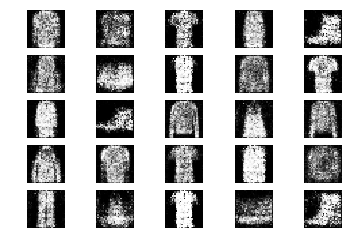

3301 [D loss: 0.600131, acc.: 67.19%] [G loss: 0.939635]
3302 [D loss: 0.532722, acc.: 73.44%] [G loss: 0.938744]
3303 [D loss: 0.620517, acc.: 64.06%] [G loss: 1.010947]
3304 [D loss: 0.702680, acc.: 53.12%] [G loss: 0.900974]
3305 [D loss: 0.584925, acc.: 64.06%] [G loss: 0.930360]
3306 [D loss: 0.601833, acc.: 70.31%] [G loss: 0.938218]
3307 [D loss: 0.674022, acc.: 53.12%] [G loss: 1.000990]
3308 [D loss: 0.600738, acc.: 70.31%] [G loss: 0.971846]
3309 [D loss: 0.596022, acc.: 70.31%] [G loss: 0.910827]
3310 [D loss: 0.643533, acc.: 56.25%] [G loss: 0.877221]
3311 [D loss: 0.677518, acc.: 53.12%] [G loss: 0.909550]
3312 [D loss: 0.657868, acc.: 59.38%] [G loss: 0.913114]
3313 [D loss: 0.648072, acc.: 59.38%] [G loss: 0.862203]
3314 [D loss: 0.629357, acc.: 62.50%] [G loss: 0.903640]
3315 [D loss: 0.670220, acc.: 62.50%] [G loss: 0.956683]
3316 [D loss: 0.584407, acc.: 73.44%] [G loss: 0.888528]
3317 [D loss: 0.698640, acc.: 54.69%] [G loss: 0.928519]
3318 [D loss: 0.626016, acc.: 6

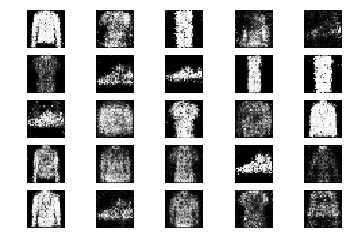

3351 [D loss: 0.642915, acc.: 51.56%] [G loss: 1.061099]
3352 [D loss: 0.620294, acc.: 67.19%] [G loss: 0.943809]
3353 [D loss: 0.652371, acc.: 62.50%] [G loss: 0.868228]
3354 [D loss: 0.575640, acc.: 75.00%] [G loss: 0.911157]
3355 [D loss: 0.533653, acc.: 76.56%] [G loss: 0.895878]
3356 [D loss: 0.654191, acc.: 62.50%] [G loss: 0.849429]
3357 [D loss: 0.573811, acc.: 65.62%] [G loss: 0.912973]
3358 [D loss: 0.676237, acc.: 57.81%] [G loss: 0.978225]
3359 [D loss: 0.582322, acc.: 70.31%] [G loss: 1.015237]
3360 [D loss: 0.647704, acc.: 60.94%] [G loss: 0.990737]
3361 [D loss: 0.684702, acc.: 56.25%] [G loss: 1.033709]
3362 [D loss: 0.649017, acc.: 64.06%] [G loss: 1.048137]
3363 [D loss: 0.736226, acc.: 50.00%] [G loss: 0.901076]
3364 [D loss: 0.646168, acc.: 62.50%] [G loss: 0.905085]
3365 [D loss: 0.665706, acc.: 62.50%] [G loss: 0.933371]
3366 [D loss: 0.623186, acc.: 64.06%] [G loss: 0.906686]
3367 [D loss: 0.583042, acc.: 68.75%] [G loss: 0.917232]
3368 [D loss: 0.661234, acc.: 6

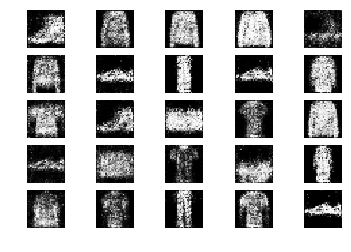

3401 [D loss: 0.624479, acc.: 60.94%] [G loss: 0.973112]
3402 [D loss: 0.566171, acc.: 65.62%] [G loss: 0.970732]
3403 [D loss: 0.578189, acc.: 68.75%] [G loss: 0.990306]
3404 [D loss: 0.697401, acc.: 51.56%] [G loss: 0.922448]
3405 [D loss: 0.664746, acc.: 50.00%] [G loss: 1.067242]
3406 [D loss: 0.636109, acc.: 62.50%] [G loss: 0.966206]
3407 [D loss: 0.601530, acc.: 70.31%] [G loss: 0.958474]
3408 [D loss: 0.666013, acc.: 57.81%] [G loss: 0.979226]
3409 [D loss: 0.624525, acc.: 62.50%] [G loss: 0.976669]
3410 [D loss: 0.672475, acc.: 57.81%] [G loss: 0.900938]
3411 [D loss: 0.654292, acc.: 60.94%] [G loss: 0.939676]
3412 [D loss: 0.644889, acc.: 62.50%] [G loss: 0.850204]
3413 [D loss: 0.656556, acc.: 59.38%] [G loss: 0.855662]
3414 [D loss: 0.598020, acc.: 68.75%] [G loss: 0.950038]
3415 [D loss: 0.693665, acc.: 57.81%] [G loss: 0.975590]
3416 [D loss: 0.580884, acc.: 70.31%] [G loss: 0.963336]
3417 [D loss: 0.639326, acc.: 62.50%] [G loss: 0.990273]
3418 [D loss: 0.629357, acc.: 6

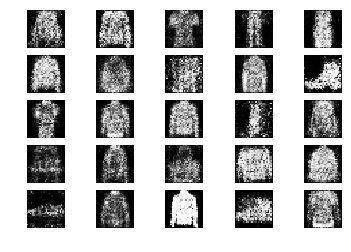

3451 [D loss: 0.580317, acc.: 68.75%] [G loss: 1.065403]
3452 [D loss: 0.658543, acc.: 60.94%] [G loss: 1.002129]
3453 [D loss: 0.678139, acc.: 56.25%] [G loss: 0.914033]
3454 [D loss: 0.624904, acc.: 65.62%] [G loss: 0.940794]
3455 [D loss: 0.577873, acc.: 73.44%] [G loss: 0.900124]
3456 [D loss: 0.670050, acc.: 57.81%] [G loss: 1.033199]
3457 [D loss: 0.607664, acc.: 64.06%] [G loss: 0.920405]
3458 [D loss: 0.602035, acc.: 68.75%] [G loss: 1.000533]
3459 [D loss: 0.683768, acc.: 59.38%] [G loss: 0.905989]
3460 [D loss: 0.657249, acc.: 60.94%] [G loss: 0.971505]
3461 [D loss: 0.600028, acc.: 59.38%] [G loss: 0.914027]
3462 [D loss: 0.605686, acc.: 67.19%] [G loss: 0.985580]
3463 [D loss: 0.606162, acc.: 62.50%] [G loss: 0.961007]
3464 [D loss: 0.608691, acc.: 68.75%] [G loss: 0.957767]
3465 [D loss: 0.613886, acc.: 65.62%] [G loss: 1.078623]
3466 [D loss: 0.593097, acc.: 68.75%] [G loss: 0.926362]
3467 [D loss: 0.661265, acc.: 59.38%] [G loss: 0.875001]
3468 [D loss: 0.576476, acc.: 7

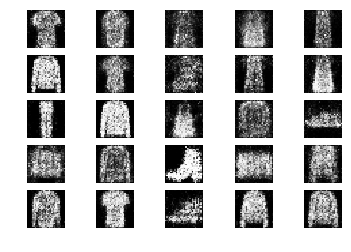

3501 [D loss: 0.643857, acc.: 56.25%] [G loss: 0.841108]
3502 [D loss: 0.586798, acc.: 70.31%] [G loss: 0.892048]
3503 [D loss: 0.661424, acc.: 57.81%] [G loss: 0.873839]
3504 [D loss: 0.605276, acc.: 71.88%] [G loss: 0.856249]
3505 [D loss: 0.584038, acc.: 70.31%] [G loss: 0.900255]
3506 [D loss: 0.676431, acc.: 62.50%] [G loss: 0.874801]
3507 [D loss: 0.602243, acc.: 67.19%] [G loss: 0.859442]
3508 [D loss: 0.610359, acc.: 60.94%] [G loss: 0.892802]
3509 [D loss: 0.616954, acc.: 70.31%] [G loss: 0.944172]
3510 [D loss: 0.593233, acc.: 70.31%] [G loss: 0.870659]
3511 [D loss: 0.715492, acc.: 57.81%] [G loss: 0.932451]
3512 [D loss: 0.602064, acc.: 68.75%] [G loss: 0.870865]
3513 [D loss: 0.589959, acc.: 64.06%] [G loss: 0.842498]
3514 [D loss: 0.667190, acc.: 59.38%] [G loss: 0.895461]
3515 [D loss: 0.595547, acc.: 71.88%] [G loss: 0.922432]
3516 [D loss: 0.626563, acc.: 60.94%] [G loss: 0.815617]
3517 [D loss: 0.681054, acc.: 67.19%] [G loss: 0.849700]
3518 [D loss: 0.675511, acc.: 6

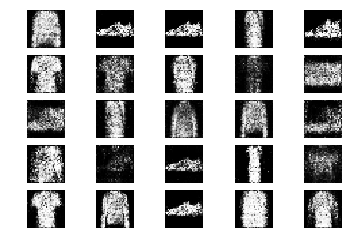

3551 [D loss: 0.611535, acc.: 67.19%] [G loss: 0.967272]
3552 [D loss: 0.712165, acc.: 50.00%] [G loss: 0.911789]
3553 [D loss: 0.600513, acc.: 71.88%] [G loss: 1.030128]
3554 [D loss: 0.632622, acc.: 64.06%] [G loss: 0.914490]
3555 [D loss: 0.624023, acc.: 64.06%] [G loss: 0.911593]
3556 [D loss: 0.600620, acc.: 65.62%] [G loss: 0.843447]
3557 [D loss: 0.681855, acc.: 59.38%] [G loss: 0.878225]
3558 [D loss: 0.669632, acc.: 53.12%] [G loss: 0.888351]
3559 [D loss: 0.543520, acc.: 84.38%] [G loss: 0.995715]
3560 [D loss: 0.601491, acc.: 67.19%] [G loss: 1.016373]
3561 [D loss: 0.642005, acc.: 64.06%] [G loss: 0.879304]
3562 [D loss: 0.657925, acc.: 56.25%] [G loss: 0.924532]
3563 [D loss: 0.663165, acc.: 56.25%] [G loss: 0.861469]
3564 [D loss: 0.616059, acc.: 68.75%] [G loss: 0.909862]
3565 [D loss: 0.615005, acc.: 73.44%] [G loss: 0.924109]
3566 [D loss: 0.664251, acc.: 64.06%] [G loss: 0.935584]
3567 [D loss: 0.751313, acc.: 53.12%] [G loss: 0.885876]
3568 [D loss: 0.654973, acc.: 5

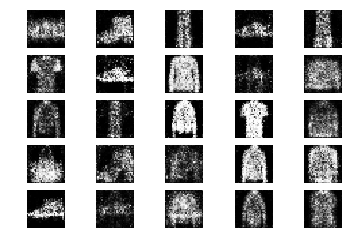

3601 [D loss: 0.597729, acc.: 70.31%] [G loss: 0.876132]
3602 [D loss: 0.640558, acc.: 68.75%] [G loss: 0.929831]
3603 [D loss: 0.567310, acc.: 75.00%] [G loss: 0.959195]
3604 [D loss: 0.627792, acc.: 64.06%] [G loss: 1.113544]
3605 [D loss: 0.586400, acc.: 67.19%] [G loss: 1.042323]
3606 [D loss: 0.683123, acc.: 57.81%] [G loss: 0.978681]
3607 [D loss: 0.661058, acc.: 54.69%] [G loss: 1.002303]
3608 [D loss: 0.582762, acc.: 75.00%] [G loss: 1.062880]
3609 [D loss: 0.563219, acc.: 73.44%] [G loss: 1.027487]
3610 [D loss: 0.620396, acc.: 62.50%] [G loss: 0.992966]
3611 [D loss: 0.632223, acc.: 62.50%] [G loss: 0.939137]
3612 [D loss: 0.637629, acc.: 62.50%] [G loss: 0.910993]
3613 [D loss: 0.623402, acc.: 64.06%] [G loss: 0.911743]
3614 [D loss: 0.661927, acc.: 54.69%] [G loss: 1.006588]
3615 [D loss: 0.634170, acc.: 60.94%] [G loss: 1.005695]
3616 [D loss: 0.587022, acc.: 73.44%] [G loss: 0.978020]
3617 [D loss: 0.658897, acc.: 65.62%] [G loss: 1.001167]
3618 [D loss: 0.555991, acc.: 7

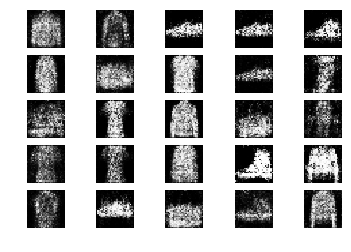

3651 [D loss: 0.624181, acc.: 62.50%] [G loss: 0.939345]
3652 [D loss: 0.602323, acc.: 60.94%] [G loss: 0.901519]
3653 [D loss: 0.656571, acc.: 60.94%] [G loss: 0.955490]
3654 [D loss: 0.649413, acc.: 57.81%] [G loss: 0.940791]
3655 [D loss: 0.640048, acc.: 59.38%] [G loss: 0.945830]
3656 [D loss: 0.637403, acc.: 67.19%] [G loss: 0.984702]
3657 [D loss: 0.663337, acc.: 54.69%] [G loss: 1.020031]
3658 [D loss: 0.689700, acc.: 50.00%] [G loss: 0.963668]
3659 [D loss: 0.647449, acc.: 60.94%] [G loss: 0.905818]
3660 [D loss: 0.651618, acc.: 62.50%] [G loss: 0.989065]
3661 [D loss: 0.556506, acc.: 76.56%] [G loss: 0.967700]
3662 [D loss: 0.699413, acc.: 46.88%] [G loss: 0.984717]
3663 [D loss: 0.587361, acc.: 71.88%] [G loss: 0.953320]
3664 [D loss: 0.622204, acc.: 65.62%] [G loss: 0.895054]
3665 [D loss: 0.602023, acc.: 70.31%] [G loss: 0.963854]
3666 [D loss: 0.628838, acc.: 67.19%] [G loss: 0.956831]
3667 [D loss: 0.671655, acc.: 60.94%] [G loss: 0.944357]
3668 [D loss: 0.674643, acc.: 5

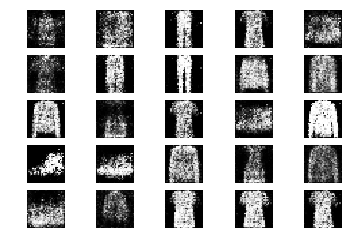

3701 [D loss: 0.574600, acc.: 78.12%] [G loss: 0.938217]
3702 [D loss: 0.634862, acc.: 64.06%] [G loss: 0.910000]
3703 [D loss: 0.587545, acc.: 64.06%] [G loss: 0.899386]
3704 [D loss: 0.627963, acc.: 65.62%] [G loss: 0.955089]
3705 [D loss: 0.625290, acc.: 65.62%] [G loss: 0.899553]
3706 [D loss: 0.624335, acc.: 60.94%] [G loss: 0.975412]
3707 [D loss: 0.684119, acc.: 56.25%] [G loss: 0.923099]
3708 [D loss: 0.650386, acc.: 56.25%] [G loss: 0.927353]
3709 [D loss: 0.656501, acc.: 56.25%] [G loss: 0.938100]
3710 [D loss: 0.641619, acc.: 60.94%] [G loss: 0.967214]
3711 [D loss: 0.610547, acc.: 71.88%] [G loss: 0.951724]
3712 [D loss: 0.657048, acc.: 62.50%] [G loss: 0.910922]
3713 [D loss: 0.554441, acc.: 73.44%] [G loss: 0.934731]
3714 [D loss: 0.593385, acc.: 64.06%] [G loss: 0.919744]
3715 [D loss: 0.626523, acc.: 71.88%] [G loss: 0.908038]
3716 [D loss: 0.581053, acc.: 73.44%] [G loss: 0.883632]
3717 [D loss: 0.651077, acc.: 59.38%] [G loss: 0.893287]
3718 [D loss: 0.628810, acc.: 6

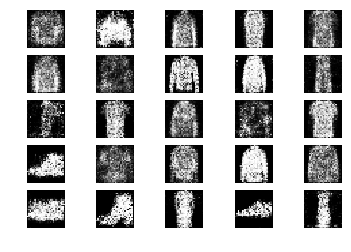

3751 [D loss: 0.697792, acc.: 48.44%] [G loss: 0.927708]
3752 [D loss: 0.622668, acc.: 65.62%] [G loss: 0.954638]
3753 [D loss: 0.674499, acc.: 54.69%] [G loss: 0.924751]
3754 [D loss: 0.665366, acc.: 62.50%] [G loss: 0.958230]
3755 [D loss: 0.638299, acc.: 64.06%] [G loss: 0.873019]
3756 [D loss: 0.695822, acc.: 54.69%] [G loss: 0.875805]
3757 [D loss: 0.564398, acc.: 68.75%] [G loss: 0.847598]
3758 [D loss: 0.586739, acc.: 67.19%] [G loss: 0.887487]
3759 [D loss: 0.622502, acc.: 68.75%] [G loss: 0.930680]
3760 [D loss: 0.610791, acc.: 64.06%] [G loss: 0.975934]
3761 [D loss: 0.614207, acc.: 64.06%] [G loss: 0.930481]
3762 [D loss: 0.673938, acc.: 62.50%] [G loss: 0.915301]
3763 [D loss: 0.621017, acc.: 70.31%] [G loss: 0.877922]
3764 [D loss: 0.673491, acc.: 59.38%] [G loss: 0.814429]
3765 [D loss: 0.597341, acc.: 64.06%] [G loss: 0.932078]
3766 [D loss: 0.627529, acc.: 59.38%] [G loss: 0.906133]
3767 [D loss: 0.636925, acc.: 68.75%] [G loss: 0.928654]
3768 [D loss: 0.629616, acc.: 5

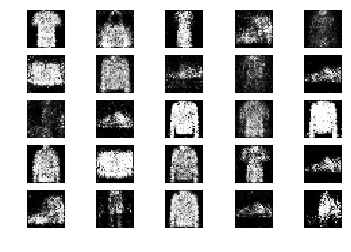

3801 [D loss: 0.662988, acc.: 59.38%] [G loss: 0.945783]
3802 [D loss: 0.645988, acc.: 60.94%] [G loss: 0.877282]
3803 [D loss: 0.600393, acc.: 68.75%] [G loss: 1.026937]
3804 [D loss: 0.579067, acc.: 70.31%] [G loss: 0.932554]
3805 [D loss: 0.609659, acc.: 64.06%] [G loss: 0.885704]
3806 [D loss: 0.657411, acc.: 59.38%] [G loss: 0.946980]
3807 [D loss: 0.604917, acc.: 57.81%] [G loss: 0.972899]
3808 [D loss: 0.589073, acc.: 65.62%] [G loss: 0.971272]
3809 [D loss: 0.743212, acc.: 60.94%] [G loss: 0.947975]
3810 [D loss: 0.681733, acc.: 54.69%] [G loss: 1.078608]
3811 [D loss: 0.662889, acc.: 56.25%] [G loss: 0.998639]
3812 [D loss: 0.632951, acc.: 64.06%] [G loss: 0.945884]
3813 [D loss: 0.632007, acc.: 57.81%] [G loss: 0.915190]
3814 [D loss: 0.593652, acc.: 73.44%] [G loss: 0.926182]
3815 [D loss: 0.592451, acc.: 70.31%] [G loss: 0.919558]
3816 [D loss: 0.622673, acc.: 62.50%] [G loss: 0.908820]
3817 [D loss: 0.606586, acc.: 64.06%] [G loss: 0.874843]
3818 [D loss: 0.598341, acc.: 7

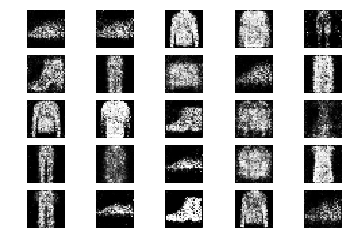

3851 [D loss: 0.633925, acc.: 54.69%] [G loss: 0.861409]
3852 [D loss: 0.606379, acc.: 67.19%] [G loss: 0.918172]
3853 [D loss: 0.599808, acc.: 70.31%] [G loss: 0.899812]
3854 [D loss: 0.642210, acc.: 70.31%] [G loss: 0.941521]
3855 [D loss: 0.659714, acc.: 59.38%] [G loss: 0.899140]
3856 [D loss: 0.587628, acc.: 65.62%] [G loss: 0.884881]
3857 [D loss: 0.601380, acc.: 68.75%] [G loss: 0.976062]
3858 [D loss: 0.599837, acc.: 71.88%] [G loss: 0.930358]
3859 [D loss: 0.646466, acc.: 62.50%] [G loss: 0.979613]
3860 [D loss: 0.603745, acc.: 71.88%] [G loss: 0.942357]
3861 [D loss: 0.600842, acc.: 67.19%] [G loss: 1.027774]
3862 [D loss: 0.581999, acc.: 67.19%] [G loss: 0.964113]
3863 [D loss: 0.640839, acc.: 62.50%] [G loss: 0.973327]
3864 [D loss: 0.673644, acc.: 60.94%] [G loss: 0.934598]
3865 [D loss: 0.602923, acc.: 64.06%] [G loss: 0.806563]
3866 [D loss: 0.616931, acc.: 62.50%] [G loss: 0.876346]
3867 [D loss: 0.642081, acc.: 62.50%] [G loss: 0.977004]
3868 [D loss: 0.664583, acc.: 6

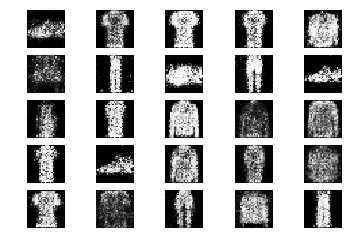

3901 [D loss: 0.641047, acc.: 64.06%] [G loss: 0.901286]
3902 [D loss: 0.588742, acc.: 67.19%] [G loss: 0.956478]
3903 [D loss: 0.722005, acc.: 53.12%] [G loss: 1.016929]
3904 [D loss: 0.749925, acc.: 56.25%] [G loss: 1.000542]
3905 [D loss: 0.627185, acc.: 64.06%] [G loss: 1.002114]
3906 [D loss: 0.586602, acc.: 79.69%] [G loss: 0.962567]
3907 [D loss: 0.662506, acc.: 50.00%] [G loss: 0.909313]
3908 [D loss: 0.667110, acc.: 62.50%] [G loss: 0.909801]
3909 [D loss: 0.623583, acc.: 70.31%] [G loss: 0.918237]
3910 [D loss: 0.621239, acc.: 60.94%] [G loss: 0.932904]
3911 [D loss: 0.654456, acc.: 54.69%] [G loss: 0.949079]
3912 [D loss: 0.683864, acc.: 59.38%] [G loss: 0.992421]
3913 [D loss: 0.619895, acc.: 68.75%] [G loss: 0.925258]
3914 [D loss: 0.659767, acc.: 67.19%] [G loss: 0.840905]
3915 [D loss: 0.614199, acc.: 67.19%] [G loss: 0.911876]
3916 [D loss: 0.739461, acc.: 50.00%] [G loss: 0.917332]
3917 [D loss: 0.713693, acc.: 50.00%] [G loss: 0.905909]
3918 [D loss: 0.646180, acc.: 5

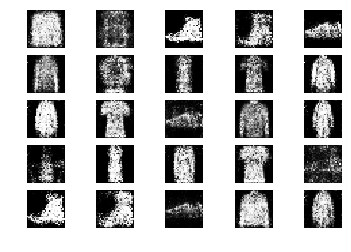

3951 [D loss: 0.673816, acc.: 65.62%] [G loss: 0.990296]
3952 [D loss: 0.584890, acc.: 68.75%] [G loss: 0.993925]
3953 [D loss: 0.677257, acc.: 62.50%] [G loss: 0.909009]
3954 [D loss: 0.649871, acc.: 56.25%] [G loss: 0.993940]
3955 [D loss: 0.596434, acc.: 71.88%] [G loss: 0.967223]
3956 [D loss: 0.593491, acc.: 75.00%] [G loss: 0.982074]
3957 [D loss: 0.657600, acc.: 53.12%] [G loss: 0.926937]
3958 [D loss: 0.648389, acc.: 60.94%] [G loss: 0.979926]
3959 [D loss: 0.654852, acc.: 59.38%] [G loss: 0.966472]
3960 [D loss: 0.620645, acc.: 70.31%] [G loss: 0.999598]
3961 [D loss: 0.563664, acc.: 73.44%] [G loss: 0.871683]
3962 [D loss: 0.598493, acc.: 70.31%] [G loss: 0.956615]
3963 [D loss: 0.626586, acc.: 62.50%] [G loss: 0.950891]
3964 [D loss: 0.570144, acc.: 70.31%] [G loss: 0.854669]
3965 [D loss: 0.609550, acc.: 68.75%] [G loss: 1.018218]
3966 [D loss: 0.578935, acc.: 70.31%] [G loss: 0.895174]
3967 [D loss: 0.637174, acc.: 60.94%] [G loss: 0.882001]
3968 [D loss: 0.696650, acc.: 4

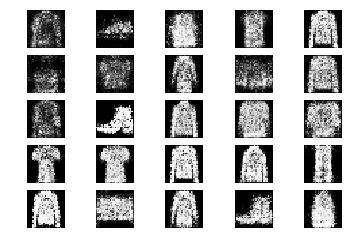

4001 [D loss: 0.610178, acc.: 64.06%] [G loss: 0.805956]
4002 [D loss: 0.652857, acc.: 59.38%] [G loss: 0.912622]
4003 [D loss: 0.658012, acc.: 62.50%] [G loss: 0.879216]
4004 [D loss: 0.733808, acc.: 51.56%] [G loss: 0.886638]
4005 [D loss: 0.597861, acc.: 67.19%] [G loss: 0.889207]
4006 [D loss: 0.661432, acc.: 59.38%] [G loss: 0.934897]
4007 [D loss: 0.600104, acc.: 75.00%] [G loss: 0.884154]
4008 [D loss: 0.632875, acc.: 68.75%] [G loss: 0.952105]
4009 [D loss: 0.629065, acc.: 60.94%] [G loss: 0.957599]
4010 [D loss: 0.667885, acc.: 68.75%] [G loss: 1.028295]
4011 [D loss: 0.626027, acc.: 68.75%] [G loss: 0.870574]
4012 [D loss: 0.682550, acc.: 51.56%] [G loss: 0.830331]
4013 [D loss: 0.670691, acc.: 57.81%] [G loss: 0.824081]
4014 [D loss: 0.658017, acc.: 57.81%] [G loss: 0.906608]
4015 [D loss: 0.565345, acc.: 71.88%] [G loss: 0.950218]
4016 [D loss: 0.595729, acc.: 70.31%] [G loss: 0.833551]
4017 [D loss: 0.641909, acc.: 62.50%] [G loss: 0.985249]
4018 [D loss: 0.761981, acc.: 4

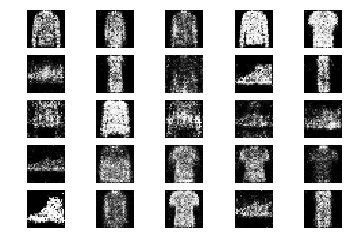

4051 [D loss: 0.587363, acc.: 62.50%] [G loss: 0.877908]
4052 [D loss: 0.597097, acc.: 68.75%] [G loss: 0.943348]
4053 [D loss: 0.682538, acc.: 59.38%] [G loss: 0.951490]
4054 [D loss: 0.631717, acc.: 67.19%] [G loss: 0.900009]
4055 [D loss: 0.633367, acc.: 67.19%] [G loss: 0.936644]
4056 [D loss: 0.624999, acc.: 64.06%] [G loss: 0.888184]
4057 [D loss: 0.597877, acc.: 59.38%] [G loss: 0.919003]
4058 [D loss: 0.631442, acc.: 70.31%] [G loss: 0.938935]
4059 [D loss: 0.607407, acc.: 65.62%] [G loss: 0.923960]
4060 [D loss: 0.657683, acc.: 65.62%] [G loss: 1.049153]
4061 [D loss: 0.570053, acc.: 70.31%] [G loss: 0.992981]
4062 [D loss: 0.635552, acc.: 64.06%] [G loss: 0.956666]
4063 [D loss: 0.611265, acc.: 68.75%] [G loss: 0.912204]
4064 [D loss: 0.671911, acc.: 59.38%] [G loss: 0.840058]
4065 [D loss: 0.682027, acc.: 48.44%] [G loss: 0.933444]
4066 [D loss: 0.687145, acc.: 54.69%] [G loss: 0.892292]
4067 [D loss: 0.615236, acc.: 56.25%] [G loss: 0.917375]
4068 [D loss: 0.698556, acc.: 5

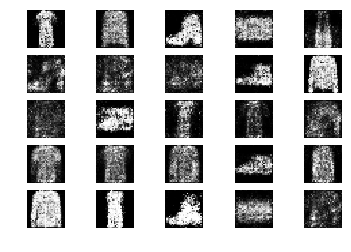

4101 [D loss: 0.648278, acc.: 62.50%] [G loss: 1.041440]
4102 [D loss: 0.665878, acc.: 51.56%] [G loss: 0.955568]
4103 [D loss: 0.689212, acc.: 51.56%] [G loss: 0.981045]
4104 [D loss: 0.668380, acc.: 53.12%] [G loss: 1.089523]
4105 [D loss: 0.577868, acc.: 73.44%] [G loss: 0.944832]
4106 [D loss: 0.663778, acc.: 56.25%] [G loss: 0.884663]
4107 [D loss: 0.676551, acc.: 67.19%] [G loss: 0.834060]
4108 [D loss: 0.612357, acc.: 64.06%] [G loss: 0.901299]
4109 [D loss: 0.580493, acc.: 73.44%] [G loss: 1.009167]
4110 [D loss: 0.633633, acc.: 64.06%] [G loss: 0.934767]
4111 [D loss: 0.664834, acc.: 57.81%] [G loss: 0.924980]
4112 [D loss: 0.646470, acc.: 68.75%] [G loss: 0.985558]
4113 [D loss: 0.649133, acc.: 62.50%] [G loss: 0.945819]
4114 [D loss: 0.635254, acc.: 64.06%] [G loss: 0.967430]
4115 [D loss: 0.665505, acc.: 54.69%] [G loss: 0.974698]
4116 [D loss: 0.650699, acc.: 60.94%] [G loss: 0.950866]
4117 [D loss: 0.622288, acc.: 65.62%] [G loss: 0.952736]
4118 [D loss: 0.666659, acc.: 5

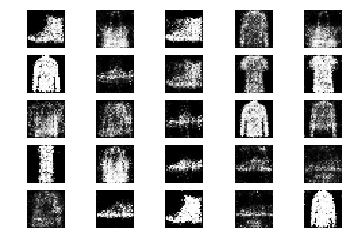

4151 [D loss: 0.668337, acc.: 57.81%] [G loss: 0.878062]
4152 [D loss: 0.602185, acc.: 65.62%] [G loss: 0.959134]
4153 [D loss: 0.675019, acc.: 56.25%] [G loss: 0.884941]
4154 [D loss: 0.664430, acc.: 62.50%] [G loss: 0.976411]
4155 [D loss: 0.624459, acc.: 60.94%] [G loss: 0.918503]
4156 [D loss: 0.609859, acc.: 73.44%] [G loss: 0.929598]
4157 [D loss: 0.627524, acc.: 64.06%] [G loss: 0.967518]
4158 [D loss: 0.674887, acc.: 60.94%] [G loss: 0.881164]
4159 [D loss: 0.677847, acc.: 60.94%] [G loss: 0.870743]
4160 [D loss: 0.588889, acc.: 70.31%] [G loss: 0.820528]
4161 [D loss: 0.570126, acc.: 60.94%] [G loss: 0.923536]
4162 [D loss: 0.639620, acc.: 68.75%] [G loss: 0.985179]
4163 [D loss: 0.623476, acc.: 60.94%] [G loss: 0.918771]
4164 [D loss: 0.661944, acc.: 48.44%] [G loss: 0.901324]
4165 [D loss: 0.643808, acc.: 57.81%] [G loss: 1.014044]
4166 [D loss: 0.677652, acc.: 60.94%] [G loss: 0.932941]
4167 [D loss: 0.653040, acc.: 56.25%] [G loss: 0.965036]
4168 [D loss: 0.689655, acc.: 6

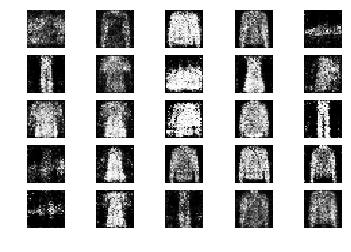

4201 [D loss: 0.653431, acc.: 57.81%] [G loss: 0.943244]
4202 [D loss: 0.722173, acc.: 54.69%] [G loss: 0.923412]
4203 [D loss: 0.620292, acc.: 65.62%] [G loss: 0.944529]
4204 [D loss: 0.610708, acc.: 68.75%] [G loss: 0.968204]
4205 [D loss: 0.647838, acc.: 62.50%] [G loss: 1.000027]
4206 [D loss: 0.612167, acc.: 68.75%] [G loss: 0.893315]
4207 [D loss: 0.594542, acc.: 70.31%] [G loss: 0.925177]
4208 [D loss: 0.624195, acc.: 65.62%] [G loss: 0.995834]
4209 [D loss: 0.668675, acc.: 53.12%] [G loss: 0.977314]
4210 [D loss: 0.699270, acc.: 51.56%] [G loss: 0.943461]
4211 [D loss: 0.694380, acc.: 59.38%] [G loss: 0.927601]
4212 [D loss: 0.657380, acc.: 59.38%] [G loss: 1.067096]
4213 [D loss: 0.598529, acc.: 71.88%] [G loss: 0.895450]
4214 [D loss: 0.666741, acc.: 54.69%] [G loss: 0.986774]
4215 [D loss: 0.583609, acc.: 75.00%] [G loss: 0.931999]
4216 [D loss: 0.665070, acc.: 57.81%] [G loss: 0.841976]
4217 [D loss: 0.562675, acc.: 79.69%] [G loss: 0.918815]
4218 [D loss: 0.629560, acc.: 6

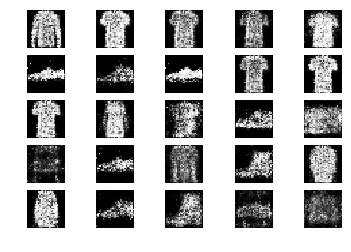

4251 [D loss: 0.688147, acc.: 59.38%] [G loss: 0.845986]
4252 [D loss: 0.617509, acc.: 68.75%] [G loss: 0.878406]
4253 [D loss: 0.659189, acc.: 60.94%] [G loss: 0.915908]
4254 [D loss: 0.664739, acc.: 53.12%] [G loss: 0.984130]
4255 [D loss: 0.696795, acc.: 60.94%] [G loss: 0.930279]
4256 [D loss: 0.613666, acc.: 68.75%] [G loss: 0.858028]
4257 [D loss: 0.631429, acc.: 67.19%] [G loss: 0.864040]
4258 [D loss: 0.683203, acc.: 57.81%] [G loss: 0.915894]
4259 [D loss: 0.685376, acc.: 57.81%] [G loss: 0.920813]
4260 [D loss: 0.632377, acc.: 62.50%] [G loss: 0.813933]
4261 [D loss: 0.698456, acc.: 57.81%] [G loss: 0.793309]
4262 [D loss: 0.681085, acc.: 62.50%] [G loss: 0.833766]
4263 [D loss: 0.657458, acc.: 59.38%] [G loss: 0.880898]
4264 [D loss: 0.646404, acc.: 54.69%] [G loss: 0.962263]
4265 [D loss: 0.685914, acc.: 51.56%] [G loss: 0.897278]
4266 [D loss: 0.595886, acc.: 68.75%] [G loss: 0.896362]
4267 [D loss: 0.591090, acc.: 62.50%] [G loss: 0.948746]
4268 [D loss: 0.650611, acc.: 6

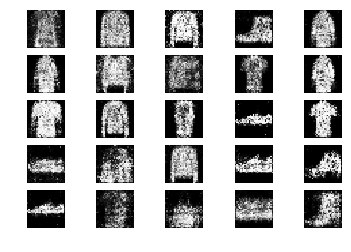

4301 [D loss: 0.679302, acc.: 62.50%] [G loss: 0.912612]
4302 [D loss: 0.649018, acc.: 64.06%] [G loss: 0.904198]
4303 [D loss: 0.582778, acc.: 68.75%] [G loss: 0.851316]
4304 [D loss: 0.642123, acc.: 62.50%] [G loss: 0.786191]
4305 [D loss: 0.637815, acc.: 59.38%] [G loss: 0.925575]
4306 [D loss: 0.627658, acc.: 64.06%] [G loss: 0.932161]
4307 [D loss: 0.704085, acc.: 43.75%] [G loss: 0.896324]
4308 [D loss: 0.651795, acc.: 68.75%] [G loss: 0.889556]
4309 [D loss: 0.583711, acc.: 70.31%] [G loss: 0.966406]
4310 [D loss: 0.657329, acc.: 54.69%] [G loss: 0.911674]
4311 [D loss: 0.607801, acc.: 76.56%] [G loss: 0.908692]
4312 [D loss: 0.613355, acc.: 56.25%] [G loss: 0.896106]
4313 [D loss: 0.645772, acc.: 62.50%] [G loss: 0.928735]
4314 [D loss: 0.678664, acc.: 56.25%] [G loss: 0.898031]
4315 [D loss: 0.570044, acc.: 75.00%] [G loss: 0.978883]
4316 [D loss: 0.696019, acc.: 54.69%] [G loss: 0.958708]
4317 [D loss: 0.601005, acc.: 65.62%] [G loss: 0.995625]
4318 [D loss: 0.652219, acc.: 6

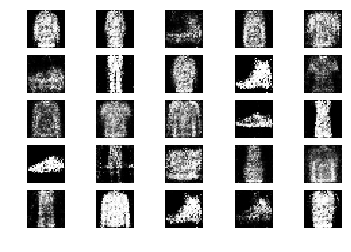

4351 [D loss: 0.608695, acc.: 67.19%] [G loss: 0.980689]
4352 [D loss: 0.573583, acc.: 71.88%] [G loss: 0.993419]
4353 [D loss: 0.590347, acc.: 68.75%] [G loss: 0.971977]
4354 [D loss: 0.631987, acc.: 64.06%] [G loss: 0.971842]
4355 [D loss: 0.641298, acc.: 64.06%] [G loss: 0.934393]
4356 [D loss: 0.651074, acc.: 53.12%] [G loss: 0.936947]
4357 [D loss: 0.642887, acc.: 65.62%] [G loss: 0.898987]
4358 [D loss: 0.580396, acc.: 73.44%] [G loss: 0.908519]
4359 [D loss: 0.726474, acc.: 50.00%] [G loss: 0.969189]
4360 [D loss: 0.665994, acc.: 62.50%] [G loss: 0.980802]
4361 [D loss: 0.659586, acc.: 65.62%] [G loss: 0.953670]
4362 [D loss: 0.550064, acc.: 73.44%] [G loss: 0.992242]
4363 [D loss: 0.633802, acc.: 59.38%] [G loss: 0.983109]
4364 [D loss: 0.651462, acc.: 67.19%] [G loss: 0.931342]
4365 [D loss: 0.611668, acc.: 70.31%] [G loss: 0.954368]
4366 [D loss: 0.681925, acc.: 56.25%] [G loss: 0.929324]
4367 [D loss: 0.661724, acc.: 64.06%] [G loss: 0.931801]
4368 [D loss: 0.632851, acc.: 6

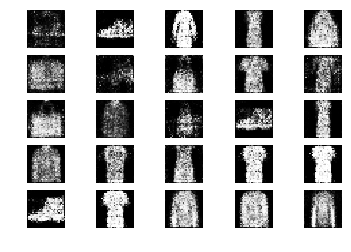

4401 [D loss: 0.682042, acc.: 53.12%] [G loss: 0.999368]
4402 [D loss: 0.665820, acc.: 59.38%] [G loss: 0.871489]
4403 [D loss: 0.610116, acc.: 65.62%] [G loss: 0.936130]
4404 [D loss: 0.700843, acc.: 62.50%] [G loss: 1.047234]
4405 [D loss: 0.637893, acc.: 60.94%] [G loss: 0.958496]
4406 [D loss: 0.632695, acc.: 60.94%] [G loss: 1.012300]
4407 [D loss: 0.662505, acc.: 57.81%] [G loss: 0.941066]
4408 [D loss: 0.591982, acc.: 70.31%] [G loss: 0.946090]
4409 [D loss: 0.640962, acc.: 60.94%] [G loss: 0.940559]
4410 [D loss: 0.715235, acc.: 54.69%] [G loss: 0.877909]
4411 [D loss: 0.621096, acc.: 57.81%] [G loss: 0.942618]
4412 [D loss: 0.624555, acc.: 62.50%] [G loss: 0.948052]
4413 [D loss: 0.693599, acc.: 53.12%] [G loss: 0.942451]
4414 [D loss: 0.648900, acc.: 67.19%] [G loss: 0.921993]
4415 [D loss: 0.691466, acc.: 57.81%] [G loss: 0.971879]
4416 [D loss: 0.672379, acc.: 67.19%] [G loss: 0.907373]
4417 [D loss: 0.566190, acc.: 78.12%] [G loss: 0.889149]
4418 [D loss: 0.553205, acc.: 7

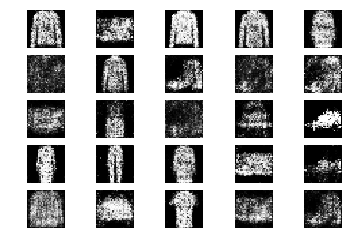

4451 [D loss: 0.683432, acc.: 59.38%] [G loss: 0.955575]
4452 [D loss: 0.618141, acc.: 65.62%] [G loss: 0.883177]
4453 [D loss: 0.652565, acc.: 51.56%] [G loss: 0.946802]
4454 [D loss: 0.622030, acc.: 67.19%] [G loss: 1.039279]
4455 [D loss: 0.677819, acc.: 59.38%] [G loss: 1.020998]
4456 [D loss: 0.627909, acc.: 65.62%] [G loss: 0.916546]
4457 [D loss: 0.644335, acc.: 59.38%] [G loss: 1.001766]
4458 [D loss: 0.653819, acc.: 57.81%] [G loss: 0.860023]
4459 [D loss: 0.633777, acc.: 60.94%] [G loss: 0.882154]
4460 [D loss: 0.602403, acc.: 68.75%] [G loss: 0.889143]
4461 [D loss: 0.637741, acc.: 60.94%] [G loss: 0.876134]
4462 [D loss: 0.633003, acc.: 62.50%] [G loss: 0.866140]
4463 [D loss: 0.707772, acc.: 51.56%] [G loss: 0.878907]
4464 [D loss: 0.684966, acc.: 59.38%] [G loss: 0.991860]
4465 [D loss: 0.640596, acc.: 57.81%] [G loss: 0.875989]
4466 [D loss: 0.630131, acc.: 57.81%] [G loss: 0.894183]
4467 [D loss: 0.615649, acc.: 68.75%] [G loss: 0.828502]
4468 [D loss: 0.599214, acc.: 6

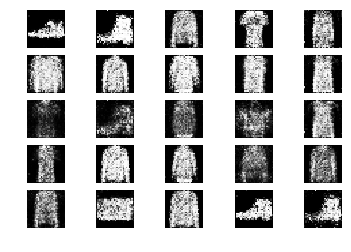

4501 [D loss: 0.609554, acc.: 62.50%] [G loss: 0.871575]
4502 [D loss: 0.686950, acc.: 57.81%] [G loss: 0.914814]
4503 [D loss: 0.654741, acc.: 53.12%] [G loss: 0.924020]
4504 [D loss: 0.669315, acc.: 57.81%] [G loss: 0.817396]
4505 [D loss: 0.574596, acc.: 73.44%] [G loss: 0.899234]
4506 [D loss: 0.648843, acc.: 65.62%] [G loss: 0.922762]
4507 [D loss: 0.618184, acc.: 60.94%] [G loss: 1.027006]
4508 [D loss: 0.655042, acc.: 60.94%] [G loss: 0.930871]
4509 [D loss: 0.669878, acc.: 54.69%] [G loss: 0.837721]
4510 [D loss: 0.595380, acc.: 70.31%] [G loss: 1.009956]
4511 [D loss: 0.668213, acc.: 60.94%] [G loss: 0.896773]
4512 [D loss: 0.628069, acc.: 65.62%] [G loss: 0.969204]
4513 [D loss: 0.664386, acc.: 64.06%] [G loss: 0.925368]
4514 [D loss: 0.694981, acc.: 59.38%] [G loss: 0.942182]
4515 [D loss: 0.600364, acc.: 68.75%] [G loss: 1.027567]
4516 [D loss: 0.611766, acc.: 65.62%] [G loss: 0.907201]
4517 [D loss: 0.692041, acc.: 59.38%] [G loss: 0.939074]
4518 [D loss: 0.689885, acc.: 5

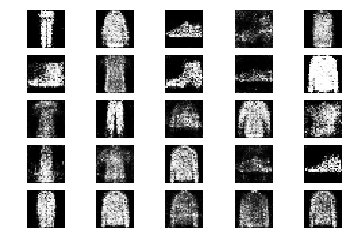

4551 [D loss: 0.677032, acc.: 46.88%] [G loss: 0.931694]
4552 [D loss: 0.665733, acc.: 62.50%] [G loss: 0.904753]
4553 [D loss: 0.651114, acc.: 57.81%] [G loss: 0.937974]
4554 [D loss: 0.680560, acc.: 64.06%] [G loss: 0.853090]
4555 [D loss: 0.693708, acc.: 60.94%] [G loss: 0.883491]
4556 [D loss: 0.633888, acc.: 65.62%] [G loss: 0.864919]
4557 [D loss: 0.639873, acc.: 60.94%] [G loss: 0.856479]
4558 [D loss: 0.599056, acc.: 68.75%] [G loss: 0.894523]
4559 [D loss: 0.646201, acc.: 59.38%] [G loss: 0.841662]
4560 [D loss: 0.723954, acc.: 51.56%] [G loss: 0.860889]
4561 [D loss: 0.618596, acc.: 59.38%] [G loss: 0.926506]
4562 [D loss: 0.637371, acc.: 60.94%] [G loss: 0.879757]
4563 [D loss: 0.567172, acc.: 73.44%] [G loss: 0.844435]
4564 [D loss: 0.574785, acc.: 68.75%] [G loss: 0.826437]
4565 [D loss: 0.659583, acc.: 62.50%] [G loss: 0.951124]
4566 [D loss: 0.620671, acc.: 64.06%] [G loss: 0.892722]
4567 [D loss: 0.720279, acc.: 57.81%] [G loss: 0.965712]
4568 [D loss: 0.646074, acc.: 6

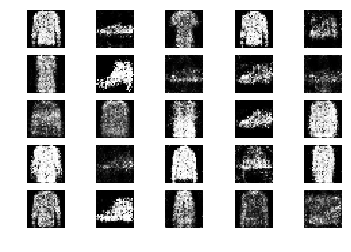

4601 [D loss: 0.669220, acc.: 59.38%] [G loss: 1.003030]
4602 [D loss: 0.655562, acc.: 60.94%] [G loss: 0.942834]
4603 [D loss: 0.673001, acc.: 60.94%] [G loss: 0.957363]
4604 [D loss: 0.652264, acc.: 56.25%] [G loss: 0.869954]
4605 [D loss: 0.628773, acc.: 59.38%] [G loss: 0.875539]
4606 [D loss: 0.631650, acc.: 57.81%] [G loss: 0.936026]
4607 [D loss: 0.714123, acc.: 46.88%] [G loss: 0.893980]
4608 [D loss: 0.569047, acc.: 75.00%] [G loss: 0.828975]
4609 [D loss: 0.622317, acc.: 67.19%] [G loss: 0.955960]
4610 [D loss: 0.630266, acc.: 60.94%] [G loss: 0.889494]
4611 [D loss: 0.601966, acc.: 71.88%] [G loss: 0.969076]
4612 [D loss: 0.677564, acc.: 59.38%] [G loss: 0.895888]
4613 [D loss: 0.702029, acc.: 54.69%] [G loss: 0.995916]
4614 [D loss: 0.636913, acc.: 68.75%] [G loss: 0.919250]
4615 [D loss: 0.602084, acc.: 68.75%] [G loss: 0.961051]
4616 [D loss: 0.653004, acc.: 59.38%] [G loss: 0.839841]
4617 [D loss: 0.722522, acc.: 53.12%] [G loss: 0.800170]
4618 [D loss: 0.656233, acc.: 6

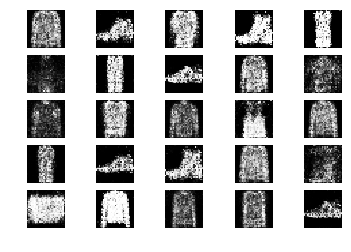

4651 [D loss: 0.717012, acc.: 57.81%] [G loss: 0.920941]
4652 [D loss: 0.601881, acc.: 70.31%] [G loss: 0.921026]
4653 [D loss: 0.667970, acc.: 62.50%] [G loss: 0.945118]
4654 [D loss: 0.656203, acc.: 60.94%] [G loss: 0.914840]
4655 [D loss: 0.641224, acc.: 67.19%] [G loss: 0.779558]
4656 [D loss: 0.568696, acc.: 67.19%] [G loss: 0.815475]
4657 [D loss: 0.565661, acc.: 70.31%] [G loss: 0.863080]
4658 [D loss: 0.736585, acc.: 57.81%] [G loss: 0.959244]
4659 [D loss: 0.687978, acc.: 50.00%] [G loss: 0.960351]
4660 [D loss: 0.666211, acc.: 54.69%] [G loss: 0.981386]
4661 [D loss: 0.658344, acc.: 54.69%] [G loss: 1.062302]
4662 [D loss: 0.665127, acc.: 62.50%] [G loss: 0.917609]
4663 [D loss: 0.670363, acc.: 53.12%] [G loss: 0.839321]
4664 [D loss: 0.649588, acc.: 56.25%] [G loss: 0.903103]
4665 [D loss: 0.602318, acc.: 70.31%] [G loss: 0.777231]
4666 [D loss: 0.705521, acc.: 60.94%] [G loss: 0.940201]
4667 [D loss: 0.709510, acc.: 51.56%] [G loss: 0.935061]
4668 [D loss: 0.620535, acc.: 6

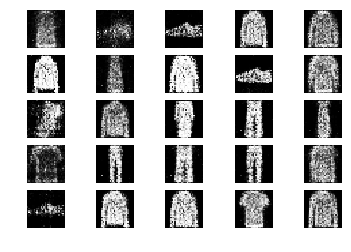

4701 [D loss: 0.773378, acc.: 48.44%] [G loss: 0.907804]
4702 [D loss: 0.693012, acc.: 56.25%] [G loss: 1.060179]
4703 [D loss: 0.691375, acc.: 56.25%] [G loss: 0.893188]
4704 [D loss: 0.602751, acc.: 67.19%] [G loss: 0.910286]
4705 [D loss: 0.654909, acc.: 68.75%] [G loss: 0.900350]
4706 [D loss: 0.761810, acc.: 42.19%] [G loss: 0.888930]
4707 [D loss: 0.635272, acc.: 64.06%] [G loss: 0.890846]
4708 [D loss: 0.625221, acc.: 67.19%] [G loss: 0.904758]
4709 [D loss: 0.615599, acc.: 68.75%] [G loss: 0.880251]
4710 [D loss: 0.631338, acc.: 62.50%] [G loss: 0.916890]
4711 [D loss: 0.665326, acc.: 60.94%] [G loss: 0.870051]
4712 [D loss: 0.592863, acc.: 64.06%] [G loss: 0.865140]
4713 [D loss: 0.611651, acc.: 62.50%] [G loss: 0.949824]
4714 [D loss: 0.691738, acc.: 50.00%] [G loss: 0.909214]
4715 [D loss: 0.646306, acc.: 65.62%] [G loss: 0.901971]
4716 [D loss: 0.636570, acc.: 65.62%] [G loss: 0.846841]
4717 [D loss: 0.722444, acc.: 53.12%] [G loss: 0.951889]
4718 [D loss: 0.639015, acc.: 5

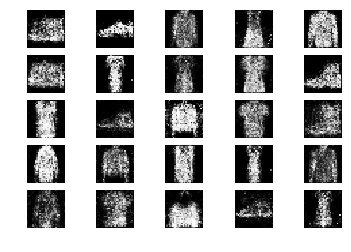

4751 [D loss: 0.590151, acc.: 67.19%] [G loss: 0.853443]
4752 [D loss: 0.587113, acc.: 73.44%] [G loss: 0.973324]
4753 [D loss: 0.616174, acc.: 65.62%] [G loss: 0.914842]
4754 [D loss: 0.574746, acc.: 73.44%] [G loss: 0.931771]
4755 [D loss: 0.632854, acc.: 64.06%] [G loss: 0.992915]
4756 [D loss: 0.644537, acc.: 65.62%] [G loss: 0.963113]
4757 [D loss: 0.740290, acc.: 50.00%] [G loss: 0.868488]
4758 [D loss: 0.626097, acc.: 54.69%] [G loss: 0.905494]
4759 [D loss: 0.686522, acc.: 57.81%] [G loss: 0.865288]
4760 [D loss: 0.684716, acc.: 53.12%] [G loss: 0.831358]
4761 [D loss: 0.684312, acc.: 59.38%] [G loss: 0.963274]
4762 [D loss: 0.613705, acc.: 67.19%] [G loss: 0.968644]
4763 [D loss: 0.630742, acc.: 70.31%] [G loss: 0.995982]
4764 [D loss: 0.693390, acc.: 54.69%] [G loss: 0.902182]
4765 [D loss: 0.654290, acc.: 57.81%] [G loss: 0.850148]
4766 [D loss: 0.665250, acc.: 62.50%] [G loss: 0.874119]
4767 [D loss: 0.596609, acc.: 60.94%] [G loss: 0.894653]
4768 [D loss: 0.667629, acc.: 5

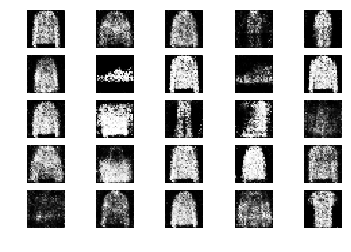

4801 [D loss: 0.690247, acc.: 59.38%] [G loss: 0.837612]
4802 [D loss: 0.597815, acc.: 65.62%] [G loss: 0.927602]
4803 [D loss: 0.630093, acc.: 60.94%] [G loss: 0.940531]
4804 [D loss: 0.694389, acc.: 46.88%] [G loss: 0.891189]
4805 [D loss: 0.703976, acc.: 51.56%] [G loss: 0.858535]
4806 [D loss: 0.643149, acc.: 60.94%] [G loss: 0.903876]
4807 [D loss: 0.698874, acc.: 51.56%] [G loss: 0.867629]
4808 [D loss: 0.609322, acc.: 70.31%] [G loss: 0.877279]
4809 [D loss: 0.639341, acc.: 64.06%] [G loss: 0.880826]
4810 [D loss: 0.772757, acc.: 43.75%] [G loss: 0.842130]
4811 [D loss: 0.620855, acc.: 60.94%] [G loss: 0.956656]
4812 [D loss: 0.625748, acc.: 71.88%] [G loss: 0.817028]
4813 [D loss: 0.659251, acc.: 56.25%] [G loss: 0.897177]
4814 [D loss: 0.620676, acc.: 65.62%] [G loss: 0.922844]
4815 [D loss: 0.659917, acc.: 62.50%] [G loss: 0.929843]
4816 [D loss: 0.637001, acc.: 57.81%] [G loss: 0.950936]
4817 [D loss: 0.667473, acc.: 65.62%] [G loss: 0.995005]
4818 [D loss: 0.626705, acc.: 6

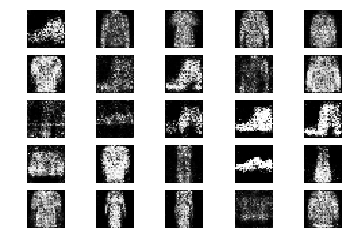

4851 [D loss: 0.675212, acc.: 60.94%] [G loss: 0.935905]
4852 [D loss: 0.672971, acc.: 59.38%] [G loss: 0.848972]
4853 [D loss: 0.646238, acc.: 54.69%] [G loss: 0.901376]
4854 [D loss: 0.640533, acc.: 62.50%] [G loss: 0.954349]
4855 [D loss: 0.631581, acc.: 64.06%] [G loss: 0.899727]
4856 [D loss: 0.701724, acc.: 57.81%] [G loss: 0.996481]
4857 [D loss: 0.577970, acc.: 73.44%] [G loss: 0.957799]
4858 [D loss: 0.612632, acc.: 65.62%] [G loss: 0.913418]
4859 [D loss: 0.680184, acc.: 57.81%] [G loss: 0.936031]
4860 [D loss: 0.595220, acc.: 75.00%] [G loss: 0.931152]
4861 [D loss: 0.584948, acc.: 68.75%] [G loss: 0.875185]
4862 [D loss: 0.687345, acc.: 56.25%] [G loss: 0.861384]
4863 [D loss: 0.628599, acc.: 62.50%] [G loss: 0.912110]
4864 [D loss: 0.645566, acc.: 56.25%] [G loss: 0.885975]
4865 [D loss: 0.643676, acc.: 56.25%] [G loss: 0.841060]
4866 [D loss: 0.624857, acc.: 67.19%] [G loss: 0.962541]
4867 [D loss: 0.670782, acc.: 57.81%] [G loss: 0.933430]
4868 [D loss: 0.734227, acc.: 5

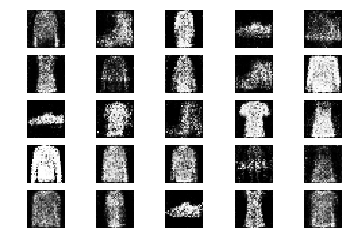

4901 [D loss: 0.714677, acc.: 48.44%] [G loss: 1.004601]
4902 [D loss: 0.616735, acc.: 60.94%] [G loss: 0.900002]
4903 [D loss: 0.657319, acc.: 64.06%] [G loss: 0.908739]
4904 [D loss: 0.702975, acc.: 42.19%] [G loss: 0.831212]
4905 [D loss: 0.626872, acc.: 67.19%] [G loss: 0.913043]
4906 [D loss: 0.640689, acc.: 62.50%] [G loss: 0.961289]
4907 [D loss: 0.690964, acc.: 54.69%] [G loss: 0.889451]
4908 [D loss: 0.608423, acc.: 64.06%] [G loss: 0.823694]
4909 [D loss: 0.686856, acc.: 60.94%] [G loss: 0.982168]
4910 [D loss: 0.620704, acc.: 65.62%] [G loss: 0.887894]
4911 [D loss: 0.713733, acc.: 46.88%] [G loss: 0.871839]
4912 [D loss: 0.620454, acc.: 64.06%] [G loss: 0.873972]
4913 [D loss: 0.686500, acc.: 62.50%] [G loss: 0.907432]
4914 [D loss: 0.633562, acc.: 68.75%] [G loss: 0.999255]
4915 [D loss: 0.605725, acc.: 76.56%] [G loss: 0.891684]
4916 [D loss: 0.612475, acc.: 68.75%] [G loss: 0.946257]
4917 [D loss: 0.653230, acc.: 51.56%] [G loss: 0.912051]
4918 [D loss: 0.620432, acc.: 6

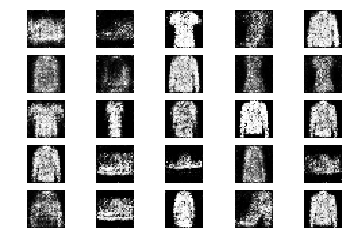

4951 [D loss: 0.631033, acc.: 64.06%] [G loss: 0.862776]
4952 [D loss: 0.711777, acc.: 46.88%] [G loss: 0.945775]
4953 [D loss: 0.683998, acc.: 53.12%] [G loss: 0.837402]
4954 [D loss: 0.680575, acc.: 56.25%] [G loss: 0.918442]
4955 [D loss: 0.692454, acc.: 54.69%] [G loss: 0.852661]
4956 [D loss: 0.643198, acc.: 64.06%] [G loss: 0.907739]
4957 [D loss: 0.552485, acc.: 76.56%] [G loss: 0.813544]
4958 [D loss: 0.692069, acc.: 56.25%] [G loss: 0.924367]
4959 [D loss: 0.592714, acc.: 71.88%] [G loss: 0.971918]
4960 [D loss: 0.619717, acc.: 60.94%] [G loss: 0.880165]
4961 [D loss: 0.628998, acc.: 65.62%] [G loss: 0.939057]
4962 [D loss: 0.622610, acc.: 68.75%] [G loss: 0.886298]
4963 [D loss: 0.657087, acc.: 71.88%] [G loss: 0.963307]
4964 [D loss: 0.661816, acc.: 62.50%] [G loss: 0.905974]
4965 [D loss: 0.631494, acc.: 60.94%] [G loss: 0.937920]
4966 [D loss: 0.611062, acc.: 67.19%] [G loss: 0.998309]
4967 [D loss: 0.616189, acc.: 65.62%] [G loss: 0.903456]
4968 [D loss: 0.715746, acc.: 4

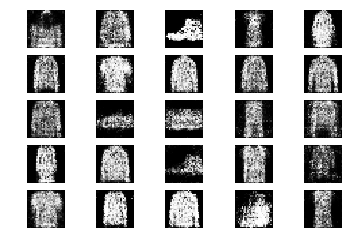

5001 [D loss: 0.614245, acc.: 60.94%] [G loss: 0.909537]
5002 [D loss: 0.645150, acc.: 60.94%] [G loss: 0.939910]
5003 [D loss: 0.605796, acc.: 70.31%] [G loss: 0.934520]
5004 [D loss: 0.637589, acc.: 60.94%] [G loss: 0.954858]
5005 [D loss: 0.549591, acc.: 79.69%] [G loss: 1.055407]
5006 [D loss: 0.667487, acc.: 62.50%] [G loss: 0.953550]
5007 [D loss: 0.683604, acc.: 60.94%] [G loss: 0.877874]
5008 [D loss: 0.626948, acc.: 64.06%] [G loss: 0.980169]
5009 [D loss: 0.671911, acc.: 54.69%] [G loss: 0.837494]
5010 [D loss: 0.671451, acc.: 60.94%] [G loss: 0.828268]
5011 [D loss: 0.657236, acc.: 59.38%] [G loss: 1.021956]
5012 [D loss: 0.615564, acc.: 62.50%] [G loss: 1.042414]
5013 [D loss: 0.655075, acc.: 57.81%] [G loss: 0.885818]
5014 [D loss: 0.616861, acc.: 71.88%] [G loss: 0.925704]
5015 [D loss: 0.648520, acc.: 60.94%] [G loss: 0.884877]
5016 [D loss: 0.655139, acc.: 59.38%] [G loss: 0.843554]
5017 [D loss: 0.594278, acc.: 70.31%] [G loss: 0.866351]
5018 [D loss: 0.725778, acc.: 5

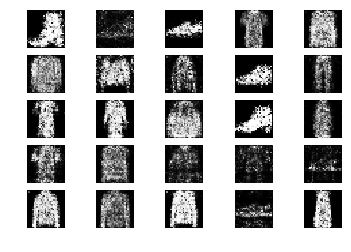

5051 [D loss: 0.648685, acc.: 68.75%] [G loss: 0.936368]
5052 [D loss: 0.610236, acc.: 65.62%] [G loss: 0.975421]
5053 [D loss: 0.676502, acc.: 62.50%] [G loss: 0.924652]
5054 [D loss: 0.596334, acc.: 68.75%] [G loss: 0.979983]
5055 [D loss: 0.654541, acc.: 60.94%] [G loss: 0.842087]
5056 [D loss: 0.644804, acc.: 62.50%] [G loss: 0.867157]
5057 [D loss: 0.672359, acc.: 56.25%] [G loss: 0.795820]
5058 [D loss: 0.598579, acc.: 64.06%] [G loss: 1.004421]
5059 [D loss: 0.571345, acc.: 70.31%] [G loss: 1.075980]
5060 [D loss: 0.606078, acc.: 60.94%] [G loss: 0.971722]
5061 [D loss: 0.659673, acc.: 53.12%] [G loss: 0.896236]
5062 [D loss: 0.650429, acc.: 57.81%] [G loss: 0.916192]
5063 [D loss: 0.631611, acc.: 67.19%] [G loss: 0.909976]
5064 [D loss: 0.578331, acc.: 73.44%] [G loss: 0.906198]
5065 [D loss: 0.665887, acc.: 62.50%] [G loss: 0.936107]
5066 [D loss: 0.637573, acc.: 62.50%] [G loss: 0.874272]
5067 [D loss: 0.734636, acc.: 48.44%] [G loss: 0.922252]
5068 [D loss: 0.580506, acc.: 7

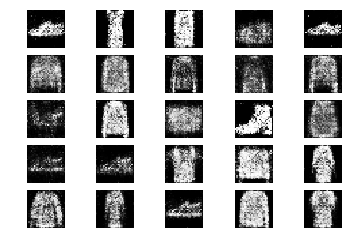

5101 [D loss: 0.613596, acc.: 64.06%] [G loss: 0.909075]
5102 [D loss: 0.653711, acc.: 67.19%] [G loss: 0.870488]
5103 [D loss: 0.683155, acc.: 59.38%] [G loss: 0.847098]
5104 [D loss: 0.620415, acc.: 64.06%] [G loss: 0.940199]
5105 [D loss: 0.591650, acc.: 64.06%] [G loss: 0.901453]
5106 [D loss: 0.647882, acc.: 60.94%] [G loss: 0.920262]
5107 [D loss: 0.613084, acc.: 62.50%] [G loss: 0.880480]
5108 [D loss: 0.725620, acc.: 53.12%] [G loss: 0.898036]
5109 [D loss: 0.636380, acc.: 57.81%] [G loss: 0.980578]
5110 [D loss: 0.640871, acc.: 60.94%] [G loss: 0.920942]
5111 [D loss: 0.613837, acc.: 62.50%] [G loss: 0.860966]
5112 [D loss: 0.634512, acc.: 60.94%] [G loss: 0.893974]
5113 [D loss: 0.668065, acc.: 57.81%] [G loss: 0.937238]
5114 [D loss: 0.632347, acc.: 62.50%] [G loss: 0.918443]
5115 [D loss: 0.619980, acc.: 70.31%] [G loss: 0.933536]
5116 [D loss: 0.694123, acc.: 51.56%] [G loss: 0.942113]
5117 [D loss: 0.689194, acc.: 56.25%] [G loss: 0.914435]
5118 [D loss: 0.619930, acc.: 6

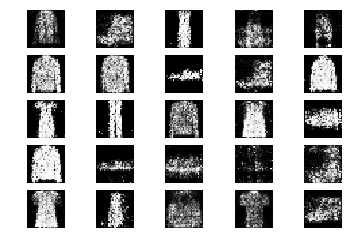

5151 [D loss: 0.639656, acc.: 57.81%] [G loss: 0.936763]
5152 [D loss: 0.735384, acc.: 53.12%] [G loss: 0.865955]
5153 [D loss: 0.649385, acc.: 59.38%] [G loss: 0.878477]
5154 [D loss: 0.618639, acc.: 62.50%] [G loss: 0.860216]
5155 [D loss: 0.665290, acc.: 62.50%] [G loss: 0.974009]
5156 [D loss: 0.649157, acc.: 65.62%] [G loss: 1.005022]
5157 [D loss: 0.608821, acc.: 68.75%] [G loss: 1.007885]
5158 [D loss: 0.636125, acc.: 62.50%] [G loss: 0.989625]
5159 [D loss: 0.648284, acc.: 64.06%] [G loss: 0.846881]
5160 [D loss: 0.609324, acc.: 75.00%] [G loss: 0.846413]
5161 [D loss: 0.707204, acc.: 54.69%] [G loss: 0.798582]
5162 [D loss: 0.547780, acc.: 71.88%] [G loss: 0.875198]
5163 [D loss: 0.552064, acc.: 79.69%] [G loss: 0.845845]
5164 [D loss: 0.731450, acc.: 48.44%] [G loss: 0.945827]
5165 [D loss: 0.655710, acc.: 59.38%] [G loss: 0.873505]
5166 [D loss: 0.578885, acc.: 73.44%] [G loss: 0.922237]
5167 [D loss: 0.680411, acc.: 57.81%] [G loss: 0.911301]
5168 [D loss: 0.648022, acc.: 6

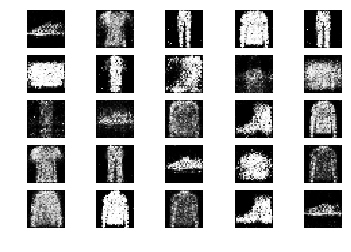

5201 [D loss: 0.654053, acc.: 59.38%] [G loss: 0.960467]
5202 [D loss: 0.644673, acc.: 65.62%] [G loss: 0.867551]
5203 [D loss: 0.630776, acc.: 62.50%] [G loss: 0.901118]
5204 [D loss: 0.672780, acc.: 56.25%] [G loss: 0.940663]
5205 [D loss: 0.643853, acc.: 62.50%] [G loss: 0.976767]
5206 [D loss: 0.657714, acc.: 64.06%] [G loss: 0.830082]
5207 [D loss: 0.645303, acc.: 64.06%] [G loss: 0.912644]
5208 [D loss: 0.678844, acc.: 62.50%] [G loss: 0.928145]
5209 [D loss: 0.618271, acc.: 65.62%] [G loss: 0.914543]
5210 [D loss: 0.675619, acc.: 57.81%] [G loss: 0.950757]
5211 [D loss: 0.671369, acc.: 62.50%] [G loss: 1.039154]
5212 [D loss: 0.670260, acc.: 60.94%] [G loss: 0.932643]
5213 [D loss: 0.647844, acc.: 60.94%] [G loss: 0.907109]
5214 [D loss: 0.665796, acc.: 57.81%] [G loss: 0.872228]
5215 [D loss: 0.689438, acc.: 54.69%] [G loss: 0.950315]
5216 [D loss: 0.684359, acc.: 51.56%] [G loss: 0.895404]
5217 [D loss: 0.667119, acc.: 60.94%] [G loss: 0.978703]
5218 [D loss: 0.623996, acc.: 6

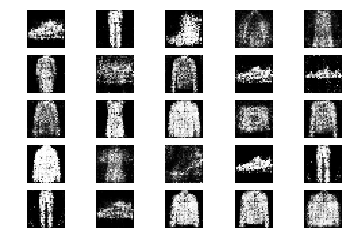

5251 [D loss: 0.610045, acc.: 64.06%] [G loss: 0.994282]
5252 [D loss: 0.658981, acc.: 59.38%] [G loss: 0.997116]
5253 [D loss: 0.661790, acc.: 60.94%] [G loss: 1.023079]
5254 [D loss: 0.647975, acc.: 67.19%] [G loss: 1.020091]
5255 [D loss: 0.664774, acc.: 45.31%] [G loss: 0.938498]
5256 [D loss: 0.563082, acc.: 71.88%] [G loss: 0.948078]
5257 [D loss: 0.644930, acc.: 57.81%] [G loss: 0.950993]
5258 [D loss: 0.586591, acc.: 65.62%] [G loss: 0.945047]
5259 [D loss: 0.637322, acc.: 67.19%] [G loss: 0.936061]
5260 [D loss: 0.707799, acc.: 57.81%] [G loss: 0.929815]
5261 [D loss: 0.640244, acc.: 64.06%] [G loss: 0.923829]
5262 [D loss: 0.621844, acc.: 67.19%] [G loss: 0.987691]
5263 [D loss: 0.602718, acc.: 65.62%] [G loss: 0.941512]
5264 [D loss: 0.660398, acc.: 51.56%] [G loss: 0.919125]
5265 [D loss: 0.658473, acc.: 65.62%] [G loss: 0.959876]
5266 [D loss: 0.681388, acc.: 60.94%] [G loss: 0.971107]
5267 [D loss: 0.674896, acc.: 59.38%] [G loss: 0.933199]
5268 [D loss: 0.713202, acc.: 5

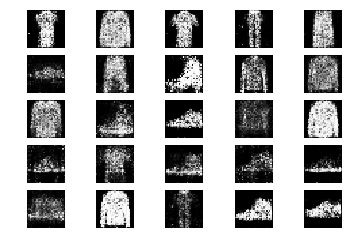

5301 [D loss: 0.757169, acc.: 43.75%] [G loss: 0.886687]
5302 [D loss: 0.694253, acc.: 62.50%] [G loss: 0.850530]
5303 [D loss: 0.654984, acc.: 60.94%] [G loss: 0.973891]
5304 [D loss: 0.705311, acc.: 54.69%] [G loss: 0.933121]
5305 [D loss: 0.621888, acc.: 67.19%] [G loss: 0.844459]
5306 [D loss: 0.700336, acc.: 54.69%] [G loss: 0.848729]
5307 [D loss: 0.640858, acc.: 70.31%] [G loss: 0.897726]
5308 [D loss: 0.626436, acc.: 65.62%] [G loss: 0.961797]
5309 [D loss: 0.585217, acc.: 70.31%] [G loss: 0.901119]
5310 [D loss: 0.607325, acc.: 64.06%] [G loss: 1.000726]
5311 [D loss: 0.659115, acc.: 64.06%] [G loss: 0.944474]
5312 [D loss: 0.628114, acc.: 59.38%] [G loss: 0.959615]
5313 [D loss: 0.628581, acc.: 62.50%] [G loss: 0.888616]
5314 [D loss: 0.680271, acc.: 62.50%] [G loss: 0.885402]
5315 [D loss: 0.631693, acc.: 64.06%] [G loss: 0.892807]
5316 [D loss: 0.674806, acc.: 56.25%] [G loss: 0.895267]
5317 [D loss: 0.695923, acc.: 51.56%] [G loss: 0.892650]
5318 [D loss: 0.697256, acc.: 4

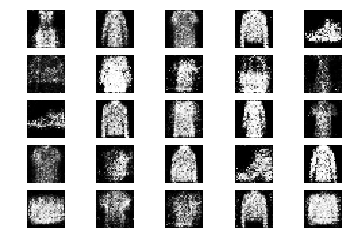

5351 [D loss: 0.632611, acc.: 67.19%] [G loss: 1.001229]
5352 [D loss: 0.556176, acc.: 70.31%] [G loss: 0.977100]
5353 [D loss: 0.611779, acc.: 64.06%] [G loss: 0.888680]
5354 [D loss: 0.575937, acc.: 73.44%] [G loss: 0.900347]
5355 [D loss: 0.635443, acc.: 65.62%] [G loss: 0.816405]
5356 [D loss: 0.682790, acc.: 57.81%] [G loss: 0.842381]
5357 [D loss: 0.639514, acc.: 65.62%] [G loss: 0.860021]
5358 [D loss: 0.665530, acc.: 57.81%] [G loss: 0.897309]
5359 [D loss: 0.722163, acc.: 46.88%] [G loss: 0.912533]
5360 [D loss: 0.642432, acc.: 60.94%] [G loss: 1.052502]
5361 [D loss: 0.659366, acc.: 64.06%] [G loss: 0.991853]
5362 [D loss: 0.589991, acc.: 70.31%] [G loss: 0.966993]
5363 [D loss: 0.656855, acc.: 60.94%] [G loss: 0.907232]
5364 [D loss: 0.690097, acc.: 50.00%] [G loss: 0.882782]
5365 [D loss: 0.620701, acc.: 70.31%] [G loss: 0.932561]
5366 [D loss: 0.609244, acc.: 70.31%] [G loss: 0.873217]
5367 [D loss: 0.683034, acc.: 54.69%] [G loss: 0.952245]
5368 [D loss: 0.725842, acc.: 5

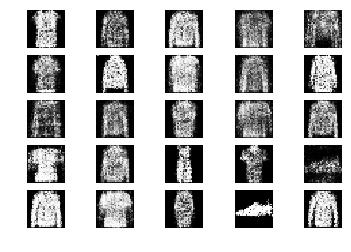

5401 [D loss: 0.651508, acc.: 60.94%] [G loss: 0.902971]
5402 [D loss: 0.648516, acc.: 64.06%] [G loss: 0.904565]
5403 [D loss: 0.570946, acc.: 67.19%] [G loss: 1.016652]
5404 [D loss: 0.582879, acc.: 68.75%] [G loss: 0.895989]
5405 [D loss: 0.670354, acc.: 57.81%] [G loss: 0.973095]
5406 [D loss: 0.616006, acc.: 70.31%] [G loss: 0.972065]
5407 [D loss: 0.612683, acc.: 64.06%] [G loss: 0.971431]
5408 [D loss: 0.601357, acc.: 60.94%] [G loss: 0.988842]
5409 [D loss: 0.683879, acc.: 53.12%] [G loss: 0.965139]
5410 [D loss: 0.578867, acc.: 75.00%] [G loss: 0.966187]
5411 [D loss: 0.612068, acc.: 64.06%] [G loss: 0.982768]
5412 [D loss: 0.621468, acc.: 62.50%] [G loss: 0.980046]
5413 [D loss: 0.601211, acc.: 64.06%] [G loss: 0.859267]
5414 [D loss: 0.619094, acc.: 65.62%] [G loss: 0.915260]
5415 [D loss: 0.609758, acc.: 59.38%] [G loss: 0.978226]
5416 [D loss: 0.678887, acc.: 57.81%] [G loss: 0.947066]
5417 [D loss: 0.721619, acc.: 59.38%] [G loss: 0.877242]
5418 [D loss: 0.654434, acc.: 6

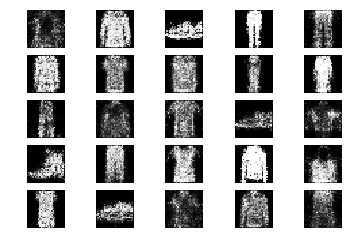

5451 [D loss: 0.615870, acc.: 64.06%] [G loss: 0.947035]
5452 [D loss: 0.716074, acc.: 53.12%] [G loss: 0.838659]
5453 [D loss: 0.686946, acc.: 50.00%] [G loss: 0.972043]
5454 [D loss: 0.629756, acc.: 60.94%] [G loss: 0.908042]
5455 [D loss: 0.602877, acc.: 70.31%] [G loss: 0.892850]
5456 [D loss: 0.685910, acc.: 54.69%] [G loss: 0.931396]
5457 [D loss: 0.687967, acc.: 54.69%] [G loss: 0.994917]
5458 [D loss: 0.660994, acc.: 60.94%] [G loss: 0.889910]
5459 [D loss: 0.692808, acc.: 53.12%] [G loss: 0.883124]
5460 [D loss: 0.693271, acc.: 54.69%] [G loss: 0.935413]
5461 [D loss: 0.701009, acc.: 50.00%] [G loss: 0.975297]
5462 [D loss: 0.653081, acc.: 64.06%] [G loss: 0.983076]
5463 [D loss: 0.648481, acc.: 62.50%] [G loss: 0.952473]
5464 [D loss: 0.652883, acc.: 54.69%] [G loss: 0.919868]
5465 [D loss: 0.604851, acc.: 65.62%] [G loss: 0.935696]
5466 [D loss: 0.655498, acc.: 59.38%] [G loss: 0.901274]
5467 [D loss: 0.643467, acc.: 59.38%] [G loss: 0.916085]
5468 [D loss: 0.685373, acc.: 6

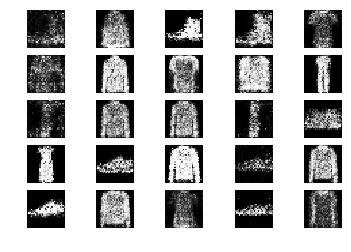

5501 [D loss: 0.593208, acc.: 70.31%] [G loss: 0.940330]
5502 [D loss: 0.591221, acc.: 65.62%] [G loss: 0.917254]
5503 [D loss: 0.615574, acc.: 60.94%] [G loss: 1.010724]
5504 [D loss: 0.740491, acc.: 56.25%] [G loss: 0.876853]
5505 [D loss: 0.679733, acc.: 57.81%] [G loss: 0.919142]
5506 [D loss: 0.629632, acc.: 64.06%] [G loss: 0.935689]
5507 [D loss: 0.730695, acc.: 50.00%] [G loss: 0.900695]
5508 [D loss: 0.637389, acc.: 67.19%] [G loss: 0.965661]
5509 [D loss: 0.592693, acc.: 68.75%] [G loss: 1.021240]
5510 [D loss: 0.656436, acc.: 56.25%] [G loss: 0.959343]
5511 [D loss: 0.628189, acc.: 67.19%] [G loss: 0.926433]
5512 [D loss: 0.622507, acc.: 70.31%] [G loss: 0.938910]
5513 [D loss: 0.703761, acc.: 53.12%] [G loss: 0.965991]
5514 [D loss: 0.670382, acc.: 64.06%] [G loss: 0.897459]
5515 [D loss: 0.566994, acc.: 68.75%] [G loss: 0.961439]
5516 [D loss: 0.595912, acc.: 68.75%] [G loss: 0.932109]
5517 [D loss: 0.620661, acc.: 67.19%] [G loss: 0.977355]
5518 [D loss: 0.649951, acc.: 6

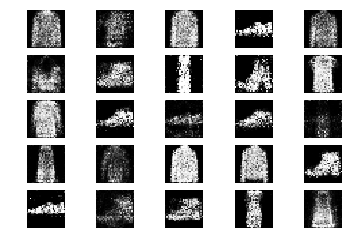

5551 [D loss: 0.660793, acc.: 57.81%] [G loss: 0.910334]
5552 [D loss: 0.624802, acc.: 64.06%] [G loss: 0.971590]
5553 [D loss: 0.587169, acc.: 70.31%] [G loss: 0.912251]
5554 [D loss: 0.633805, acc.: 60.94%] [G loss: 0.943517]
5555 [D loss: 0.613251, acc.: 67.19%] [G loss: 0.894222]
5556 [D loss: 0.656507, acc.: 60.94%] [G loss: 0.920847]
5557 [D loss: 0.684712, acc.: 46.88%] [G loss: 0.943761]
5558 [D loss: 0.605282, acc.: 68.75%] [G loss: 0.921760]
5559 [D loss: 0.646661, acc.: 60.94%] [G loss: 0.896032]
5560 [D loss: 0.610830, acc.: 71.88%] [G loss: 0.846871]
5561 [D loss: 0.650259, acc.: 60.94%] [G loss: 0.971706]
5562 [D loss: 0.645664, acc.: 59.38%] [G loss: 0.853133]
5563 [D loss: 0.656444, acc.: 62.50%] [G loss: 0.875432]
5564 [D loss: 0.615829, acc.: 68.75%] [G loss: 1.052581]
5565 [D loss: 0.683195, acc.: 54.69%] [G loss: 0.906390]
5566 [D loss: 0.619085, acc.: 68.75%] [G loss: 0.939700]
5567 [D loss: 0.665164, acc.: 60.94%] [G loss: 1.055120]
5568 [D loss: 0.609656, acc.: 6

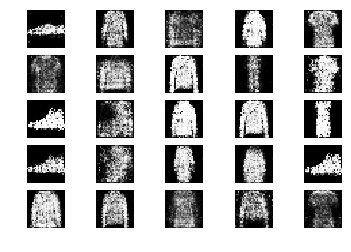

5601 [D loss: 0.602035, acc.: 67.19%] [G loss: 0.916949]
5602 [D loss: 0.659222, acc.: 67.19%] [G loss: 0.938013]
5603 [D loss: 0.605362, acc.: 60.94%] [G loss: 0.890687]
5604 [D loss: 0.625210, acc.: 73.44%] [G loss: 0.912327]
5605 [D loss: 0.620784, acc.: 64.06%] [G loss: 0.828705]
5606 [D loss: 0.609968, acc.: 67.19%] [G loss: 0.845116]
5607 [D loss: 0.621780, acc.: 67.19%] [G loss: 0.903245]
5608 [D loss: 0.643735, acc.: 60.94%] [G loss: 0.895147]
5609 [D loss: 0.636033, acc.: 67.19%] [G loss: 0.994175]
5610 [D loss: 0.618343, acc.: 68.75%] [G loss: 0.983776]
5611 [D loss: 0.686320, acc.: 59.38%] [G loss: 0.965942]
5612 [D loss: 0.635076, acc.: 68.75%] [G loss: 0.887989]
5613 [D loss: 0.723424, acc.: 60.94%] [G loss: 0.869116]
5614 [D loss: 0.647406, acc.: 62.50%] [G loss: 0.894197]
5615 [D loss: 0.699580, acc.: 56.25%] [G loss: 0.900599]
5616 [D loss: 0.609789, acc.: 60.94%] [G loss: 0.989633]
5617 [D loss: 0.636829, acc.: 64.06%] [G loss: 0.936553]
5618 [D loss: 0.699680, acc.: 4

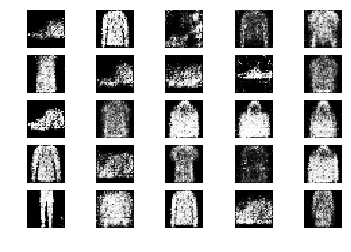

5651 [D loss: 0.647478, acc.: 64.06%] [G loss: 0.997361]
5652 [D loss: 0.615302, acc.: 70.31%] [G loss: 0.946578]
5653 [D loss: 0.571105, acc.: 76.56%] [G loss: 1.002063]
5654 [D loss: 0.648663, acc.: 64.06%] [G loss: 0.924329]
5655 [D loss: 0.663646, acc.: 64.06%] [G loss: 0.902093]
5656 [D loss: 0.690566, acc.: 53.12%] [G loss: 0.874937]
5657 [D loss: 0.561822, acc.: 78.12%] [G loss: 0.880423]
5658 [D loss: 0.682675, acc.: 59.38%] [G loss: 0.938952]
5659 [D loss: 0.610462, acc.: 62.50%] [G loss: 0.962032]
5660 [D loss: 0.675836, acc.: 50.00%] [G loss: 0.940044]
5661 [D loss: 0.673502, acc.: 56.25%] [G loss: 0.844178]
5662 [D loss: 0.604273, acc.: 60.94%] [G loss: 0.818075]
5663 [D loss: 0.619624, acc.: 62.50%] [G loss: 0.980725]
5664 [D loss: 0.687126, acc.: 60.94%] [G loss: 0.834263]
5665 [D loss: 0.647046, acc.: 60.94%] [G loss: 1.023171]
5666 [D loss: 0.682319, acc.: 57.81%] [G loss: 1.011625]
5667 [D loss: 0.644454, acc.: 60.94%] [G loss: 0.877580]
5668 [D loss: 0.582860, acc.: 7

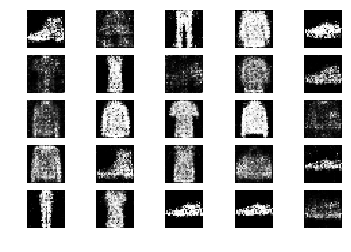

5701 [D loss: 0.641269, acc.: 65.62%] [G loss: 0.965156]
5702 [D loss: 0.589724, acc.: 73.44%] [G loss: 1.031216]
5703 [D loss: 0.682807, acc.: 54.69%] [G loss: 0.953510]
5704 [D loss: 0.670132, acc.: 57.81%] [G loss: 0.989171]
5705 [D loss: 0.589941, acc.: 70.31%] [G loss: 0.979951]
5706 [D loss: 0.602009, acc.: 73.44%] [G loss: 0.946452]
5707 [D loss: 0.606985, acc.: 71.88%] [G loss: 0.869918]
5708 [D loss: 0.546559, acc.: 78.12%] [G loss: 0.889662]
5709 [D loss: 0.634489, acc.: 64.06%] [G loss: 0.809214]
5710 [D loss: 0.649873, acc.: 62.50%] [G loss: 0.891517]
5711 [D loss: 0.618066, acc.: 65.62%] [G loss: 0.992786]
5712 [D loss: 0.699170, acc.: 60.94%] [G loss: 0.969780]
5713 [D loss: 0.663604, acc.: 54.69%] [G loss: 0.940523]
5714 [D loss: 0.594764, acc.: 70.31%] [G loss: 0.953315]
5715 [D loss: 0.651019, acc.: 59.38%] [G loss: 0.909510]
5716 [D loss: 0.591679, acc.: 70.31%] [G loss: 0.912092]
5717 [D loss: 0.704924, acc.: 54.69%] [G loss: 0.785268]
5718 [D loss: 0.680209, acc.: 5

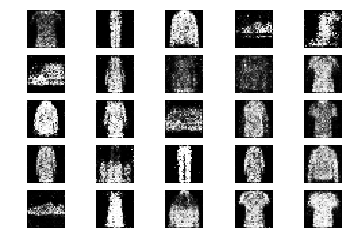

5751 [D loss: 0.702095, acc.: 50.00%] [G loss: 0.830438]
5752 [D loss: 0.647930, acc.: 67.19%] [G loss: 0.823683]
5753 [D loss: 0.629919, acc.: 65.62%] [G loss: 0.926960]
5754 [D loss: 0.654164, acc.: 59.38%] [G loss: 0.964423]
5755 [D loss: 0.669498, acc.: 57.81%] [G loss: 0.866848]
5756 [D loss: 0.569546, acc.: 71.88%] [G loss: 0.919604]
5757 [D loss: 0.632192, acc.: 68.75%] [G loss: 0.854061]
5758 [D loss: 0.675014, acc.: 54.69%] [G loss: 0.838977]
5759 [D loss: 0.662061, acc.: 65.62%] [G loss: 0.921948]
5760 [D loss: 0.591048, acc.: 65.62%] [G loss: 0.986287]
5761 [D loss: 0.674171, acc.: 57.81%] [G loss: 0.928333]
5762 [D loss: 0.640107, acc.: 60.94%] [G loss: 0.999591]
5763 [D loss: 0.674291, acc.: 67.19%] [G loss: 0.943856]
5764 [D loss: 0.583370, acc.: 73.44%] [G loss: 0.921310]
5765 [D loss: 0.599934, acc.: 67.19%] [G loss: 0.936245]
5766 [D loss: 0.648378, acc.: 60.94%] [G loss: 0.916487]
5767 [D loss: 0.686028, acc.: 57.81%] [G loss: 0.901989]
5768 [D loss: 0.614503, acc.: 6

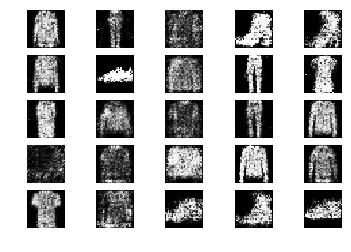

5801 [D loss: 0.597576, acc.: 68.75%] [G loss: 0.875835]
5802 [D loss: 0.654486, acc.: 68.75%] [G loss: 0.972382]
5803 [D loss: 0.630066, acc.: 60.94%] [G loss: 0.937268]
5804 [D loss: 0.694978, acc.: 51.56%] [G loss: 1.028452]
5805 [D loss: 0.709423, acc.: 51.56%] [G loss: 1.059048]
5806 [D loss: 0.634194, acc.: 62.50%] [G loss: 0.912236]
5807 [D loss: 0.643591, acc.: 64.06%] [G loss: 0.984134]
5808 [D loss: 0.655442, acc.: 53.12%] [G loss: 0.888111]
5809 [D loss: 0.658984, acc.: 60.94%] [G loss: 0.844453]
5810 [D loss: 0.625613, acc.: 62.50%] [G loss: 0.974113]
5811 [D loss: 0.667083, acc.: 56.25%] [G loss: 1.031754]
5812 [D loss: 0.664548, acc.: 53.12%] [G loss: 0.977260]
5813 [D loss: 0.635617, acc.: 67.19%] [G loss: 0.834581]
5814 [D loss: 0.671221, acc.: 65.62%] [G loss: 0.890899]
5815 [D loss: 0.702755, acc.: 57.81%] [G loss: 0.832819]
5816 [D loss: 0.678409, acc.: 60.94%] [G loss: 0.904866]
5817 [D loss: 0.660313, acc.: 62.50%] [G loss: 0.788910]
5818 [D loss: 0.658850, acc.: 5

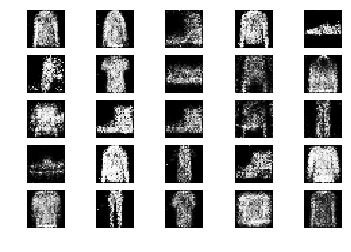

5851 [D loss: 0.624412, acc.: 54.69%] [G loss: 0.903188]
5852 [D loss: 0.639969, acc.: 62.50%] [G loss: 0.872487]
5853 [D loss: 0.675957, acc.: 53.12%] [G loss: 0.860893]
5854 [D loss: 0.648701, acc.: 67.19%] [G loss: 0.867484]
5855 [D loss: 0.631861, acc.: 64.06%] [G loss: 0.848855]
5856 [D loss: 0.636267, acc.: 67.19%] [G loss: 0.876038]
5857 [D loss: 0.604753, acc.: 68.75%] [G loss: 0.947033]
5858 [D loss: 0.715294, acc.: 50.00%] [G loss: 0.960426]
5859 [D loss: 0.628574, acc.: 70.31%] [G loss: 0.906704]
5860 [D loss: 0.588063, acc.: 73.44%] [G loss: 0.885785]
5861 [D loss: 0.525041, acc.: 76.56%] [G loss: 0.976662]
5862 [D loss: 0.637832, acc.: 67.19%] [G loss: 0.954906]
5863 [D loss: 0.630227, acc.: 67.19%] [G loss: 0.905087]
5864 [D loss: 0.595017, acc.: 71.88%] [G loss: 0.864681]
5865 [D loss: 0.631779, acc.: 62.50%] [G loss: 0.927585]
5866 [D loss: 0.697943, acc.: 59.38%] [G loss: 0.913253]
5867 [D loss: 0.613332, acc.: 67.19%] [G loss: 0.867453]
5868 [D loss: 0.653556, acc.: 5

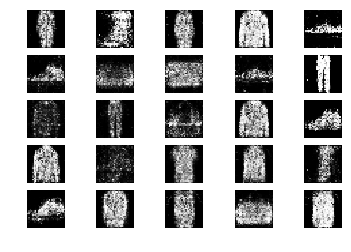

5901 [D loss: 0.619274, acc.: 59.38%] [G loss: 0.947618]
5902 [D loss: 0.573838, acc.: 67.19%] [G loss: 0.963508]
5903 [D loss: 0.718183, acc.: 51.56%] [G loss: 0.879669]
5904 [D loss: 0.604109, acc.: 70.31%] [G loss: 0.882014]
5905 [D loss: 0.678740, acc.: 57.81%] [G loss: 0.867439]
5906 [D loss: 0.677214, acc.: 60.94%] [G loss: 0.958946]
5907 [D loss: 0.577835, acc.: 73.44%] [G loss: 0.918040]
5908 [D loss: 0.649263, acc.: 60.94%] [G loss: 1.010901]
5909 [D loss: 0.667759, acc.: 60.94%] [G loss: 0.934789]
5910 [D loss: 0.645329, acc.: 64.06%] [G loss: 1.021481]
5911 [D loss: 0.676330, acc.: 60.94%] [G loss: 0.963437]
5912 [D loss: 0.605229, acc.: 68.75%] [G loss: 0.985781]
5913 [D loss: 0.669366, acc.: 59.38%] [G loss: 0.985024]
5914 [D loss: 0.691774, acc.: 54.69%] [G loss: 0.990631]
5915 [D loss: 0.725598, acc.: 46.88%] [G loss: 0.995045]
5916 [D loss: 0.629035, acc.: 64.06%] [G loss: 0.880055]
5917 [D loss: 0.622732, acc.: 65.62%] [G loss: 0.900008]
5918 [D loss: 0.729027, acc.: 5

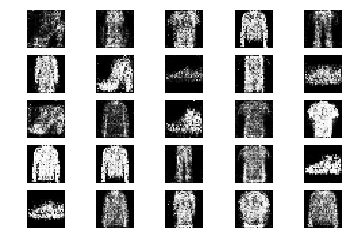

5951 [D loss: 0.694210, acc.: 57.81%] [G loss: 0.879806]
5952 [D loss: 0.669553, acc.: 54.69%] [G loss: 0.925750]
5953 [D loss: 0.665000, acc.: 59.38%] [G loss: 0.889393]
5954 [D loss: 0.659368, acc.: 62.50%] [G loss: 0.982910]
5955 [D loss: 0.681818, acc.: 62.50%] [G loss: 0.915884]
5956 [D loss: 0.624715, acc.: 64.06%] [G loss: 0.875433]
5957 [D loss: 0.691487, acc.: 57.81%] [G loss: 0.985529]
5958 [D loss: 0.599258, acc.: 70.31%] [G loss: 0.923176]
5959 [D loss: 0.631466, acc.: 60.94%] [G loss: 0.895772]
5960 [D loss: 0.711030, acc.: 54.69%] [G loss: 0.915424]
5961 [D loss: 0.588435, acc.: 65.62%] [G loss: 0.970847]
5962 [D loss: 0.655598, acc.: 56.25%] [G loss: 0.931426]
5963 [D loss: 0.693202, acc.: 56.25%] [G loss: 0.983167]
5964 [D loss: 0.627391, acc.: 57.81%] [G loss: 0.980078]
5965 [D loss: 0.664300, acc.: 57.81%] [G loss: 0.919677]
5966 [D loss: 0.636159, acc.: 68.75%] [G loss: 0.972067]
5967 [D loss: 0.640846, acc.: 67.19%] [G loss: 0.982964]
5968 [D loss: 0.652736, acc.: 6

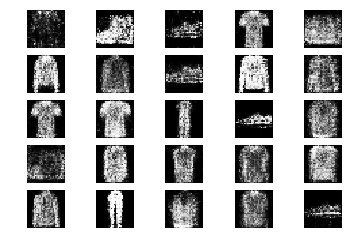

6001 [D loss: 0.598454, acc.: 78.12%] [G loss: 0.975034]
6002 [D loss: 0.594845, acc.: 67.19%] [G loss: 0.877707]
6003 [D loss: 0.733860, acc.: 53.12%] [G loss: 0.908231]
6004 [D loss: 0.623827, acc.: 64.06%] [G loss: 0.919397]
6005 [D loss: 0.682324, acc.: 62.50%] [G loss: 0.940222]
6006 [D loss: 0.675420, acc.: 54.69%] [G loss: 0.938829]
6007 [D loss: 0.624923, acc.: 67.19%] [G loss: 0.929873]
6008 [D loss: 0.580274, acc.: 75.00%] [G loss: 0.935578]
6009 [D loss: 0.706950, acc.: 51.56%] [G loss: 0.854396]
6010 [D loss: 0.613640, acc.: 65.62%] [G loss: 0.896070]
6011 [D loss: 0.661554, acc.: 60.94%] [G loss: 0.875058]
6012 [D loss: 0.708357, acc.: 53.12%] [G loss: 0.862531]
6013 [D loss: 0.632543, acc.: 62.50%] [G loss: 0.938104]
6014 [D loss: 0.616936, acc.: 65.62%] [G loss: 0.882833]
6015 [D loss: 0.685839, acc.: 59.38%] [G loss: 0.882241]
6016 [D loss: 0.643514, acc.: 60.94%] [G loss: 0.951054]
6017 [D loss: 0.640679, acc.: 67.19%] [G loss: 0.921372]
6018 [D loss: 0.625846, acc.: 6

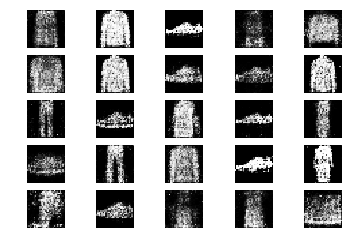

6051 [D loss: 0.612147, acc.: 65.62%] [G loss: 0.967256]
6052 [D loss: 0.660995, acc.: 65.62%] [G loss: 0.925876]
6053 [D loss: 0.658419, acc.: 65.62%] [G loss: 0.921136]
6054 [D loss: 0.724275, acc.: 40.62%] [G loss: 0.975208]
6055 [D loss: 0.655105, acc.: 62.50%] [G loss: 0.946329]
6056 [D loss: 0.667470, acc.: 62.50%] [G loss: 1.053508]
6057 [D loss: 0.660118, acc.: 57.81%] [G loss: 0.896986]
6058 [D loss: 0.617811, acc.: 60.94%] [G loss: 0.973708]
6059 [D loss: 0.660804, acc.: 64.06%] [G loss: 0.875406]
6060 [D loss: 0.659685, acc.: 60.94%] [G loss: 0.877126]
6061 [D loss: 0.674875, acc.: 60.94%] [G loss: 0.784489]
6062 [D loss: 0.649064, acc.: 65.62%] [G loss: 0.885563]
6063 [D loss: 0.712309, acc.: 59.38%] [G loss: 0.848481]
6064 [D loss: 0.603528, acc.: 73.44%] [G loss: 0.988361]
6065 [D loss: 0.593482, acc.: 70.31%] [G loss: 0.925748]
6066 [D loss: 0.639244, acc.: 60.94%] [G loss: 0.959148]
6067 [D loss: 0.619584, acc.: 68.75%] [G loss: 0.993384]
6068 [D loss: 0.562182, acc.: 7

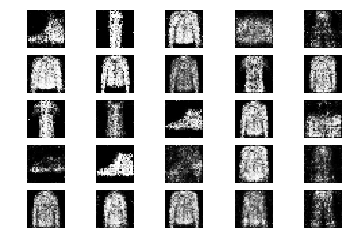

6101 [D loss: 0.629755, acc.: 67.19%] [G loss: 0.893984]
6102 [D loss: 0.648506, acc.: 64.06%] [G loss: 0.914516]
6103 [D loss: 0.691287, acc.: 57.81%] [G loss: 0.881417]
6104 [D loss: 0.667376, acc.: 62.50%] [G loss: 0.832177]
6105 [D loss: 0.627462, acc.: 56.25%] [G loss: 0.853756]
6106 [D loss: 0.665928, acc.: 54.69%] [G loss: 0.835218]
6107 [D loss: 0.672593, acc.: 51.56%] [G loss: 0.839601]
6108 [D loss: 0.620388, acc.: 67.19%] [G loss: 0.856220]
6109 [D loss: 0.658051, acc.: 57.81%] [G loss: 0.821412]
6110 [D loss: 0.596878, acc.: 67.19%] [G loss: 0.909777]
6111 [D loss: 0.596861, acc.: 60.94%] [G loss: 0.740191]
6112 [D loss: 0.634125, acc.: 67.19%] [G loss: 0.879970]
6113 [D loss: 0.703946, acc.: 51.56%] [G loss: 0.808074]
6114 [D loss: 0.630615, acc.: 65.62%] [G loss: 0.959430]
6115 [D loss: 0.594122, acc.: 68.75%] [G loss: 0.997380]
6116 [D loss: 0.626957, acc.: 60.94%] [G loss: 0.913825]
6117 [D loss: 0.668840, acc.: 62.50%] [G loss: 1.037487]
6118 [D loss: 0.588322, acc.: 6

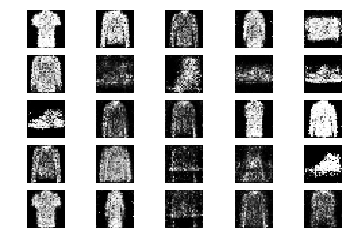

6151 [D loss: 0.667496, acc.: 64.06%] [G loss: 0.937009]
6152 [D loss: 0.617172, acc.: 64.06%] [G loss: 0.851673]
6153 [D loss: 0.650004, acc.: 65.62%] [G loss: 0.901236]
6154 [D loss: 0.623324, acc.: 60.94%] [G loss: 0.896070]
6155 [D loss: 0.663334, acc.: 56.25%] [G loss: 0.909640]
6156 [D loss: 0.684082, acc.: 64.06%] [G loss: 0.879338]
6157 [D loss: 0.684038, acc.: 54.69%] [G loss: 0.929110]
6158 [D loss: 0.622678, acc.: 68.75%] [G loss: 0.968662]
6159 [D loss: 0.624925, acc.: 62.50%] [G loss: 0.931020]
6160 [D loss: 0.699446, acc.: 43.75%] [G loss: 0.822200]
6161 [D loss: 0.702943, acc.: 50.00%] [G loss: 0.987825]
6162 [D loss: 0.660185, acc.: 64.06%] [G loss: 0.975069]
6163 [D loss: 0.680255, acc.: 59.38%] [G loss: 0.859002]
6164 [D loss: 0.659486, acc.: 64.06%] [G loss: 0.869451]
6165 [D loss: 0.641194, acc.: 65.62%] [G loss: 0.937674]
6166 [D loss: 0.640323, acc.: 64.06%] [G loss: 0.916438]
6167 [D loss: 0.678351, acc.: 50.00%] [G loss: 0.974018]
6168 [D loss: 0.659567, acc.: 5

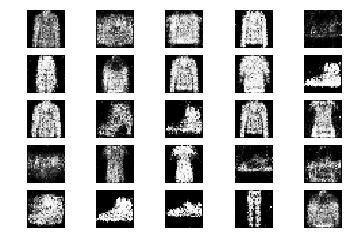

6201 [D loss: 0.662014, acc.: 60.94%] [G loss: 0.851769]
6202 [D loss: 0.676156, acc.: 54.69%] [G loss: 0.905405]
6203 [D loss: 0.644475, acc.: 64.06%] [G loss: 0.876748]
6204 [D loss: 0.587679, acc.: 67.19%] [G loss: 0.893350]
6205 [D loss: 0.597531, acc.: 68.75%] [G loss: 0.891634]
6206 [D loss: 0.663152, acc.: 53.12%] [G loss: 0.922607]
6207 [D loss: 0.647996, acc.: 57.81%] [G loss: 0.902041]
6208 [D loss: 0.696591, acc.: 60.94%] [G loss: 0.925081]
6209 [D loss: 0.583551, acc.: 67.19%] [G loss: 0.881462]
6210 [D loss: 0.658350, acc.: 57.81%] [G loss: 0.825781]
6211 [D loss: 0.609642, acc.: 67.19%] [G loss: 0.831203]
6212 [D loss: 0.715477, acc.: 51.56%] [G loss: 0.856122]
6213 [D loss: 0.650591, acc.: 59.38%] [G loss: 0.884581]
6214 [D loss: 0.685428, acc.: 59.38%] [G loss: 0.908533]
6215 [D loss: 0.641912, acc.: 65.62%] [G loss: 0.967511]
6216 [D loss: 0.628426, acc.: 67.19%] [G loss: 0.869181]
6217 [D loss: 0.712321, acc.: 50.00%] [G loss: 0.796701]
6218 [D loss: 0.673931, acc.: 5

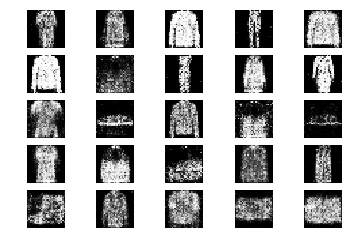

6251 [D loss: 0.538956, acc.: 79.69%] [G loss: 0.913450]
6252 [D loss: 0.607909, acc.: 75.00%] [G loss: 0.908639]
6253 [D loss: 0.655008, acc.: 59.38%] [G loss: 0.899954]
6254 [D loss: 0.699493, acc.: 54.69%] [G loss: 0.949072]
6255 [D loss: 0.686732, acc.: 56.25%] [G loss: 0.843567]
6256 [D loss: 0.601861, acc.: 71.88%] [G loss: 0.955742]
6257 [D loss: 0.666595, acc.: 60.94%] [G loss: 0.867541]
6258 [D loss: 0.636056, acc.: 64.06%] [G loss: 0.911784]
6259 [D loss: 0.689152, acc.: 56.25%] [G loss: 0.901055]
6260 [D loss: 0.626152, acc.: 62.50%] [G loss: 0.933126]
6261 [D loss: 0.624170, acc.: 62.50%] [G loss: 0.899736]
6262 [D loss: 0.641541, acc.: 62.50%] [G loss: 0.923700]
6263 [D loss: 0.663496, acc.: 53.12%] [G loss: 0.967920]
6264 [D loss: 0.607130, acc.: 65.62%] [G loss: 0.990860]
6265 [D loss: 0.682864, acc.: 59.38%] [G loss: 0.893254]
6266 [D loss: 0.630422, acc.: 67.19%] [G loss: 0.937680]
6267 [D loss: 0.684626, acc.: 53.12%] [G loss: 0.939172]
6268 [D loss: 0.666898, acc.: 6

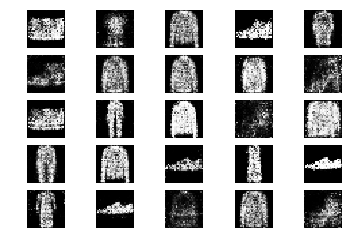

6301 [D loss: 0.669978, acc.: 57.81%] [G loss: 0.836121]
6302 [D loss: 0.595353, acc.: 68.75%] [G loss: 0.961669]
6303 [D loss: 0.567049, acc.: 71.88%] [G loss: 0.963743]
6304 [D loss: 0.592883, acc.: 68.75%] [G loss: 0.927656]
6305 [D loss: 0.665798, acc.: 59.38%] [G loss: 0.925384]
6306 [D loss: 0.614362, acc.: 62.50%] [G loss: 0.899254]
6307 [D loss: 0.648651, acc.: 65.62%] [G loss: 0.843987]
6308 [D loss: 0.678550, acc.: 59.38%] [G loss: 1.061833]
6309 [D loss: 0.634959, acc.: 67.19%] [G loss: 1.079506]
6310 [D loss: 0.659461, acc.: 62.50%] [G loss: 1.099514]
6311 [D loss: 0.682512, acc.: 67.19%] [G loss: 0.929758]
6312 [D loss: 0.692958, acc.: 57.81%] [G loss: 0.916318]
6313 [D loss: 0.602661, acc.: 67.19%] [G loss: 0.929453]
6314 [D loss: 0.694296, acc.: 54.69%] [G loss: 0.894929]
6315 [D loss: 0.600232, acc.: 64.06%] [G loss: 0.937706]
6316 [D loss: 0.602345, acc.: 65.62%] [G loss: 0.975047]
6317 [D loss: 0.645827, acc.: 62.50%] [G loss: 0.935483]
6318 [D loss: 0.660248, acc.: 6

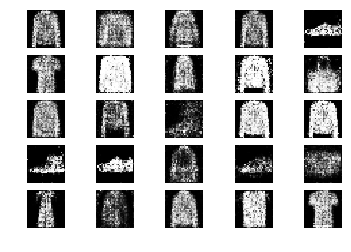

6351 [D loss: 0.685732, acc.: 53.12%] [G loss: 0.874347]
6352 [D loss: 0.665480, acc.: 54.69%] [G loss: 0.897756]
6353 [D loss: 0.615166, acc.: 70.31%] [G loss: 0.936993]
6354 [D loss: 0.619202, acc.: 70.31%] [G loss: 0.898763]
6355 [D loss: 0.663760, acc.: 70.31%] [G loss: 0.962522]
6356 [D loss: 0.570776, acc.: 73.44%] [G loss: 0.928704]
6357 [D loss: 0.710282, acc.: 51.56%] [G loss: 0.959165]
6358 [D loss: 0.592331, acc.: 67.19%] [G loss: 0.896628]
6359 [D loss: 0.662915, acc.: 60.94%] [G loss: 0.850173]
6360 [D loss: 0.676831, acc.: 60.94%] [G loss: 0.854890]
6361 [D loss: 0.637953, acc.: 60.94%] [G loss: 0.908162]
6362 [D loss: 0.687055, acc.: 56.25%] [G loss: 0.865209]
6363 [D loss: 0.669174, acc.: 62.50%] [G loss: 0.872113]
6364 [D loss: 0.675762, acc.: 54.69%] [G loss: 0.987261]
6365 [D loss: 0.628166, acc.: 59.38%] [G loss: 1.007605]
6366 [D loss: 0.631942, acc.: 64.06%] [G loss: 0.896560]
6367 [D loss: 0.717444, acc.: 51.56%] [G loss: 0.880515]
6368 [D loss: 0.625916, acc.: 6

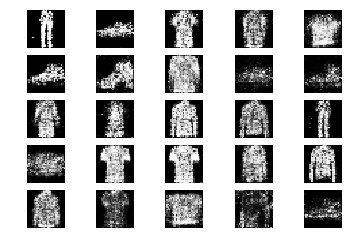

6401 [D loss: 0.649235, acc.: 59.38%] [G loss: 0.966774]
6402 [D loss: 0.700763, acc.: 53.12%] [G loss: 0.930272]
6403 [D loss: 0.640956, acc.: 64.06%] [G loss: 0.877607]
6404 [D loss: 0.642530, acc.: 56.25%] [G loss: 0.868271]
6405 [D loss: 0.639429, acc.: 67.19%] [G loss: 0.887396]
6406 [D loss: 0.643687, acc.: 60.94%] [G loss: 0.955411]
6407 [D loss: 0.696529, acc.: 56.25%] [G loss: 0.869745]
6408 [D loss: 0.705471, acc.: 50.00%] [G loss: 0.949596]
6409 [D loss: 0.612916, acc.: 70.31%] [G loss: 0.893367]
6410 [D loss: 0.638021, acc.: 67.19%] [G loss: 1.000552]
6411 [D loss: 0.654718, acc.: 70.31%] [G loss: 1.017526]
6412 [D loss: 0.666343, acc.: 64.06%] [G loss: 1.014094]
6413 [D loss: 0.632301, acc.: 68.75%] [G loss: 0.924115]
6414 [D loss: 0.644555, acc.: 57.81%] [G loss: 0.894113]
6415 [D loss: 0.635791, acc.: 68.75%] [G loss: 0.940220]
6416 [D loss: 0.594207, acc.: 70.31%] [G loss: 0.945758]
6417 [D loss: 0.631837, acc.: 62.50%] [G loss: 0.885087]
6418 [D loss: 0.603682, acc.: 6

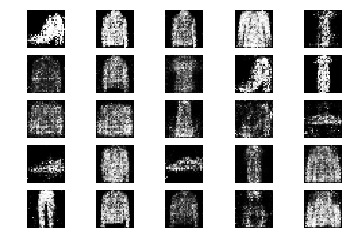

6451 [D loss: 0.640142, acc.: 57.81%] [G loss: 0.915644]
6452 [D loss: 0.621060, acc.: 67.19%] [G loss: 0.884221]
6453 [D loss: 0.610691, acc.: 67.19%] [G loss: 0.923145]
6454 [D loss: 0.672670, acc.: 62.50%] [G loss: 0.935905]
6455 [D loss: 0.589700, acc.: 70.31%] [G loss: 1.033781]
6456 [D loss: 0.655848, acc.: 57.81%] [G loss: 0.910286]
6457 [D loss: 0.577792, acc.: 67.19%] [G loss: 0.932199]
6458 [D loss: 0.670731, acc.: 59.38%] [G loss: 1.008102]
6459 [D loss: 0.615127, acc.: 62.50%] [G loss: 0.885547]
6460 [D loss: 0.634226, acc.: 62.50%] [G loss: 0.927179]
6461 [D loss: 0.605763, acc.: 73.44%] [G loss: 0.939101]
6462 [D loss: 0.655364, acc.: 57.81%] [G loss: 0.982711]
6463 [D loss: 0.544775, acc.: 81.25%] [G loss: 0.881696]
6464 [D loss: 0.643465, acc.: 56.25%] [G loss: 0.875749]
6465 [D loss: 0.613964, acc.: 62.50%] [G loss: 0.918604]
6466 [D loss: 0.602423, acc.: 75.00%] [G loss: 0.806115]
6467 [D loss: 0.648178, acc.: 59.38%] [G loss: 0.932189]
6468 [D loss: 0.638680, acc.: 6

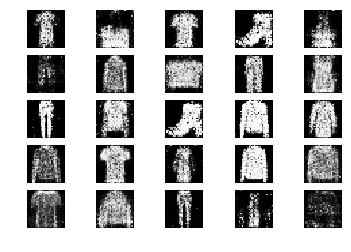

6501 [D loss: 0.649230, acc.: 62.50%] [G loss: 0.897927]
6502 [D loss: 0.656863, acc.: 64.06%] [G loss: 0.870866]
6503 [D loss: 0.675951, acc.: 53.12%] [G loss: 0.874190]
6504 [D loss: 0.678499, acc.: 56.25%] [G loss: 0.848560]
6505 [D loss: 0.651400, acc.: 57.81%] [G loss: 0.878410]
6506 [D loss: 0.712101, acc.: 53.12%] [G loss: 0.924285]
6507 [D loss: 0.650397, acc.: 54.69%] [G loss: 0.870021]
6508 [D loss: 0.688660, acc.: 53.12%] [G loss: 0.870114]
6509 [D loss: 0.616972, acc.: 64.06%] [G loss: 0.858183]
6510 [D loss: 0.681347, acc.: 54.69%] [G loss: 0.935274]
6511 [D loss: 0.627428, acc.: 67.19%] [G loss: 0.985400]
6512 [D loss: 0.559017, acc.: 67.19%] [G loss: 0.981408]
6513 [D loss: 0.627778, acc.: 64.06%] [G loss: 0.923028]
6514 [D loss: 0.706430, acc.: 51.56%] [G loss: 0.833571]
6515 [D loss: 0.637365, acc.: 67.19%] [G loss: 1.002467]
6516 [D loss: 0.692712, acc.: 59.38%] [G loss: 0.939222]
6517 [D loss: 0.646195, acc.: 68.75%] [G loss: 0.873567]
6518 [D loss: 0.641682, acc.: 6

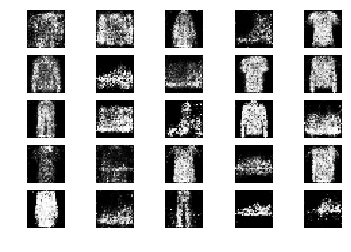

6551 [D loss: 0.713188, acc.: 51.56%] [G loss: 0.902518]
6552 [D loss: 0.697014, acc.: 48.44%] [G loss: 0.928536]
6553 [D loss: 0.681266, acc.: 62.50%] [G loss: 0.942114]
6554 [D loss: 0.629638, acc.: 70.31%] [G loss: 0.961431]
6555 [D loss: 0.647840, acc.: 59.38%] [G loss: 0.997214]
6556 [D loss: 0.648820, acc.: 64.06%] [G loss: 0.912209]
6557 [D loss: 0.666170, acc.: 60.94%] [G loss: 0.898309]
6558 [D loss: 0.644040, acc.: 62.50%] [G loss: 0.943632]
6559 [D loss: 0.642082, acc.: 54.69%] [G loss: 0.921264]
6560 [D loss: 0.622648, acc.: 62.50%] [G loss: 0.842027]
6561 [D loss: 0.714131, acc.: 56.25%] [G loss: 0.934739]
6562 [D loss: 0.640219, acc.: 71.88%] [G loss: 0.927947]
6563 [D loss: 0.595473, acc.: 71.88%] [G loss: 0.922790]
6564 [D loss: 0.650247, acc.: 54.69%] [G loss: 0.910076]
6565 [D loss: 0.622553, acc.: 64.06%] [G loss: 0.989069]
6566 [D loss: 0.607575, acc.: 62.50%] [G loss: 0.897646]
6567 [D loss: 0.596379, acc.: 73.44%] [G loss: 0.911106]
6568 [D loss: 0.672939, acc.: 5

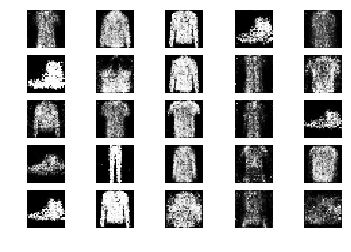

6601 [D loss: 0.662472, acc.: 64.06%] [G loss: 0.879231]
6602 [D loss: 0.658671, acc.: 59.38%] [G loss: 0.921138]
6603 [D loss: 0.654178, acc.: 64.06%] [G loss: 0.816383]
6604 [D loss: 0.670064, acc.: 56.25%] [G loss: 0.852046]
6605 [D loss: 0.696227, acc.: 51.56%] [G loss: 0.899719]
6606 [D loss: 0.684788, acc.: 56.25%] [G loss: 0.809595]
6607 [D loss: 0.631162, acc.: 62.50%] [G loss: 0.873669]
6608 [D loss: 0.702707, acc.: 53.12%] [G loss: 0.895357]
6609 [D loss: 0.654005, acc.: 57.81%] [G loss: 0.905685]
6610 [D loss: 0.663092, acc.: 62.50%] [G loss: 0.902153]
6611 [D loss: 0.675708, acc.: 62.50%] [G loss: 0.934390]
6612 [D loss: 0.636465, acc.: 60.94%] [G loss: 0.928430]
6613 [D loss: 0.687352, acc.: 50.00%] [G loss: 0.959717]
6614 [D loss: 0.600269, acc.: 71.88%] [G loss: 0.995254]
6615 [D loss: 0.650931, acc.: 60.94%] [G loss: 0.940959]
6616 [D loss: 0.651489, acc.: 64.06%] [G loss: 0.925067]
6617 [D loss: 0.672478, acc.: 50.00%] [G loss: 0.936424]
6618 [D loss: 0.657507, acc.: 5

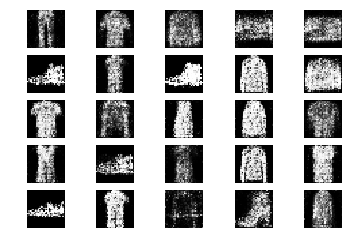

6651 [D loss: 0.716058, acc.: 56.25%] [G loss: 0.991606]
6652 [D loss: 0.674590, acc.: 59.38%] [G loss: 0.918141]
6653 [D loss: 0.654168, acc.: 57.81%] [G loss: 1.006674]
6654 [D loss: 0.659928, acc.: 62.50%] [G loss: 1.031391]
6655 [D loss: 0.600158, acc.: 71.88%] [G loss: 0.981837]
6656 [D loss: 0.618798, acc.: 62.50%] [G loss: 0.847969]
6657 [D loss: 0.641309, acc.: 57.81%] [G loss: 0.840718]
6658 [D loss: 0.606966, acc.: 70.31%] [G loss: 0.877769]
6659 [D loss: 0.595688, acc.: 68.75%] [G loss: 0.882165]
6660 [D loss: 0.623417, acc.: 71.88%] [G loss: 0.843684]
6661 [D loss: 0.695114, acc.: 64.06%] [G loss: 0.928724]
6662 [D loss: 0.606255, acc.: 70.31%] [G loss: 0.928198]
6663 [D loss: 0.641661, acc.: 67.19%] [G loss: 0.896656]
6664 [D loss: 0.627352, acc.: 62.50%] [G loss: 0.845621]
6665 [D loss: 0.690031, acc.: 56.25%] [G loss: 0.874164]
6666 [D loss: 0.662358, acc.: 53.12%] [G loss: 0.900687]
6667 [D loss: 0.632807, acc.: 60.94%] [G loss: 0.815663]
6668 [D loss: 0.653831, acc.: 6

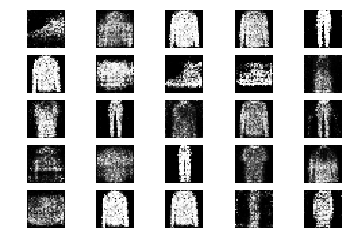

6701 [D loss: 0.698702, acc.: 53.12%] [G loss: 0.907077]
6702 [D loss: 0.659567, acc.: 59.38%] [G loss: 0.909275]
6703 [D loss: 0.662528, acc.: 57.81%] [G loss: 0.936680]
6704 [D loss: 0.697860, acc.: 60.94%] [G loss: 0.772854]
6705 [D loss: 0.634776, acc.: 60.94%] [G loss: 0.809495]
6706 [D loss: 0.652640, acc.: 64.06%] [G loss: 0.917777]
6707 [D loss: 0.724039, acc.: 51.56%] [G loss: 0.858409]
6708 [D loss: 0.619317, acc.: 67.19%] [G loss: 0.870062]
6709 [D loss: 0.660932, acc.: 62.50%] [G loss: 0.907899]
6710 [D loss: 0.661157, acc.: 59.38%] [G loss: 0.933539]
6711 [D loss: 0.678061, acc.: 54.69%] [G loss: 0.836881]
6712 [D loss: 0.656528, acc.: 59.38%] [G loss: 0.958064]
6713 [D loss: 0.704603, acc.: 45.31%] [G loss: 0.925259]
6714 [D loss: 0.707410, acc.: 53.12%] [G loss: 0.922573]
6715 [D loss: 0.619535, acc.: 68.75%] [G loss: 0.806713]
6716 [D loss: 0.705543, acc.: 50.00%] [G loss: 0.931579]
6717 [D loss: 0.669321, acc.: 57.81%] [G loss: 0.865941]
6718 [D loss: 0.678687, acc.: 6

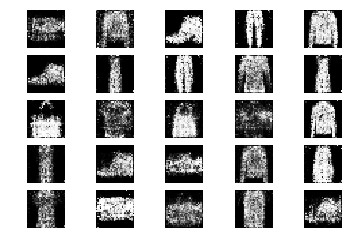

6751 [D loss: 0.659810, acc.: 54.69%] [G loss: 0.839490]
6752 [D loss: 0.724059, acc.: 50.00%] [G loss: 0.904749]
6753 [D loss: 0.665536, acc.: 59.38%] [G loss: 0.987664]
6754 [D loss: 0.614870, acc.: 65.62%] [G loss: 0.891889]
6755 [D loss: 0.649350, acc.: 60.94%] [G loss: 0.951619]
6756 [D loss: 0.623753, acc.: 67.19%] [G loss: 0.942106]
6757 [D loss: 0.698614, acc.: 56.25%] [G loss: 0.885102]
6758 [D loss: 0.677045, acc.: 59.38%] [G loss: 0.811645]
6759 [D loss: 0.629864, acc.: 64.06%] [G loss: 0.887993]
6760 [D loss: 0.713032, acc.: 50.00%] [G loss: 0.858209]
6761 [D loss: 0.656747, acc.: 60.94%] [G loss: 0.825847]
6762 [D loss: 0.611993, acc.: 76.56%] [G loss: 0.889179]
6763 [D loss: 0.639679, acc.: 59.38%] [G loss: 0.853840]
6764 [D loss: 0.746057, acc.: 48.44%] [G loss: 0.925927]
6765 [D loss: 0.573904, acc.: 79.69%] [G loss: 0.891314]
6766 [D loss: 0.626592, acc.: 65.62%] [G loss: 0.914631]
6767 [D loss: 0.612566, acc.: 68.75%] [G loss: 0.966644]
6768 [D loss: 0.720888, acc.: 5

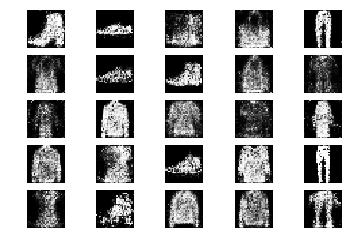

6801 [D loss: 0.676305, acc.: 50.00%] [G loss: 0.833594]
6802 [D loss: 0.651497, acc.: 62.50%] [G loss: 0.817190]
6803 [D loss: 0.605496, acc.: 68.75%] [G loss: 0.901611]
6804 [D loss: 0.626300, acc.: 64.06%] [G loss: 0.930309]
6805 [D loss: 0.605263, acc.: 65.62%] [G loss: 0.902811]
6806 [D loss: 0.698495, acc.: 62.50%] [G loss: 0.895123]
6807 [D loss: 0.632303, acc.: 56.25%] [G loss: 0.876172]
6808 [D loss: 0.732366, acc.: 40.62%] [G loss: 0.935609]
6809 [D loss: 0.660566, acc.: 56.25%] [G loss: 0.866196]
6810 [D loss: 0.690384, acc.: 68.75%] [G loss: 0.885159]
6811 [D loss: 0.638591, acc.: 64.06%] [G loss: 0.890186]
6812 [D loss: 0.630238, acc.: 65.62%] [G loss: 1.016963]
6813 [D loss: 0.666544, acc.: 57.81%] [G loss: 0.973308]
6814 [D loss: 0.693631, acc.: 56.25%] [G loss: 0.897348]
6815 [D loss: 0.705661, acc.: 48.44%] [G loss: 0.968778]
6816 [D loss: 0.650700, acc.: 62.50%] [G loss: 1.006216]
6817 [D loss: 0.718338, acc.: 53.12%] [G loss: 0.928310]
6818 [D loss: 0.629496, acc.: 6

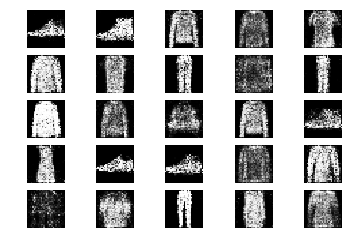

6851 [D loss: 0.642042, acc.: 67.19%] [G loss: 0.824533]
6852 [D loss: 0.645606, acc.: 59.38%] [G loss: 0.873068]
6853 [D loss: 0.612669, acc.: 64.06%] [G loss: 0.862509]
6854 [D loss: 0.624739, acc.: 62.50%] [G loss: 0.909396]
6855 [D loss: 0.690116, acc.: 46.88%] [G loss: 0.876284]
6856 [D loss: 0.745490, acc.: 51.56%] [G loss: 0.840076]
6857 [D loss: 0.616555, acc.: 62.50%] [G loss: 0.904722]
6858 [D loss: 0.653162, acc.: 60.94%] [G loss: 0.832780]
6859 [D loss: 0.664813, acc.: 65.62%] [G loss: 0.924771]
6860 [D loss: 0.612759, acc.: 71.88%] [G loss: 0.934718]
6861 [D loss: 0.765412, acc.: 48.44%] [G loss: 0.909431]
6862 [D loss: 0.712156, acc.: 51.56%] [G loss: 0.966852]
6863 [D loss: 0.628469, acc.: 64.06%] [G loss: 0.989280]
6864 [D loss: 0.654866, acc.: 67.19%] [G loss: 0.874360]
6865 [D loss: 0.658251, acc.: 62.50%] [G loss: 0.915600]
6866 [D loss: 0.629243, acc.: 65.62%] [G loss: 0.859434]
6867 [D loss: 0.610477, acc.: 60.94%] [G loss: 0.943458]
6868 [D loss: 0.629802, acc.: 6

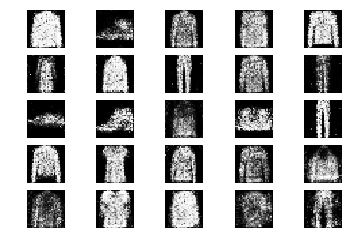

6901 [D loss: 0.706015, acc.: 43.75%] [G loss: 0.932263]
6902 [D loss: 0.619297, acc.: 62.50%] [G loss: 0.952130]
6903 [D loss: 0.647904, acc.: 60.94%] [G loss: 0.852114]
6904 [D loss: 0.622574, acc.: 64.06%] [G loss: 0.834383]
6905 [D loss: 0.629024, acc.: 70.31%] [G loss: 0.874592]
6906 [D loss: 0.635032, acc.: 67.19%] [G loss: 0.899850]
6907 [D loss: 0.723176, acc.: 54.69%] [G loss: 0.864758]
6908 [D loss: 0.639485, acc.: 64.06%] [G loss: 0.890567]
6909 [D loss: 0.665160, acc.: 54.69%] [G loss: 0.934808]
6910 [D loss: 0.617183, acc.: 65.62%] [G loss: 0.865211]
6911 [D loss: 0.653099, acc.: 59.38%] [G loss: 0.939624]
6912 [D loss: 0.649403, acc.: 64.06%] [G loss: 0.914761]
6913 [D loss: 0.700309, acc.: 53.12%] [G loss: 0.871961]
6914 [D loss: 0.666716, acc.: 59.38%] [G loss: 0.893890]
6915 [D loss: 0.590827, acc.: 62.50%] [G loss: 0.858391]
6916 [D loss: 0.619923, acc.: 70.31%] [G loss: 0.865324]
6917 [D loss: 0.652309, acc.: 57.81%] [G loss: 0.870708]
6918 [D loss: 0.607910, acc.: 6

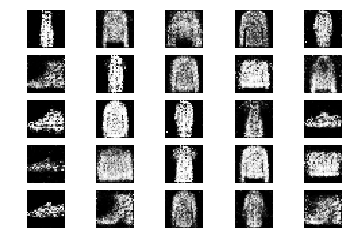

6951 [D loss: 0.635579, acc.: 60.94%] [G loss: 0.935007]
6952 [D loss: 0.663693, acc.: 60.94%] [G loss: 0.924917]
6953 [D loss: 0.676540, acc.: 57.81%] [G loss: 0.895213]
6954 [D loss: 0.645635, acc.: 54.69%] [G loss: 0.911813]
6955 [D loss: 0.675215, acc.: 53.12%] [G loss: 0.970032]
6956 [D loss: 0.669913, acc.: 62.50%] [G loss: 0.919778]
6957 [D loss: 0.692177, acc.: 51.56%] [G loss: 0.874741]
6958 [D loss: 0.658700, acc.: 56.25%] [G loss: 0.913027]
6959 [D loss: 0.667551, acc.: 57.81%] [G loss: 0.948543]
6960 [D loss: 0.663925, acc.: 62.50%] [G loss: 0.945705]
6961 [D loss: 0.714081, acc.: 59.38%] [G loss: 0.857947]
6962 [D loss: 0.656935, acc.: 60.94%] [G loss: 0.943908]
6963 [D loss: 0.625240, acc.: 71.88%] [G loss: 0.957886]
6964 [D loss: 0.671053, acc.: 65.62%] [G loss: 0.898806]
6965 [D loss: 0.637659, acc.: 62.50%] [G loss: 0.891836]
6966 [D loss: 0.694858, acc.: 50.00%] [G loss: 0.958750]
6967 [D loss: 0.641609, acc.: 62.50%] [G loss: 0.891235]
6968 [D loss: 0.674563, acc.: 5

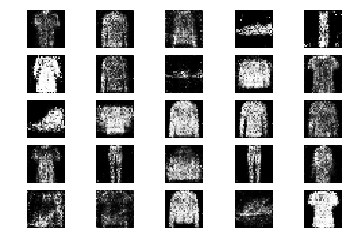

7001 [D loss: 0.660157, acc.: 60.94%] [G loss: 0.909241]
7002 [D loss: 0.644760, acc.: 65.62%] [G loss: 0.902008]
7003 [D loss: 0.615678, acc.: 73.44%] [G loss: 0.964455]
7004 [D loss: 0.615249, acc.: 67.19%] [G loss: 0.918547]
7005 [D loss: 0.677789, acc.: 57.81%] [G loss: 0.856540]
7006 [D loss: 0.740021, acc.: 50.00%] [G loss: 0.880479]
7007 [D loss: 0.662658, acc.: 59.38%] [G loss: 0.850970]
7008 [D loss: 0.673958, acc.: 53.12%] [G loss: 0.784694]
7009 [D loss: 0.596055, acc.: 68.75%] [G loss: 0.795634]
7010 [D loss: 0.625801, acc.: 62.50%] [G loss: 0.818246]
7011 [D loss: 0.621786, acc.: 60.94%] [G loss: 0.884584]
7012 [D loss: 0.611348, acc.: 70.31%] [G loss: 0.903147]
7013 [D loss: 0.646586, acc.: 54.69%] [G loss: 0.833353]
7014 [D loss: 0.689381, acc.: 56.25%] [G loss: 0.877251]
7015 [D loss: 0.624003, acc.: 67.19%] [G loss: 0.858901]
7016 [D loss: 0.615619, acc.: 65.62%] [G loss: 0.812265]
7017 [D loss: 0.627968, acc.: 67.19%] [G loss: 0.849995]
7018 [D loss: 0.702252, acc.: 5

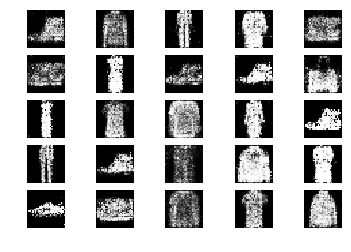

7051 [D loss: 0.660585, acc.: 60.94%] [G loss: 0.942625]
7052 [D loss: 0.712496, acc.: 46.88%] [G loss: 0.925057]
7053 [D loss: 0.587374, acc.: 71.88%] [G loss: 0.973868]
7054 [D loss: 0.700139, acc.: 54.69%] [G loss: 0.931333]
7055 [D loss: 0.649342, acc.: 64.06%] [G loss: 0.954510]
7056 [D loss: 0.626228, acc.: 64.06%] [G loss: 1.010618]
7057 [D loss: 0.658425, acc.: 60.94%] [G loss: 1.019728]
7058 [D loss: 0.623932, acc.: 62.50%] [G loss: 0.959152]
7059 [D loss: 0.602384, acc.: 62.50%] [G loss: 0.955653]
7060 [D loss: 0.684811, acc.: 54.69%] [G loss: 0.909712]
7061 [D loss: 0.593980, acc.: 68.75%] [G loss: 0.922093]
7062 [D loss: 0.675320, acc.: 64.06%] [G loss: 0.829389]
7063 [D loss: 0.662443, acc.: 56.25%] [G loss: 0.905853]
7064 [D loss: 0.631575, acc.: 60.94%] [G loss: 0.811519]
7065 [D loss: 0.682475, acc.: 53.12%] [G loss: 0.917207]
7066 [D loss: 0.627099, acc.: 73.44%] [G loss: 0.914267]
7067 [D loss: 0.662686, acc.: 65.62%] [G loss: 0.921117]
7068 [D loss: 0.661694, acc.: 6

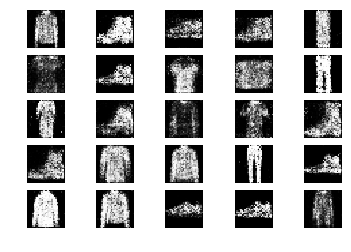

7101 [D loss: 0.625885, acc.: 65.62%] [G loss: 0.959098]
7102 [D loss: 0.679789, acc.: 56.25%] [G loss: 0.818351]
7103 [D loss: 0.616145, acc.: 60.94%] [G loss: 0.844278]
7104 [D loss: 0.733409, acc.: 54.69%] [G loss: 0.876840]
7105 [D loss: 0.618674, acc.: 71.88%] [G loss: 0.921969]
7106 [D loss: 0.606923, acc.: 67.19%] [G loss: 0.888393]
7107 [D loss: 0.637789, acc.: 65.62%] [G loss: 0.922244]
7108 [D loss: 0.663702, acc.: 57.81%] [G loss: 0.923664]
7109 [D loss: 0.635918, acc.: 62.50%] [G loss: 0.973316]
7110 [D loss: 0.655070, acc.: 64.06%] [G loss: 0.965773]
7111 [D loss: 0.659754, acc.: 56.25%] [G loss: 0.917806]
7112 [D loss: 0.631229, acc.: 62.50%] [G loss: 0.970586]
7113 [D loss: 0.712034, acc.: 48.44%] [G loss: 0.943037]
7114 [D loss: 0.650625, acc.: 62.50%] [G loss: 0.830815]
7115 [D loss: 0.637420, acc.: 67.19%] [G loss: 0.846499]
7116 [D loss: 0.671254, acc.: 59.38%] [G loss: 0.829032]
7117 [D loss: 0.620561, acc.: 68.75%] [G loss: 0.856675]
7118 [D loss: 0.562256, acc.: 7

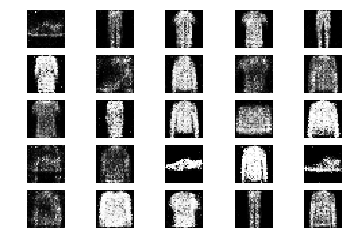

7151 [D loss: 0.634423, acc.: 70.31%] [G loss: 0.900813]
7152 [D loss: 0.697189, acc.: 56.25%] [G loss: 0.853891]
7153 [D loss: 0.713199, acc.: 53.12%] [G loss: 0.828221]
7154 [D loss: 0.646945, acc.: 64.06%] [G loss: 0.904619]
7155 [D loss: 0.660851, acc.: 65.62%] [G loss: 0.957373]
7156 [D loss: 0.645515, acc.: 64.06%] [G loss: 0.858890]
7157 [D loss: 0.682462, acc.: 57.81%] [G loss: 0.861560]
7158 [D loss: 0.622904, acc.: 62.50%] [G loss: 0.886316]
7159 [D loss: 0.643073, acc.: 59.38%] [G loss: 0.853844]
7160 [D loss: 0.611630, acc.: 67.19%] [G loss: 0.881227]
7161 [D loss: 0.637931, acc.: 65.62%] [G loss: 0.822507]
7162 [D loss: 0.638363, acc.: 60.94%] [G loss: 0.953168]
7163 [D loss: 0.655807, acc.: 56.25%] [G loss: 0.941475]
7164 [D loss: 0.624042, acc.: 62.50%] [G loss: 0.966178]
7165 [D loss: 0.638588, acc.: 60.94%] [G loss: 0.889999]
7166 [D loss: 0.672829, acc.: 57.81%] [G loss: 0.878627]
7167 [D loss: 0.620060, acc.: 65.62%] [G loss: 0.939739]
7168 [D loss: 0.664611, acc.: 6

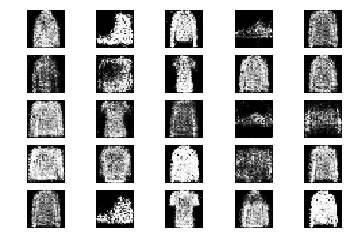

7201 [D loss: 0.610598, acc.: 64.06%] [G loss: 0.932034]
7202 [D loss: 0.616896, acc.: 65.62%] [G loss: 0.889804]
7203 [D loss: 0.704996, acc.: 56.25%] [G loss: 0.823483]
7204 [D loss: 0.679668, acc.: 64.06%] [G loss: 1.000931]
7205 [D loss: 0.557244, acc.: 79.69%] [G loss: 1.041373]
7206 [D loss: 0.672678, acc.: 59.38%] [G loss: 0.996326]
7207 [D loss: 0.687267, acc.: 62.50%] [G loss: 1.010161]
7208 [D loss: 0.604775, acc.: 65.62%] [G loss: 0.948990]
7209 [D loss: 0.686109, acc.: 54.69%] [G loss: 0.872367]
7210 [D loss: 0.647307, acc.: 60.94%] [G loss: 0.868592]
7211 [D loss: 0.716630, acc.: 57.81%] [G loss: 0.886368]
7212 [D loss: 0.629544, acc.: 65.62%] [G loss: 1.025249]
7213 [D loss: 0.654079, acc.: 56.25%] [G loss: 1.021417]
7214 [D loss: 0.643420, acc.: 57.81%] [G loss: 0.941312]
7215 [D loss: 0.619947, acc.: 68.75%] [G loss: 0.905232]
7216 [D loss: 0.642049, acc.: 62.50%] [G loss: 0.807792]
7217 [D loss: 0.614481, acc.: 60.94%] [G loss: 0.846552]
7218 [D loss: 0.620149, acc.: 6

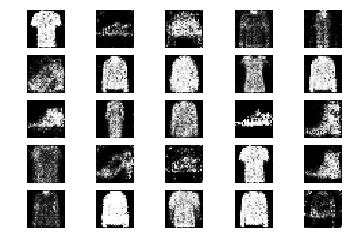

7251 [D loss: 0.662599, acc.: 59.38%] [G loss: 0.843892]
7252 [D loss: 0.664562, acc.: 57.81%] [G loss: 0.917139]
7253 [D loss: 0.625890, acc.: 73.44%] [G loss: 1.017357]
7254 [D loss: 0.650203, acc.: 64.06%] [G loss: 0.906155]
7255 [D loss: 0.660717, acc.: 64.06%] [G loss: 0.948479]
7256 [D loss: 0.679624, acc.: 56.25%] [G loss: 0.893981]
7257 [D loss: 0.656138, acc.: 65.62%] [G loss: 0.901317]
7258 [D loss: 0.625322, acc.: 67.19%] [G loss: 0.833590]
7259 [D loss: 0.564161, acc.: 73.44%] [G loss: 0.843528]
7260 [D loss: 0.689321, acc.: 59.38%] [G loss: 0.888232]
7261 [D loss: 0.647873, acc.: 62.50%] [G loss: 0.893657]
7262 [D loss: 0.633697, acc.: 60.94%] [G loss: 0.830850]
7263 [D loss: 0.633675, acc.: 62.50%] [G loss: 0.825491]
7264 [D loss: 0.621486, acc.: 57.81%] [G loss: 0.792983]
7265 [D loss: 0.719733, acc.: 48.44%] [G loss: 0.919796]
7266 [D loss: 0.637307, acc.: 70.31%] [G loss: 0.933072]
7267 [D loss: 0.596419, acc.: 68.75%] [G loss: 0.995893]
7268 [D loss: 0.646261, acc.: 6

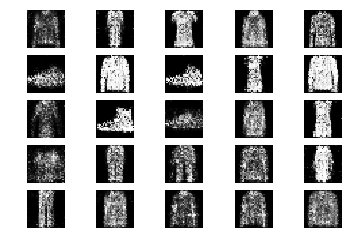

7301 [D loss: 0.653778, acc.: 60.94%] [G loss: 0.901969]
7302 [D loss: 0.627072, acc.: 59.38%] [G loss: 0.942747]
7303 [D loss: 0.616081, acc.: 68.75%] [G loss: 0.880295]
7304 [D loss: 0.647963, acc.: 57.81%] [G loss: 0.906238]
7305 [D loss: 0.744950, acc.: 48.44%] [G loss: 0.908536]
7306 [D loss: 0.634628, acc.: 68.75%] [G loss: 0.902329]
7307 [D loss: 0.665732, acc.: 60.94%] [G loss: 0.881013]
7308 [D loss: 0.691955, acc.: 48.44%] [G loss: 0.966865]
7309 [D loss: 0.654051, acc.: 53.12%] [G loss: 0.998971]
7310 [D loss: 0.676079, acc.: 56.25%] [G loss: 0.938846]
7311 [D loss: 0.716154, acc.: 54.69%] [G loss: 0.973158]
7312 [D loss: 0.652526, acc.: 54.69%] [G loss: 0.895595]
7313 [D loss: 0.655005, acc.: 56.25%] [G loss: 0.966084]
7314 [D loss: 0.676573, acc.: 53.12%] [G loss: 0.925621]
7315 [D loss: 0.628560, acc.: 57.81%] [G loss: 0.888482]
7316 [D loss: 0.677280, acc.: 60.94%] [G loss: 0.865157]
7317 [D loss: 0.642764, acc.: 57.81%] [G loss: 0.903250]
7318 [D loss: 0.663616, acc.: 6

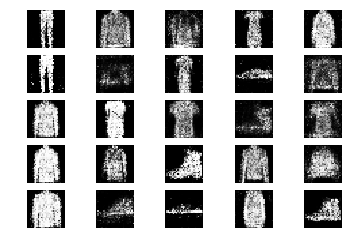

7351 [D loss: 0.613958, acc.: 70.31%] [G loss: 0.890406]
7352 [D loss: 0.642633, acc.: 57.81%] [G loss: 0.875904]
7353 [D loss: 0.691984, acc.: 57.81%] [G loss: 0.816989]
7354 [D loss: 0.623626, acc.: 65.62%] [G loss: 0.870650]
7355 [D loss: 0.664708, acc.: 57.81%] [G loss: 0.857485]
7356 [D loss: 0.724975, acc.: 45.31%] [G loss: 0.850869]
7357 [D loss: 0.631213, acc.: 64.06%] [G loss: 0.879685]
7358 [D loss: 0.673626, acc.: 59.38%] [G loss: 0.933835]
7359 [D loss: 0.662082, acc.: 59.38%] [G loss: 0.864583]
7360 [D loss: 0.728413, acc.: 48.44%] [G loss: 0.865476]
7361 [D loss: 0.663628, acc.: 48.44%] [G loss: 0.832685]
7362 [D loss: 0.663665, acc.: 59.38%] [G loss: 0.910040]
7363 [D loss: 0.574700, acc.: 76.56%] [G loss: 0.960540]
7364 [D loss: 0.598787, acc.: 70.31%] [G loss: 0.904541]
7365 [D loss: 0.621325, acc.: 64.06%] [G loss: 0.940582]
7366 [D loss: 0.699018, acc.: 46.88%] [G loss: 0.940095]
7367 [D loss: 0.698591, acc.: 62.50%] [G loss: 0.895402]
7368 [D loss: 0.619669, acc.: 6

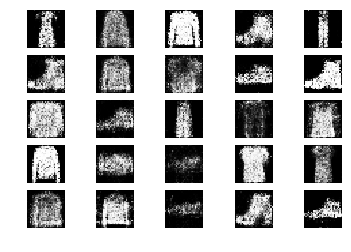

7401 [D loss: 0.594879, acc.: 65.62%] [G loss: 0.878215]
7402 [D loss: 0.636241, acc.: 68.75%] [G loss: 0.877240]
7403 [D loss: 0.623015, acc.: 70.31%] [G loss: 0.893012]
7404 [D loss: 0.695349, acc.: 53.12%] [G loss: 0.909773]
7405 [D loss: 0.635907, acc.: 62.50%] [G loss: 0.952200]
7406 [D loss: 0.641577, acc.: 62.50%] [G loss: 0.909882]
7407 [D loss: 0.615774, acc.: 70.31%] [G loss: 0.955025]
7408 [D loss: 0.687975, acc.: 57.81%] [G loss: 0.888074]
7409 [D loss: 0.656391, acc.: 56.25%] [G loss: 0.832126]
7410 [D loss: 0.656364, acc.: 60.94%] [G loss: 0.846476]
7411 [D loss: 0.643846, acc.: 60.94%] [G loss: 0.918412]
7412 [D loss: 0.625967, acc.: 65.62%] [G loss: 0.917227]
7413 [D loss: 0.643242, acc.: 56.25%] [G loss: 0.927777]
7414 [D loss: 0.654166, acc.: 68.75%] [G loss: 0.865813]
7415 [D loss: 0.699106, acc.: 57.81%] [G loss: 0.934585]
7416 [D loss: 0.602148, acc.: 67.19%] [G loss: 0.943592]
7417 [D loss: 0.706349, acc.: 59.38%] [G loss: 0.895265]
7418 [D loss: 0.667101, acc.: 5

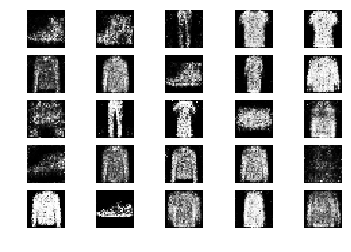

7451 [D loss: 0.641886, acc.: 62.50%] [G loss: 0.844428]
7452 [D loss: 0.671975, acc.: 53.12%] [G loss: 0.850870]
7453 [D loss: 0.658197, acc.: 57.81%] [G loss: 0.868408]
7454 [D loss: 0.644376, acc.: 57.81%] [G loss: 0.917299]
7455 [D loss: 0.643695, acc.: 65.62%] [G loss: 0.859643]
7456 [D loss: 0.631446, acc.: 70.31%] [G loss: 0.817906]
7457 [D loss: 0.696713, acc.: 56.25%] [G loss: 0.961599]
7458 [D loss: 0.650490, acc.: 59.38%] [G loss: 0.938704]
7459 [D loss: 0.698296, acc.: 53.12%] [G loss: 0.890136]
7460 [D loss: 0.674435, acc.: 54.69%] [G loss: 0.864019]
7461 [D loss: 0.641934, acc.: 59.38%] [G loss: 0.876222]
7462 [D loss: 0.641874, acc.: 57.81%] [G loss: 0.969415]
7463 [D loss: 0.578174, acc.: 78.12%] [G loss: 0.905059]
7464 [D loss: 0.648188, acc.: 57.81%] [G loss: 1.001812]
7465 [D loss: 0.673708, acc.: 60.94%] [G loss: 0.953634]
7466 [D loss: 0.673330, acc.: 59.38%] [G loss: 0.931454]
7467 [D loss: 0.688103, acc.: 51.56%] [G loss: 0.931677]
7468 [D loss: 0.603605, acc.: 6

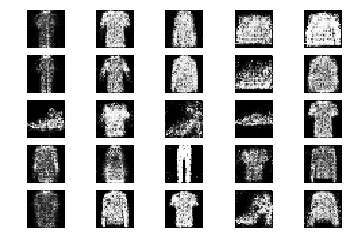

7501 [D loss: 0.690888, acc.: 59.38%] [G loss: 0.984827]
7502 [D loss: 0.664766, acc.: 57.81%] [G loss: 0.978117]
7503 [D loss: 0.611568, acc.: 65.62%] [G loss: 0.973676]
7504 [D loss: 0.656663, acc.: 56.25%] [G loss: 0.947376]
7505 [D loss: 0.651475, acc.: 62.50%] [G loss: 0.979968]
7506 [D loss: 0.674708, acc.: 60.94%] [G loss: 0.992445]
7507 [D loss: 0.650254, acc.: 53.12%] [G loss: 1.012853]
7508 [D loss: 0.585572, acc.: 79.69%] [G loss: 0.973637]
7509 [D loss: 0.672328, acc.: 67.19%] [G loss: 0.913679]
7510 [D loss: 0.680162, acc.: 62.50%] [G loss: 0.847647]
7511 [D loss: 0.645094, acc.: 60.94%] [G loss: 0.831419]
7512 [D loss: 0.731859, acc.: 56.25%] [G loss: 0.843224]
7513 [D loss: 0.614728, acc.: 64.06%] [G loss: 0.865129]
7514 [D loss: 0.680747, acc.: 57.81%] [G loss: 0.933787]
7515 [D loss: 0.674807, acc.: 62.50%] [G loss: 0.948505]
7516 [D loss: 0.612237, acc.: 68.75%] [G loss: 0.846351]
7517 [D loss: 0.620714, acc.: 65.62%] [G loss: 0.839319]
7518 [D loss: 0.640544, acc.: 5

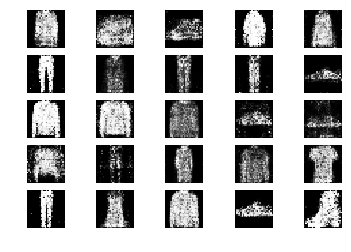

7551 [D loss: 0.687020, acc.: 56.25%] [G loss: 0.883789]
7552 [D loss: 0.656227, acc.: 62.50%] [G loss: 0.891562]
7553 [D loss: 0.664369, acc.: 57.81%] [G loss: 0.958312]
7554 [D loss: 0.689100, acc.: 53.12%] [G loss: 0.962245]
7555 [D loss: 0.633886, acc.: 62.50%] [G loss: 0.867239]
7556 [D loss: 0.666152, acc.: 59.38%] [G loss: 0.960626]
7557 [D loss: 0.670508, acc.: 59.38%] [G loss: 0.829182]
7558 [D loss: 0.703519, acc.: 53.12%] [G loss: 0.960461]
7559 [D loss: 0.703328, acc.: 51.56%] [G loss: 0.865244]
7560 [D loss: 0.673020, acc.: 57.81%] [G loss: 0.913668]
7561 [D loss: 0.623030, acc.: 59.38%] [G loss: 0.880808]
7562 [D loss: 0.671429, acc.: 56.25%] [G loss: 0.891753]
7563 [D loss: 0.629301, acc.: 65.62%] [G loss: 0.869853]
7564 [D loss: 0.647744, acc.: 68.75%] [G loss: 0.823829]
7565 [D loss: 0.635709, acc.: 62.50%] [G loss: 0.880482]
7566 [D loss: 0.691309, acc.: 50.00%] [G loss: 0.908842]
7567 [D loss: 0.614399, acc.: 64.06%] [G loss: 0.912184]
7568 [D loss: 0.579110, acc.: 7

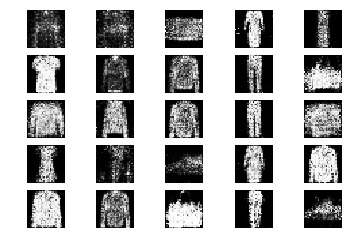

7601 [D loss: 0.627958, acc.: 60.94%] [G loss: 0.825212]
7602 [D loss: 0.682208, acc.: 56.25%] [G loss: 0.851870]
7603 [D loss: 0.646883, acc.: 64.06%] [G loss: 0.830520]
7604 [D loss: 0.668359, acc.: 54.69%] [G loss: 0.912525]
7605 [D loss: 0.640372, acc.: 62.50%] [G loss: 0.849141]
7606 [D loss: 0.698345, acc.: 50.00%] [G loss: 0.919615]
7607 [D loss: 0.669011, acc.: 64.06%] [G loss: 0.846151]
7608 [D loss: 0.712916, acc.: 56.25%] [G loss: 0.941443]
7609 [D loss: 0.702692, acc.: 51.56%] [G loss: 0.976228]
7610 [D loss: 0.644200, acc.: 67.19%] [G loss: 0.974993]
7611 [D loss: 0.632806, acc.: 65.62%] [G loss: 0.954668]
7612 [D loss: 0.666203, acc.: 59.38%] [G loss: 0.919501]
7613 [D loss: 0.692634, acc.: 57.81%] [G loss: 0.910006]
7614 [D loss: 0.653919, acc.: 57.81%] [G loss: 0.923872]
7615 [D loss: 0.601654, acc.: 73.44%] [G loss: 0.907589]
7616 [D loss: 0.597668, acc.: 68.75%] [G loss: 0.902020]
7617 [D loss: 0.651955, acc.: 62.50%] [G loss: 0.928416]
7618 [D loss: 0.646366, acc.: 6

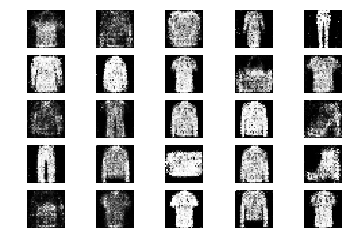

7651 [D loss: 0.745878, acc.: 45.31%] [G loss: 0.854354]
7652 [D loss: 0.628514, acc.: 57.81%] [G loss: 0.984800]
7653 [D loss: 0.662162, acc.: 57.81%] [G loss: 0.995143]
7654 [D loss: 0.629494, acc.: 64.06%] [G loss: 0.920652]
7655 [D loss: 0.668792, acc.: 53.12%] [G loss: 0.865618]
7656 [D loss: 0.667417, acc.: 59.38%] [G loss: 0.804626]
7657 [D loss: 0.682116, acc.: 59.38%] [G loss: 0.890707]
7658 [D loss: 0.625014, acc.: 60.94%] [G loss: 0.882089]
7659 [D loss: 0.677836, acc.: 62.50%] [G loss: 1.002253]
7660 [D loss: 0.668996, acc.: 57.81%] [G loss: 0.842546]
7661 [D loss: 0.609994, acc.: 67.19%] [G loss: 0.908227]
7662 [D loss: 0.599186, acc.: 62.50%] [G loss: 0.884152]
7663 [D loss: 0.638015, acc.: 62.50%] [G loss: 0.860515]
7664 [D loss: 0.634259, acc.: 64.06%] [G loss: 0.968021]
7665 [D loss: 0.717246, acc.: 51.56%] [G loss: 0.952091]
7666 [D loss: 0.684130, acc.: 56.25%] [G loss: 0.841799]
7667 [D loss: 0.693291, acc.: 51.56%] [G loss: 0.892942]
7668 [D loss: 0.567044, acc.: 7

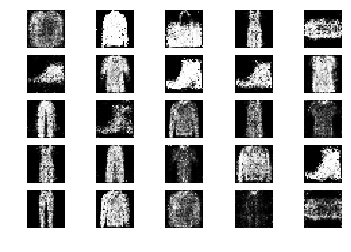

7701 [D loss: 0.661943, acc.: 60.94%] [G loss: 0.829465]
7702 [D loss: 0.680992, acc.: 56.25%] [G loss: 0.859526]
7703 [D loss: 0.710453, acc.: 50.00%] [G loss: 0.892066]
7704 [D loss: 0.592531, acc.: 73.44%] [G loss: 0.913284]
7705 [D loss: 0.673133, acc.: 57.81%] [G loss: 0.950805]
7706 [D loss: 0.665777, acc.: 48.44%] [G loss: 0.956908]
7707 [D loss: 0.660669, acc.: 56.25%] [G loss: 0.880642]
7708 [D loss: 0.682602, acc.: 60.94%] [G loss: 0.953263]
7709 [D loss: 0.624282, acc.: 64.06%] [G loss: 0.991670]
7710 [D loss: 0.682642, acc.: 59.38%] [G loss: 0.966033]
7711 [D loss: 0.696127, acc.: 50.00%] [G loss: 0.892255]
7712 [D loss: 0.760970, acc.: 46.88%] [G loss: 0.913788]
7713 [D loss: 0.644514, acc.: 65.62%] [G loss: 0.855933]
7714 [D loss: 0.633482, acc.: 62.50%] [G loss: 0.837581]
7715 [D loss: 0.698424, acc.: 56.25%] [G loss: 0.850672]
7716 [D loss: 0.621201, acc.: 62.50%] [G loss: 1.003968]
7717 [D loss: 0.737051, acc.: 46.88%] [G loss: 0.889773]
7718 [D loss: 0.641569, acc.: 6

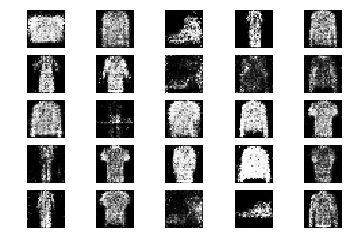

7751 [D loss: 0.589520, acc.: 68.75%] [G loss: 0.912057]
7752 [D loss: 0.590166, acc.: 70.31%] [G loss: 0.886199]
7753 [D loss: 0.627603, acc.: 65.62%] [G loss: 0.868565]
7754 [D loss: 0.611145, acc.: 67.19%] [G loss: 0.831764]
7755 [D loss: 0.600452, acc.: 67.19%] [G loss: 0.900987]
7756 [D loss: 0.697607, acc.: 62.50%] [G loss: 0.890915]
7757 [D loss: 0.667595, acc.: 60.94%] [G loss: 0.831316]
7758 [D loss: 0.669995, acc.: 62.50%] [G loss: 0.838234]
7759 [D loss: 0.617602, acc.: 71.88%] [G loss: 0.869572]
7760 [D loss: 0.613643, acc.: 71.88%] [G loss: 0.889020]
7761 [D loss: 0.628927, acc.: 62.50%] [G loss: 0.859256]
7762 [D loss: 0.622612, acc.: 59.38%] [G loss: 0.808777]
7763 [D loss: 0.617319, acc.: 71.88%] [G loss: 0.821849]
7764 [D loss: 0.610061, acc.: 65.62%] [G loss: 0.906957]
7765 [D loss: 0.612543, acc.: 70.31%] [G loss: 1.019053]
7766 [D loss: 0.633408, acc.: 67.19%] [G loss: 0.858758]
7767 [D loss: 0.635458, acc.: 62.50%] [G loss: 0.904233]
7768 [D loss: 0.639569, acc.: 5

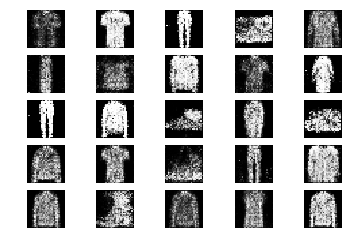

7801 [D loss: 0.675992, acc.: 54.69%] [G loss: 0.885462]
7802 [D loss: 0.639992, acc.: 60.94%] [G loss: 0.939002]
7803 [D loss: 0.647347, acc.: 60.94%] [G loss: 0.866560]
7804 [D loss: 0.635608, acc.: 62.50%] [G loss: 0.944573]
7805 [D loss: 0.669151, acc.: 62.50%] [G loss: 0.886674]
7806 [D loss: 0.623512, acc.: 62.50%] [G loss: 0.932190]
7807 [D loss: 0.652027, acc.: 57.81%] [G loss: 0.891842]
7808 [D loss: 0.595767, acc.: 75.00%] [G loss: 0.848547]
7809 [D loss: 0.651275, acc.: 65.62%] [G loss: 0.904436]
7810 [D loss: 0.653414, acc.: 59.38%] [G loss: 0.887249]
7811 [D loss: 0.608796, acc.: 73.44%] [G loss: 0.975914]
7812 [D loss: 0.670458, acc.: 65.62%] [G loss: 0.965566]
7813 [D loss: 0.587278, acc.: 73.44%] [G loss: 0.923759]
7814 [D loss: 0.665612, acc.: 64.06%] [G loss: 0.892503]
7815 [D loss: 0.652483, acc.: 70.31%] [G loss: 0.813555]
7816 [D loss: 0.681781, acc.: 57.81%] [G loss: 0.885590]
7817 [D loss: 0.714159, acc.: 53.12%] [G loss: 0.993697]
7818 [D loss: 0.715493, acc.: 4

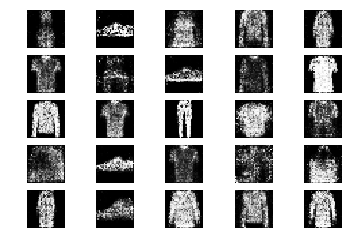

7851 [D loss: 0.654117, acc.: 56.25%] [G loss: 0.988503]
7852 [D loss: 0.592488, acc.: 67.19%] [G loss: 0.993492]
7853 [D loss: 0.669466, acc.: 59.38%] [G loss: 0.965828]
7854 [D loss: 0.609779, acc.: 75.00%] [G loss: 0.918327]
7855 [D loss: 0.659693, acc.: 59.38%] [G loss: 0.964234]
7856 [D loss: 0.672518, acc.: 54.69%] [G loss: 0.929288]
7857 [D loss: 0.631016, acc.: 64.06%] [G loss: 0.869544]
7858 [D loss: 0.691372, acc.: 60.94%] [G loss: 0.893893]
7859 [D loss: 0.658628, acc.: 67.19%] [G loss: 0.871973]
7860 [D loss: 0.606539, acc.: 62.50%] [G loss: 0.867897]
7861 [D loss: 0.619908, acc.: 73.44%] [G loss: 1.004693]
7862 [D loss: 0.685866, acc.: 54.69%] [G loss: 0.976194]
7863 [D loss: 0.718450, acc.: 54.69%] [G loss: 0.933746]
7864 [D loss: 0.619909, acc.: 67.19%] [G loss: 1.055087]
7865 [D loss: 0.653365, acc.: 59.38%] [G loss: 0.954701]
7866 [D loss: 0.709232, acc.: 54.69%] [G loss: 0.868440]
7867 [D loss: 0.655519, acc.: 53.12%] [G loss: 0.920610]
7868 [D loss: 0.675150, acc.: 6

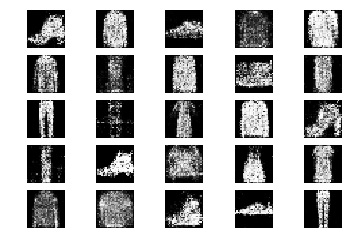

7901 [D loss: 0.620274, acc.: 67.19%] [G loss: 0.912678]
7902 [D loss: 0.681194, acc.: 54.69%] [G loss: 0.882861]
7903 [D loss: 0.666232, acc.: 62.50%] [G loss: 0.858948]
7904 [D loss: 0.642948, acc.: 67.19%] [G loss: 0.861390]
7905 [D loss: 0.633806, acc.: 62.50%] [G loss: 0.772206]
7906 [D loss: 0.656539, acc.: 54.69%] [G loss: 0.873873]
7907 [D loss: 0.708298, acc.: 56.25%] [G loss: 0.890204]
7908 [D loss: 0.642761, acc.: 64.06%] [G loss: 0.793787]
7909 [D loss: 0.673398, acc.: 50.00%] [G loss: 0.884636]
7910 [D loss: 0.648184, acc.: 57.81%] [G loss: 0.865595]
7911 [D loss: 0.666940, acc.: 57.81%] [G loss: 0.914223]
7912 [D loss: 0.703129, acc.: 46.88%] [G loss: 0.922454]
7913 [D loss: 0.620206, acc.: 59.38%] [G loss: 0.900859]
7914 [D loss: 0.633049, acc.: 60.94%] [G loss: 0.887593]
7915 [D loss: 0.631727, acc.: 64.06%] [G loss: 0.904972]
7916 [D loss: 0.648462, acc.: 60.94%] [G loss: 0.877567]
7917 [D loss: 0.620897, acc.: 70.31%] [G loss: 0.879273]
7918 [D loss: 0.642252, acc.: 5

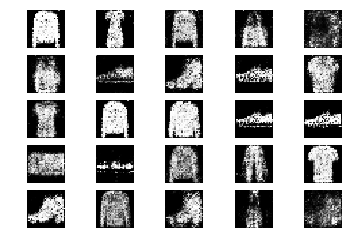

7951 [D loss: 0.589870, acc.: 71.88%] [G loss: 0.930008]
7952 [D loss: 0.665671, acc.: 59.38%] [G loss: 0.848252]
7953 [D loss: 0.672235, acc.: 53.12%] [G loss: 0.848908]
7954 [D loss: 0.571446, acc.: 73.44%] [G loss: 0.883491]
7955 [D loss: 0.667870, acc.: 54.69%] [G loss: 0.853801]
7956 [D loss: 0.697372, acc.: 59.38%] [G loss: 0.907572]
7957 [D loss: 0.636348, acc.: 65.62%] [G loss: 0.910956]
7958 [D loss: 0.699367, acc.: 53.12%] [G loss: 0.914041]
7959 [D loss: 0.642842, acc.: 65.62%] [G loss: 0.879121]
7960 [D loss: 0.615359, acc.: 65.62%] [G loss: 0.907117]
7961 [D loss: 0.661464, acc.: 53.12%] [G loss: 0.952774]
7962 [D loss: 0.635807, acc.: 68.75%] [G loss: 0.804175]
7963 [D loss: 0.596858, acc.: 67.19%] [G loss: 0.815159]
7964 [D loss: 0.659316, acc.: 60.94%] [G loss: 0.887073]
7965 [D loss: 0.663507, acc.: 67.19%] [G loss: 0.930547]
7966 [D loss: 0.655605, acc.: 59.38%] [G loss: 0.863471]
7967 [D loss: 0.646113, acc.: 57.81%] [G loss: 0.914599]
7968 [D loss: 0.606654, acc.: 6

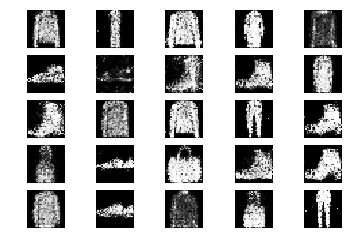

8001 [D loss: 0.603564, acc.: 70.31%] [G loss: 0.921067]
8002 [D loss: 0.684476, acc.: 53.12%] [G loss: 0.877662]
8003 [D loss: 0.659899, acc.: 67.19%] [G loss: 0.924886]
8004 [D loss: 0.642587, acc.: 57.81%] [G loss: 0.906876]
8005 [D loss: 0.609237, acc.: 68.75%] [G loss: 0.868702]
8006 [D loss: 0.644646, acc.: 60.94%] [G loss: 0.884481]
8007 [D loss: 0.649744, acc.: 65.62%] [G loss: 0.830135]
8008 [D loss: 0.668953, acc.: 57.81%] [G loss: 0.893506]
8009 [D loss: 0.625768, acc.: 64.06%] [G loss: 0.967479]
8010 [D loss: 0.697134, acc.: 64.06%] [G loss: 0.867642]
8011 [D loss: 0.665675, acc.: 53.12%] [G loss: 0.901798]
8012 [D loss: 0.713971, acc.: 53.12%] [G loss: 0.857145]
8013 [D loss: 0.640134, acc.: 64.06%] [G loss: 0.909139]
8014 [D loss: 0.690339, acc.: 53.12%] [G loss: 0.824671]
8015 [D loss: 0.679603, acc.: 68.75%] [G loss: 0.910899]
8016 [D loss: 0.639460, acc.: 64.06%] [G loss: 0.910958]
8017 [D loss: 0.671115, acc.: 59.38%] [G loss: 0.938470]
8018 [D loss: 0.635992, acc.: 7

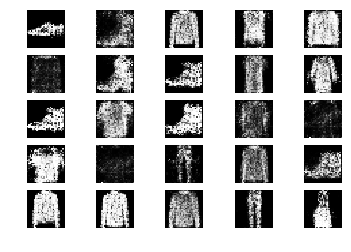

8051 [D loss: 0.644767, acc.: 62.50%] [G loss: 0.891494]
8052 [D loss: 0.665154, acc.: 56.25%] [G loss: 0.886433]
8053 [D loss: 0.613333, acc.: 62.50%] [G loss: 0.829946]
8054 [D loss: 0.658113, acc.: 56.25%] [G loss: 0.849417]
8055 [D loss: 0.622831, acc.: 59.38%] [G loss: 0.848345]
8056 [D loss: 0.723054, acc.: 54.69%] [G loss: 1.037439]
8057 [D loss: 0.669195, acc.: 60.94%] [G loss: 1.020213]
8058 [D loss: 0.576972, acc.: 67.19%] [G loss: 0.930834]
8059 [D loss: 0.611366, acc.: 70.31%] [G loss: 0.875018]
8060 [D loss: 0.662459, acc.: 53.12%] [G loss: 0.875137]
8061 [D loss: 0.659321, acc.: 56.25%] [G loss: 0.829132]
8062 [D loss: 0.650971, acc.: 60.94%] [G loss: 0.835924]
8063 [D loss: 0.679811, acc.: 53.12%] [G loss: 0.853903]
8064 [D loss: 0.626399, acc.: 68.75%] [G loss: 0.878852]
8065 [D loss: 0.636892, acc.: 64.06%] [G loss: 0.913091]
8066 [D loss: 0.605766, acc.: 65.62%] [G loss: 0.929838]
8067 [D loss: 0.664631, acc.: 60.94%] [G loss: 0.971408]
8068 [D loss: 0.715322, acc.: 5

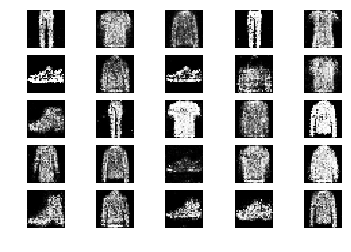

8101 [D loss: 0.699889, acc.: 50.00%] [G loss: 0.879878]
8102 [D loss: 0.620195, acc.: 62.50%] [G loss: 0.921438]
8103 [D loss: 0.617482, acc.: 62.50%] [G loss: 1.001067]
8104 [D loss: 0.621489, acc.: 64.06%] [G loss: 0.889928]
8105 [D loss: 0.640732, acc.: 64.06%] [G loss: 0.921713]
8106 [D loss: 0.615666, acc.: 70.31%] [G loss: 0.941526]
8107 [D loss: 0.654438, acc.: 62.50%] [G loss: 0.929039]
8108 [D loss: 0.621848, acc.: 70.31%] [G loss: 0.841108]
8109 [D loss: 0.721006, acc.: 46.88%] [G loss: 0.980820]
8110 [D loss: 0.645135, acc.: 64.06%] [G loss: 0.952369]
8111 [D loss: 0.609271, acc.: 73.44%] [G loss: 1.005650]
8112 [D loss: 0.664559, acc.: 56.25%] [G loss: 0.974061]
8113 [D loss: 0.660976, acc.: 59.38%] [G loss: 0.956270]
8114 [D loss: 0.632390, acc.: 71.88%] [G loss: 1.011589]
8115 [D loss: 0.670820, acc.: 54.69%] [G loss: 0.962168]
8116 [D loss: 0.591814, acc.: 68.75%] [G loss: 0.858520]
8117 [D loss: 0.671692, acc.: 60.94%] [G loss: 0.876239]
8118 [D loss: 0.588557, acc.: 7

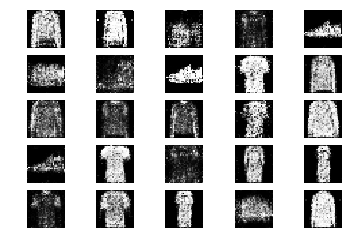

8151 [D loss: 0.688644, acc.: 64.06%] [G loss: 0.849465]
8152 [D loss: 0.734874, acc.: 43.75%] [G loss: 0.815365]
8153 [D loss: 0.659520, acc.: 56.25%] [G loss: 0.806667]
8154 [D loss: 0.704143, acc.: 53.12%] [G loss: 0.891848]
8155 [D loss: 0.639817, acc.: 68.75%] [G loss: 0.928252]
8156 [D loss: 0.658042, acc.: 60.94%] [G loss: 0.913778]
8157 [D loss: 0.656308, acc.: 67.19%] [G loss: 0.943389]
8158 [D loss: 0.615696, acc.: 64.06%] [G loss: 0.963026]
8159 [D loss: 0.664144, acc.: 64.06%] [G loss: 0.904892]
8160 [D loss: 0.711086, acc.: 48.44%] [G loss: 0.913187]
8161 [D loss: 0.645467, acc.: 57.81%] [G loss: 0.998759]
8162 [D loss: 0.615177, acc.: 75.00%] [G loss: 1.085825]
8163 [D loss: 0.661058, acc.: 53.12%] [G loss: 0.949602]
8164 [D loss: 0.570500, acc.: 78.12%] [G loss: 0.939613]
8165 [D loss: 0.672180, acc.: 54.69%] [G loss: 0.868110]
8166 [D loss: 0.576029, acc.: 70.31%] [G loss: 0.972722]
8167 [D loss: 0.683811, acc.: 57.81%] [G loss: 0.904230]
8168 [D loss: 0.684106, acc.: 5

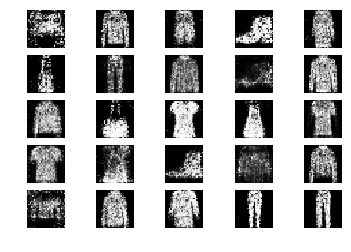

8201 [D loss: 0.677256, acc.: 56.25%] [G loss: 0.945696]
8202 [D loss: 0.675247, acc.: 53.12%] [G loss: 0.870256]
8203 [D loss: 0.627941, acc.: 59.38%] [G loss: 0.885494]
8204 [D loss: 0.656501, acc.: 56.25%] [G loss: 0.903944]
8205 [D loss: 0.687767, acc.: 60.94%] [G loss: 0.885738]
8206 [D loss: 0.671904, acc.: 53.12%] [G loss: 0.847491]
8207 [D loss: 0.667501, acc.: 62.50%] [G loss: 0.849796]
8208 [D loss: 0.601397, acc.: 71.88%] [G loss: 0.911548]
8209 [D loss: 0.663792, acc.: 53.12%] [G loss: 0.856719]
8210 [D loss: 0.684348, acc.: 54.69%] [G loss: 0.855845]
8211 [D loss: 0.594621, acc.: 70.31%] [G loss: 0.854934]
8212 [D loss: 0.644339, acc.: 62.50%] [G loss: 0.823208]
8213 [D loss: 0.653799, acc.: 60.94%] [G loss: 0.820844]
8214 [D loss: 0.651870, acc.: 59.38%] [G loss: 0.831230]
8215 [D loss: 0.673441, acc.: 60.94%] [G loss: 0.843090]
8216 [D loss: 0.634219, acc.: 65.62%] [G loss: 0.836860]
8217 [D loss: 0.630458, acc.: 62.50%] [G loss: 0.924696]
8218 [D loss: 0.629903, acc.: 6

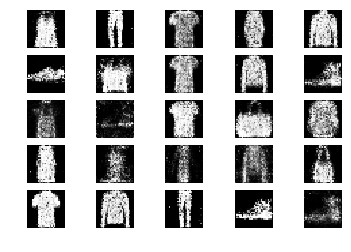

8251 [D loss: 0.683008, acc.: 54.69%] [G loss: 0.876486]
8252 [D loss: 0.665879, acc.: 60.94%] [G loss: 0.945140]
8253 [D loss: 0.612250, acc.: 65.62%] [G loss: 0.851368]
8254 [D loss: 0.652984, acc.: 57.81%] [G loss: 0.880536]
8255 [D loss: 0.675283, acc.: 64.06%] [G loss: 0.893764]
8256 [D loss: 0.675146, acc.: 53.12%] [G loss: 0.899265]
8257 [D loss: 0.589144, acc.: 71.88%] [G loss: 0.883967]
8258 [D loss: 0.629133, acc.: 59.38%] [G loss: 0.857106]
8259 [D loss: 0.599141, acc.: 71.88%] [G loss: 0.921255]
8260 [D loss: 0.619672, acc.: 62.50%] [G loss: 0.918826]
8261 [D loss: 0.626860, acc.: 64.06%] [G loss: 0.879880]
8262 [D loss: 0.598822, acc.: 68.75%] [G loss: 0.850968]
8263 [D loss: 0.667747, acc.: 57.81%] [G loss: 0.916201]
8264 [D loss: 0.583171, acc.: 71.88%] [G loss: 0.931902]
8265 [D loss: 0.694084, acc.: 48.44%] [G loss: 0.856459]
8266 [D loss: 0.664186, acc.: 51.56%] [G loss: 0.834828]
8267 [D loss: 0.769018, acc.: 53.12%] [G loss: 0.805554]
8268 [D loss: 0.642093, acc.: 6

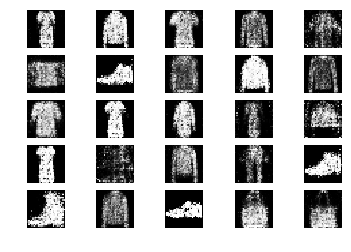

8301 [D loss: 0.684201, acc.: 59.38%] [G loss: 0.900679]
8302 [D loss: 0.646729, acc.: 68.75%] [G loss: 0.862930]
8303 [D loss: 0.609339, acc.: 70.31%] [G loss: 0.937605]
8304 [D loss: 0.652067, acc.: 60.94%] [G loss: 0.887704]
8305 [D loss: 0.710462, acc.: 51.56%] [G loss: 0.967969]
8306 [D loss: 0.650406, acc.: 57.81%] [G loss: 0.976791]
8307 [D loss: 0.665915, acc.: 57.81%] [G loss: 1.010032]
8308 [D loss: 0.656385, acc.: 65.62%] [G loss: 1.032173]
8309 [D loss: 0.684176, acc.: 53.12%] [G loss: 0.905612]
8310 [D loss: 0.609328, acc.: 64.06%] [G loss: 0.884159]
8311 [D loss: 0.642935, acc.: 60.94%] [G loss: 0.893826]
8312 [D loss: 0.612561, acc.: 67.19%] [G loss: 0.856368]
8313 [D loss: 0.673765, acc.: 62.50%] [G loss: 0.856784]
8314 [D loss: 0.695174, acc.: 54.69%] [G loss: 0.850704]
8315 [D loss: 0.685494, acc.: 57.81%] [G loss: 0.833516]
8316 [D loss: 0.682917, acc.: 53.12%] [G loss: 0.901950]
8317 [D loss: 0.672560, acc.: 59.38%] [G loss: 0.921032]
8318 [D loss: 0.598391, acc.: 6

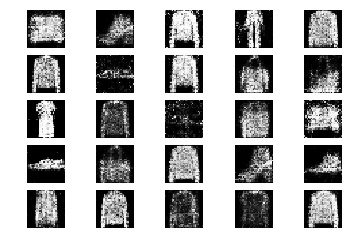

8351 [D loss: 0.645218, acc.: 59.38%] [G loss: 0.906781]
8352 [D loss: 0.731211, acc.: 50.00%] [G loss: 0.986130]
8353 [D loss: 0.675846, acc.: 64.06%] [G loss: 0.918329]
8354 [D loss: 0.669071, acc.: 62.50%] [G loss: 0.896941]
8355 [D loss: 0.624182, acc.: 59.38%] [G loss: 0.911177]
8356 [D loss: 0.623599, acc.: 68.75%] [G loss: 0.859075]
8357 [D loss: 0.605282, acc.: 67.19%] [G loss: 0.869105]
8358 [D loss: 0.690300, acc.: 59.38%] [G loss: 0.828780]
8359 [D loss: 0.639350, acc.: 65.62%] [G loss: 0.870930]
8360 [D loss: 0.603988, acc.: 68.75%] [G loss: 0.944485]
8361 [D loss: 0.641425, acc.: 67.19%] [G loss: 0.891962]
8362 [D loss: 0.632220, acc.: 62.50%] [G loss: 0.882125]
8363 [D loss: 0.619928, acc.: 62.50%] [G loss: 0.802623]
8364 [D loss: 0.643516, acc.: 64.06%] [G loss: 0.826826]
8365 [D loss: 0.653379, acc.: 65.62%] [G loss: 0.957944]
8366 [D loss: 0.641433, acc.: 60.94%] [G loss: 0.903019]
8367 [D loss: 0.662701, acc.: 59.38%] [G loss: 0.923487]
8368 [D loss: 0.649895, acc.: 6

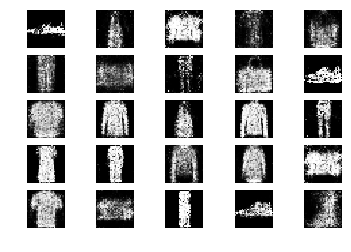

8401 [D loss: 0.609603, acc.: 60.94%] [G loss: 0.947492]
8402 [D loss: 0.688374, acc.: 50.00%] [G loss: 0.971360]
8403 [D loss: 0.674623, acc.: 53.12%] [G loss: 0.997173]
8404 [D loss: 0.719546, acc.: 50.00%] [G loss: 0.889679]
8405 [D loss: 0.617562, acc.: 59.38%] [G loss: 0.889616]
8406 [D loss: 0.678977, acc.: 51.56%] [G loss: 0.827821]
8407 [D loss: 0.610610, acc.: 62.50%] [G loss: 0.950313]
8408 [D loss: 0.619405, acc.: 73.44%] [G loss: 0.872174]
8409 [D loss: 0.628257, acc.: 62.50%] [G loss: 0.897243]
8410 [D loss: 0.658604, acc.: 62.50%] [G loss: 0.983215]
8411 [D loss: 0.700725, acc.: 53.12%] [G loss: 0.956811]
8412 [D loss: 0.650739, acc.: 57.81%] [G loss: 0.899499]
8413 [D loss: 0.601541, acc.: 71.88%] [G loss: 0.890908]
8414 [D loss: 0.614534, acc.: 68.75%] [G loss: 0.926117]
8415 [D loss: 0.624946, acc.: 64.06%] [G loss: 0.903921]
8416 [D loss: 0.667520, acc.: 64.06%] [G loss: 0.894893]
8417 [D loss: 0.662098, acc.: 57.81%] [G loss: 0.837676]
8418 [D loss: 0.655857, acc.: 5

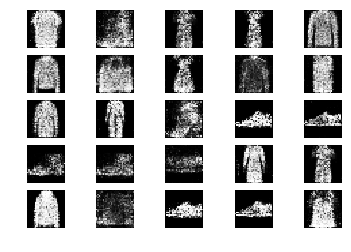

8451 [D loss: 0.668895, acc.: 62.50%] [G loss: 0.888883]
8452 [D loss: 0.620187, acc.: 73.44%] [G loss: 0.923401]
8453 [D loss: 0.666610, acc.: 53.12%] [G loss: 1.007449]
8454 [D loss: 0.622147, acc.: 62.50%] [G loss: 0.961779]
8455 [D loss: 0.634581, acc.: 67.19%] [G loss: 0.928438]
8456 [D loss: 0.678174, acc.: 57.81%] [G loss: 0.892072]
8457 [D loss: 0.598884, acc.: 59.38%] [G loss: 0.964747]
8458 [D loss: 0.680909, acc.: 50.00%] [G loss: 0.886029]
8459 [D loss: 0.653304, acc.: 62.50%] [G loss: 0.889067]
8460 [D loss: 0.618697, acc.: 68.75%] [G loss: 0.881798]
8461 [D loss: 0.665833, acc.: 59.38%] [G loss: 0.865692]
8462 [D loss: 0.682463, acc.: 59.38%] [G loss: 0.888429]
8463 [D loss: 0.669879, acc.: 60.94%] [G loss: 0.863183]
8464 [D loss: 0.633639, acc.: 68.75%] [G loss: 0.868253]
8465 [D loss: 0.630041, acc.: 62.50%] [G loss: 0.848888]
8466 [D loss: 0.680050, acc.: 53.12%] [G loss: 0.858894]
8467 [D loss: 0.678918, acc.: 56.25%] [G loss: 0.940422]
8468 [D loss: 0.617703, acc.: 6

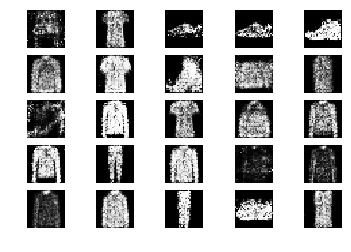

8501 [D loss: 0.619126, acc.: 68.75%] [G loss: 1.002148]
8502 [D loss: 0.675156, acc.: 57.81%] [G loss: 0.844697]
8503 [D loss: 0.639435, acc.: 60.94%] [G loss: 0.934315]
8504 [D loss: 0.603291, acc.: 68.75%] [G loss: 0.836390]
8505 [D loss: 0.680417, acc.: 53.12%] [G loss: 0.934470]
8506 [D loss: 0.650362, acc.: 65.62%] [G loss: 0.919706]
8507 [D loss: 0.688801, acc.: 53.12%] [G loss: 0.947205]
8508 [D loss: 0.578132, acc.: 71.88%] [G loss: 0.917236]
8509 [D loss: 0.651363, acc.: 62.50%] [G loss: 0.880649]
8510 [D loss: 0.660124, acc.: 57.81%] [G loss: 0.959043]
8511 [D loss: 0.617327, acc.: 60.94%] [G loss: 0.890456]
8512 [D loss: 0.697334, acc.: 56.25%] [G loss: 0.866009]
8513 [D loss: 0.632813, acc.: 59.38%] [G loss: 0.805540]
8514 [D loss: 0.657531, acc.: 57.81%] [G loss: 0.891796]
8515 [D loss: 0.691523, acc.: 54.69%] [G loss: 0.998876]
8516 [D loss: 0.607148, acc.: 70.31%] [G loss: 0.967948]
8517 [D loss: 0.723360, acc.: 46.88%] [G loss: 0.986864]
8518 [D loss: 0.644663, acc.: 6

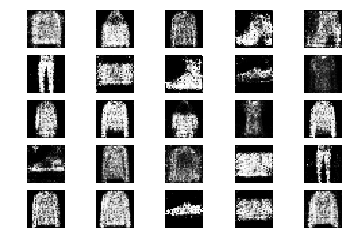

8551 [D loss: 0.665739, acc.: 59.38%] [G loss: 0.930135]
8552 [D loss: 0.653731, acc.: 65.62%] [G loss: 1.015854]
8553 [D loss: 0.657047, acc.: 59.38%] [G loss: 0.869700]
8554 [D loss: 0.621945, acc.: 68.75%] [G loss: 0.845471]
8555 [D loss: 0.617000, acc.: 62.50%] [G loss: 0.922938]
8556 [D loss: 0.606259, acc.: 67.19%] [G loss: 0.896748]
8557 [D loss: 0.738904, acc.: 51.56%] [G loss: 0.948582]
8558 [D loss: 0.683949, acc.: 59.38%] [G loss: 0.989548]
8559 [D loss: 0.702677, acc.: 51.56%] [G loss: 0.998958]
8560 [D loss: 0.662893, acc.: 59.38%] [G loss: 0.906150]
8561 [D loss: 0.651570, acc.: 70.31%] [G loss: 0.917508]
8562 [D loss: 0.684189, acc.: 59.38%] [G loss: 0.907184]
8563 [D loss: 0.774653, acc.: 43.75%] [G loss: 0.906469]
8564 [D loss: 0.664196, acc.: 54.69%] [G loss: 0.889863]
8565 [D loss: 0.629569, acc.: 60.94%] [G loss: 0.854061]
8566 [D loss: 0.667353, acc.: 59.38%] [G loss: 0.917167]
8567 [D loss: 0.645771, acc.: 62.50%] [G loss: 0.917754]
8568 [D loss: 0.597174, acc.: 7

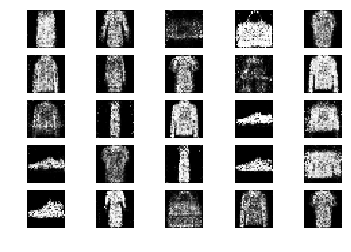

8601 [D loss: 0.701054, acc.: 50.00%] [G loss: 0.848896]
8602 [D loss: 0.638871, acc.: 57.81%] [G loss: 0.922655]
8603 [D loss: 0.684185, acc.: 56.25%] [G loss: 0.918143]
8604 [D loss: 0.678589, acc.: 64.06%] [G loss: 0.846364]
8605 [D loss: 0.693970, acc.: 54.69%] [G loss: 0.902845]
8606 [D loss: 0.619946, acc.: 65.62%] [G loss: 0.861977]
8607 [D loss: 0.665272, acc.: 60.94%] [G loss: 0.938770]
8608 [D loss: 0.640829, acc.: 59.38%] [G loss: 0.934542]
8609 [D loss: 0.666856, acc.: 53.12%] [G loss: 1.016705]
8610 [D loss: 0.637636, acc.: 70.31%] [G loss: 0.947863]
8611 [D loss: 0.606597, acc.: 73.44%] [G loss: 0.989376]
8612 [D loss: 0.639580, acc.: 68.75%] [G loss: 0.958580]
8613 [D loss: 0.608976, acc.: 67.19%] [G loss: 1.018660]
8614 [D loss: 0.638925, acc.: 62.50%] [G loss: 0.927655]
8615 [D loss: 0.660582, acc.: 64.06%] [G loss: 0.908923]
8616 [D loss: 0.580874, acc.: 67.19%] [G loss: 0.955774]
8617 [D loss: 0.709118, acc.: 53.12%] [G loss: 0.834702]
8618 [D loss: 0.639682, acc.: 6

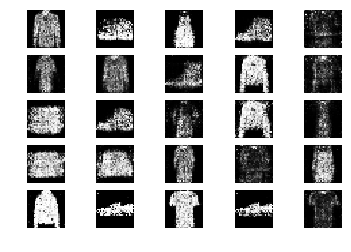

8651 [D loss: 0.627312, acc.: 65.62%] [G loss: 0.822731]
8652 [D loss: 0.586570, acc.: 70.31%] [G loss: 0.947139]
8653 [D loss: 0.673259, acc.: 56.25%] [G loss: 0.883210]
8654 [D loss: 0.667238, acc.: 60.94%] [G loss: 0.895506]
8655 [D loss: 0.634650, acc.: 64.06%] [G loss: 0.885211]
8656 [D loss: 0.713566, acc.: 51.56%] [G loss: 0.860576]
8657 [D loss: 0.666253, acc.: 56.25%] [G loss: 0.805302]
8658 [D loss: 0.698578, acc.: 53.12%] [G loss: 0.868802]
8659 [D loss: 0.642552, acc.: 64.06%] [G loss: 0.867414]
8660 [D loss: 0.613747, acc.: 67.19%] [G loss: 0.897981]
8661 [D loss: 0.655894, acc.: 59.38%] [G loss: 0.893242]
8662 [D loss: 0.686149, acc.: 60.94%] [G loss: 0.901261]
8663 [D loss: 0.646107, acc.: 64.06%] [G loss: 0.803480]
8664 [D loss: 0.629258, acc.: 65.62%] [G loss: 0.837698]
8665 [D loss: 0.634923, acc.: 62.50%] [G loss: 0.903163]
8666 [D loss: 0.692077, acc.: 50.00%] [G loss: 0.822785]
8667 [D loss: 0.672551, acc.: 59.38%] [G loss: 0.924237]
8668 [D loss: 0.606233, acc.: 6

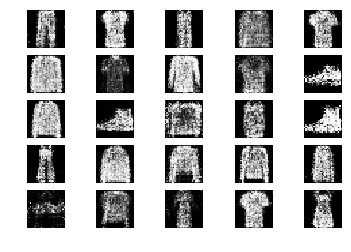

8701 [D loss: 0.605339, acc.: 64.06%] [G loss: 0.958611]
8702 [D loss: 0.684499, acc.: 57.81%] [G loss: 0.927779]
8703 [D loss: 0.652514, acc.: 64.06%] [G loss: 0.855926]
8704 [D loss: 0.668381, acc.: 64.06%] [G loss: 0.921846]
8705 [D loss: 0.612918, acc.: 64.06%] [G loss: 0.921182]
8706 [D loss: 0.656769, acc.: 62.50%] [G loss: 0.935210]
8707 [D loss: 0.620035, acc.: 67.19%] [G loss: 0.914130]
8708 [D loss: 0.631976, acc.: 64.06%] [G loss: 0.863712]
8709 [D loss: 0.648094, acc.: 60.94%] [G loss: 0.886612]
8710 [D loss: 0.547390, acc.: 78.12%] [G loss: 0.851067]
8711 [D loss: 0.710751, acc.: 46.88%] [G loss: 0.811106]
8712 [D loss: 0.712423, acc.: 50.00%] [G loss: 0.881901]
8713 [D loss: 0.647291, acc.: 62.50%] [G loss: 0.901517]
8714 [D loss: 0.610806, acc.: 70.31%] [G loss: 0.958047]
8715 [D loss: 0.662831, acc.: 62.50%] [G loss: 0.994024]
8716 [D loss: 0.692310, acc.: 54.69%] [G loss: 0.914977]
8717 [D loss: 0.665417, acc.: 57.81%] [G loss: 0.974449]
8718 [D loss: 0.680683, acc.: 6

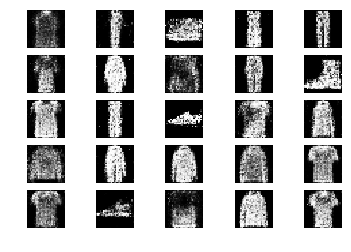

8751 [D loss: 0.668885, acc.: 56.25%] [G loss: 0.898721]
8752 [D loss: 0.670834, acc.: 68.75%] [G loss: 0.933998]
8753 [D loss: 0.663888, acc.: 64.06%] [G loss: 0.874220]
8754 [D loss: 0.594313, acc.: 71.88%] [G loss: 0.957871]
8755 [D loss: 0.624900, acc.: 62.50%] [G loss: 0.940797]
8756 [D loss: 0.682786, acc.: 57.81%] [G loss: 0.936215]
8757 [D loss: 0.676012, acc.: 56.25%] [G loss: 0.900016]
8758 [D loss: 0.648623, acc.: 54.69%] [G loss: 0.912927]
8759 [D loss: 0.630231, acc.: 64.06%] [G loss: 0.884732]
8760 [D loss: 0.638082, acc.: 68.75%] [G loss: 0.897966]
8761 [D loss: 0.651761, acc.: 65.62%] [G loss: 0.806472]
8762 [D loss: 0.687325, acc.: 57.81%] [G loss: 0.881881]
8763 [D loss: 0.676824, acc.: 60.94%] [G loss: 0.940551]
8764 [D loss: 0.692793, acc.: 64.06%] [G loss: 0.888460]
8765 [D loss: 0.675183, acc.: 59.38%] [G loss: 0.898047]
8766 [D loss: 0.662002, acc.: 65.62%] [G loss: 0.861498]
8767 [D loss: 0.649291, acc.: 56.25%] [G loss: 0.872646]
8768 [D loss: 0.671832, acc.: 6

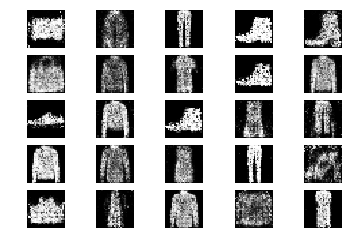

8801 [D loss: 0.626073, acc.: 62.50%] [G loss: 0.832635]
8802 [D loss: 0.656307, acc.: 64.06%] [G loss: 0.860808]
8803 [D loss: 0.748755, acc.: 53.12%] [G loss: 0.931401]
8804 [D loss: 0.641882, acc.: 64.06%] [G loss: 0.906842]
8805 [D loss: 0.636996, acc.: 62.50%] [G loss: 0.857658]
8806 [D loss: 0.631379, acc.: 64.06%] [G loss: 0.847757]
8807 [D loss: 0.656582, acc.: 54.69%] [G loss: 0.893396]
8808 [D loss: 0.716421, acc.: 54.69%] [G loss: 0.899644]
8809 [D loss: 0.668855, acc.: 59.38%] [G loss: 0.967097]
8810 [D loss: 0.636486, acc.: 60.94%] [G loss: 0.959145]
8811 [D loss: 0.661252, acc.: 65.62%] [G loss: 0.924281]
8812 [D loss: 0.699587, acc.: 56.25%] [G loss: 0.837695]
8813 [D loss: 0.667181, acc.: 57.81%] [G loss: 0.909425]
8814 [D loss: 0.685934, acc.: 57.81%] [G loss: 0.867271]
8815 [D loss: 0.664385, acc.: 59.38%] [G loss: 0.900389]
8816 [D loss: 0.567999, acc.: 68.75%] [G loss: 0.923636]
8817 [D loss: 0.644752, acc.: 67.19%] [G loss: 0.921298]
8818 [D loss: 0.657394, acc.: 6

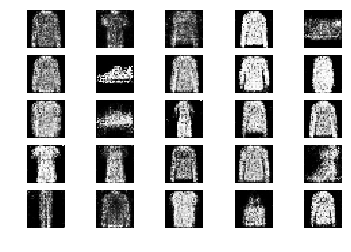

8851 [D loss: 0.650646, acc.: 65.62%] [G loss: 0.887134]
8852 [D loss: 0.636627, acc.: 65.62%] [G loss: 0.898154]
8853 [D loss: 0.612653, acc.: 64.06%] [G loss: 0.874113]
8854 [D loss: 0.684248, acc.: 57.81%] [G loss: 0.886666]
8855 [D loss: 0.581963, acc.: 70.31%] [G loss: 0.902032]
8856 [D loss: 0.634652, acc.: 64.06%] [G loss: 0.847517]
8857 [D loss: 0.795283, acc.: 48.44%] [G loss: 0.878863]
8858 [D loss: 0.630141, acc.: 67.19%] [G loss: 0.873743]
8859 [D loss: 0.642353, acc.: 60.94%] [G loss: 1.033581]
8860 [D loss: 0.691784, acc.: 59.38%] [G loss: 0.897818]
8861 [D loss: 0.728436, acc.: 50.00%] [G loss: 0.872123]
8862 [D loss: 0.665478, acc.: 57.81%] [G loss: 0.890120]
8863 [D loss: 0.637173, acc.: 64.06%] [G loss: 0.875571]
8864 [D loss: 0.669807, acc.: 56.25%] [G loss: 0.886386]
8865 [D loss: 0.650391, acc.: 56.25%] [G loss: 0.782299]
8866 [D loss: 0.583529, acc.: 73.44%] [G loss: 0.851451]
8867 [D loss: 0.709951, acc.: 59.38%] [G loss: 0.893961]
8868 [D loss: 0.620267, acc.: 6

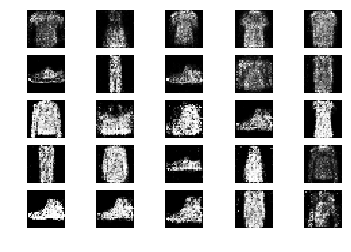

8901 [D loss: 0.730129, acc.: 45.31%] [G loss: 0.880435]
8902 [D loss: 0.634913, acc.: 65.62%] [G loss: 0.911233]
8903 [D loss: 0.660731, acc.: 59.38%] [G loss: 0.878924]
8904 [D loss: 0.633854, acc.: 64.06%] [G loss: 0.866746]
8905 [D loss: 0.715117, acc.: 45.31%] [G loss: 0.749233]
8906 [D loss: 0.634863, acc.: 60.94%] [G loss: 0.833145]
8907 [D loss: 0.702581, acc.: 53.12%] [G loss: 0.871789]
8908 [D loss: 0.625624, acc.: 59.38%] [G loss: 0.842480]
8909 [D loss: 0.611242, acc.: 60.94%] [G loss: 0.847009]
8910 [D loss: 0.652017, acc.: 59.38%] [G loss: 0.897545]
8911 [D loss: 0.654815, acc.: 67.19%] [G loss: 0.910473]
8912 [D loss: 0.648936, acc.: 56.25%] [G loss: 1.016454]
8913 [D loss: 0.637613, acc.: 67.19%] [G loss: 0.910883]
8914 [D loss: 0.630421, acc.: 67.19%] [G loss: 0.851992]
8915 [D loss: 0.624640, acc.: 65.62%] [G loss: 0.797223]
8916 [D loss: 0.606354, acc.: 64.06%] [G loss: 0.910628]
8917 [D loss: 0.615701, acc.: 67.19%] [G loss: 0.803482]
8918 [D loss: 0.639269, acc.: 5

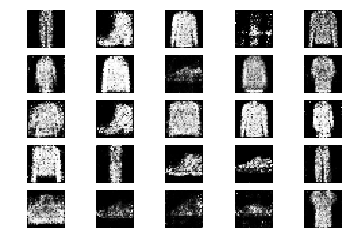

8951 [D loss: 0.720683, acc.: 53.12%] [G loss: 0.809609]
8952 [D loss: 0.710294, acc.: 50.00%] [G loss: 0.920201]
8953 [D loss: 0.625002, acc.: 65.62%] [G loss: 0.809320]
8954 [D loss: 0.629652, acc.: 54.69%] [G loss: 0.887882]
8955 [D loss: 0.681937, acc.: 59.38%] [G loss: 0.929007]
8956 [D loss: 0.675746, acc.: 54.69%] [G loss: 0.905296]
8957 [D loss: 0.622455, acc.: 64.06%] [G loss: 0.914381]
8958 [D loss: 0.649580, acc.: 60.94%] [G loss: 0.850281]
8959 [D loss: 0.685533, acc.: 53.12%] [G loss: 0.926178]
8960 [D loss: 0.658762, acc.: 62.50%] [G loss: 0.919550]
8961 [D loss: 0.657706, acc.: 59.38%] [G loss: 0.815427]
8962 [D loss: 0.627732, acc.: 68.75%] [G loss: 0.950343]
8963 [D loss: 0.702837, acc.: 57.81%] [G loss: 0.953930]
8964 [D loss: 0.667831, acc.: 51.56%] [G loss: 0.908568]
8965 [D loss: 0.641515, acc.: 62.50%] [G loss: 0.933374]
8966 [D loss: 0.663844, acc.: 62.50%] [G loss: 0.888531]
8967 [D loss: 0.594473, acc.: 76.56%] [G loss: 0.850205]
8968 [D loss: 0.689308, acc.: 5

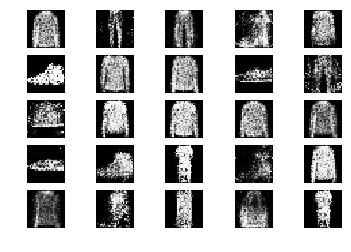

9001 [D loss: 0.652956, acc.: 62.50%] [G loss: 0.930405]
9002 [D loss: 0.630227, acc.: 64.06%] [G loss: 0.899048]
9003 [D loss: 0.628593, acc.: 67.19%] [G loss: 0.928751]
9004 [D loss: 0.705234, acc.: 57.81%] [G loss: 0.876199]
9005 [D loss: 0.607677, acc.: 65.62%] [G loss: 0.941469]
9006 [D loss: 0.632249, acc.: 64.06%] [G loss: 0.909026]
9007 [D loss: 0.651377, acc.: 60.94%] [G loss: 0.892121]
9008 [D loss: 0.695896, acc.: 57.81%] [G loss: 0.880500]
9009 [D loss: 0.669638, acc.: 54.69%] [G loss: 0.912714]
9010 [D loss: 0.675866, acc.: 57.81%] [G loss: 0.910761]
9011 [D loss: 0.628846, acc.: 62.50%] [G loss: 0.959156]
9012 [D loss: 0.624564, acc.: 68.75%] [G loss: 1.035059]
9013 [D loss: 0.627005, acc.: 64.06%] [G loss: 0.980379]
9014 [D loss: 0.666761, acc.: 59.38%] [G loss: 0.911403]
9015 [D loss: 0.706430, acc.: 56.25%] [G loss: 0.883132]
9016 [D loss: 0.672207, acc.: 62.50%] [G loss: 0.961725]
9017 [D loss: 0.620360, acc.: 65.62%] [G loss: 0.859206]
9018 [D loss: 0.714371, acc.: 5

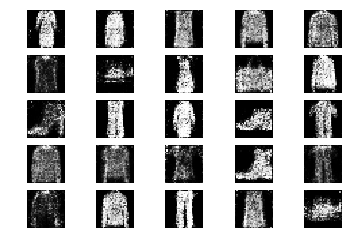

9051 [D loss: 0.635164, acc.: 60.94%] [G loss: 0.871481]
9052 [D loss: 0.664352, acc.: 60.94%] [G loss: 0.834597]
9053 [D loss: 0.694467, acc.: 50.00%] [G loss: 0.890451]
9054 [D loss: 0.636194, acc.: 64.06%] [G loss: 0.841796]
9055 [D loss: 0.678376, acc.: 62.50%] [G loss: 0.910865]
9056 [D loss: 0.624670, acc.: 65.62%] [G loss: 0.906960]
9057 [D loss: 0.644216, acc.: 64.06%] [G loss: 0.913807]
9058 [D loss: 0.599955, acc.: 71.88%] [G loss: 0.929045]
9059 [D loss: 0.600670, acc.: 68.75%] [G loss: 0.930192]
9060 [D loss: 0.641137, acc.: 60.94%] [G loss: 0.969254]
9061 [D loss: 0.626841, acc.: 62.50%] [G loss: 0.918473]
9062 [D loss: 0.656786, acc.: 62.50%] [G loss: 0.870809]
9063 [D loss: 0.656927, acc.: 59.38%] [G loss: 0.848941]
9064 [D loss: 0.593656, acc.: 71.88%] [G loss: 0.872586]
9065 [D loss: 0.649120, acc.: 64.06%] [G loss: 0.808486]
9066 [D loss: 0.684434, acc.: 53.12%] [G loss: 0.894218]
9067 [D loss: 0.702824, acc.: 57.81%] [G loss: 0.776148]
9068 [D loss: 0.727867, acc.: 5

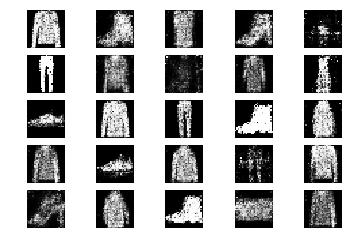

9101 [D loss: 0.655842, acc.: 56.25%] [G loss: 0.979412]
9102 [D loss: 0.610391, acc.: 71.88%] [G loss: 0.872923]
9103 [D loss: 0.743770, acc.: 56.25%] [G loss: 0.811035]
9104 [D loss: 0.702414, acc.: 50.00%] [G loss: 0.873116]
9105 [D loss: 0.640534, acc.: 65.62%] [G loss: 0.851575]
9106 [D loss: 0.633829, acc.: 65.62%] [G loss: 0.849083]
9107 [D loss: 0.634106, acc.: 54.69%] [G loss: 0.892286]
9108 [D loss: 0.711866, acc.: 43.75%] [G loss: 0.855497]
9109 [D loss: 0.666423, acc.: 59.38%] [G loss: 0.938187]
9110 [D loss: 0.698551, acc.: 54.69%] [G loss: 0.961927]
9111 [D loss: 0.629446, acc.: 64.06%] [G loss: 0.908275]
9112 [D loss: 0.643207, acc.: 64.06%] [G loss: 0.918825]
9113 [D loss: 0.641789, acc.: 60.94%] [G loss: 0.897112]
9114 [D loss: 0.707310, acc.: 51.56%] [G loss: 0.909963]
9115 [D loss: 0.648031, acc.: 56.25%] [G loss: 0.856849]
9116 [D loss: 0.703400, acc.: 60.94%] [G loss: 0.844290]
9117 [D loss: 0.629595, acc.: 75.00%] [G loss: 0.799018]
9118 [D loss: 0.644033, acc.: 5

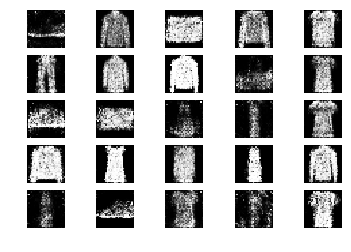

9151 [D loss: 0.651810, acc.: 57.81%] [G loss: 0.849539]
9152 [D loss: 0.630874, acc.: 70.31%] [G loss: 0.932321]
9153 [D loss: 0.651547, acc.: 60.94%] [G loss: 1.034285]
9154 [D loss: 0.696545, acc.: 56.25%] [G loss: 0.858042]
9155 [D loss: 0.681370, acc.: 59.38%] [G loss: 0.959918]
9156 [D loss: 0.647868, acc.: 62.50%] [G loss: 0.845715]
9157 [D loss: 0.692652, acc.: 54.69%] [G loss: 0.875129]
9158 [D loss: 0.553497, acc.: 82.81%] [G loss: 0.880633]
9159 [D loss: 0.629261, acc.: 59.38%] [G loss: 0.938607]
9160 [D loss: 0.656071, acc.: 57.81%] [G loss: 1.089713]
9161 [D loss: 0.636269, acc.: 65.62%] [G loss: 1.007740]
9162 [D loss: 0.614973, acc.: 62.50%] [G loss: 0.934545]
9163 [D loss: 0.663707, acc.: 67.19%] [G loss: 0.923912]
9164 [D loss: 0.585962, acc.: 73.44%] [G loss: 0.889701]
9165 [D loss: 0.641113, acc.: 59.38%] [G loss: 0.928260]
9166 [D loss: 0.637367, acc.: 67.19%] [G loss: 0.933445]
9167 [D loss: 0.648565, acc.: 65.62%] [G loss: 0.755484]
9168 [D loss: 0.652982, acc.: 6

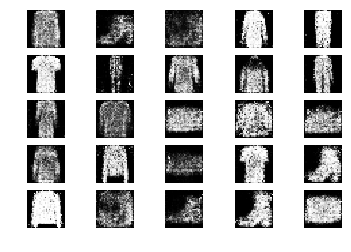

9201 [D loss: 0.597167, acc.: 71.88%] [G loss: 0.909225]
9202 [D loss: 0.603675, acc.: 62.50%] [G loss: 0.952519]
9203 [D loss: 0.612730, acc.: 64.06%] [G loss: 0.870681]
9204 [D loss: 0.623566, acc.: 64.06%] [G loss: 0.832834]
9205 [D loss: 0.632451, acc.: 60.94%] [G loss: 0.888326]
9206 [D loss: 0.719296, acc.: 53.12%] [G loss: 0.890772]
9207 [D loss: 0.664934, acc.: 57.81%] [G loss: 0.816964]
9208 [D loss: 0.658253, acc.: 59.38%] [G loss: 0.864589]
9209 [D loss: 0.653477, acc.: 65.62%] [G loss: 0.945545]
9210 [D loss: 0.572022, acc.: 67.19%] [G loss: 0.854837]
9211 [D loss: 0.686041, acc.: 54.69%] [G loss: 0.968210]
9212 [D loss: 0.664182, acc.: 60.94%] [G loss: 0.897388]
9213 [D loss: 0.616825, acc.: 68.75%] [G loss: 0.911270]
9214 [D loss: 0.695184, acc.: 56.25%] [G loss: 0.914799]
9215 [D loss: 0.680791, acc.: 57.81%] [G loss: 0.871548]
9216 [D loss: 0.701944, acc.: 56.25%] [G loss: 0.887911]
9217 [D loss: 0.638736, acc.: 68.75%] [G loss: 0.905334]
9218 [D loss: 0.590137, acc.: 7

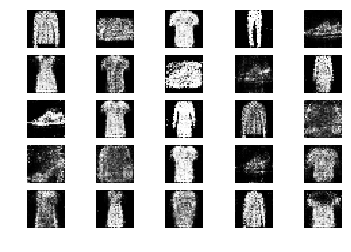

9251 [D loss: 0.649762, acc.: 67.19%] [G loss: 0.944682]
9252 [D loss: 0.667546, acc.: 56.25%] [G loss: 0.877796]
9253 [D loss: 0.570541, acc.: 68.75%] [G loss: 0.974554]
9254 [D loss: 0.681545, acc.: 53.12%] [G loss: 0.931587]
9255 [D loss: 0.666247, acc.: 64.06%] [G loss: 0.862057]
9256 [D loss: 0.568119, acc.: 75.00%] [G loss: 0.818091]
9257 [D loss: 0.710691, acc.: 62.50%] [G loss: 0.915608]
9258 [D loss: 0.575136, acc.: 70.31%] [G loss: 0.951630]
9259 [D loss: 0.645078, acc.: 56.25%] [G loss: 0.849214]
9260 [D loss: 0.627870, acc.: 67.19%] [G loss: 0.893706]
9261 [D loss: 0.642618, acc.: 59.38%] [G loss: 0.793186]
9262 [D loss: 0.670849, acc.: 57.81%] [G loss: 0.850370]
9263 [D loss: 0.691690, acc.: 53.12%] [G loss: 0.866959]
9264 [D loss: 0.632323, acc.: 67.19%] [G loss: 0.944873]
9265 [D loss: 0.674200, acc.: 57.81%] [G loss: 0.968824]
9266 [D loss: 0.707405, acc.: 51.56%] [G loss: 0.915436]
9267 [D loss: 0.612056, acc.: 68.75%] [G loss: 0.876790]
9268 [D loss: 0.650686, acc.: 5

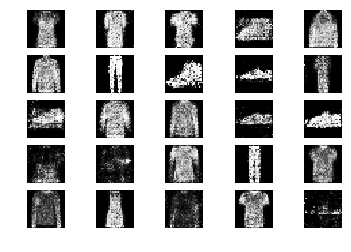

9301 [D loss: 0.652841, acc.: 59.38%] [G loss: 0.860860]
9302 [D loss: 0.634139, acc.: 65.62%] [G loss: 0.851283]
9303 [D loss: 0.651877, acc.: 62.50%] [G loss: 0.792147]
9304 [D loss: 0.621049, acc.: 59.38%] [G loss: 0.850928]
9305 [D loss: 0.625040, acc.: 64.06%] [G loss: 0.867095]
9306 [D loss: 0.679948, acc.: 56.25%] [G loss: 0.854395]
9307 [D loss: 0.662124, acc.: 62.50%] [G loss: 0.838734]
9308 [D loss: 0.729234, acc.: 54.69%] [G loss: 0.840875]
9309 [D loss: 0.659651, acc.: 68.75%] [G loss: 0.918925]
9310 [D loss: 0.635667, acc.: 62.50%] [G loss: 0.859307]
9311 [D loss: 0.665640, acc.: 57.81%] [G loss: 0.918873]
9312 [D loss: 0.617296, acc.: 75.00%] [G loss: 0.909747]
9313 [D loss: 0.711827, acc.: 53.12%] [G loss: 0.843747]
9314 [D loss: 0.699629, acc.: 51.56%] [G loss: 0.915531]
9315 [D loss: 0.638919, acc.: 70.31%] [G loss: 0.932620]
9316 [D loss: 0.607926, acc.: 68.75%] [G loss: 0.941678]
9317 [D loss: 0.647067, acc.: 68.75%] [G loss: 0.981200]
9318 [D loss: 0.728368, acc.: 5

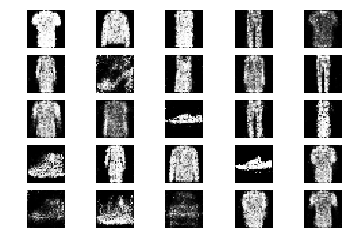

9351 [D loss: 0.622319, acc.: 67.19%] [G loss: 0.980403]
9352 [D loss: 0.669243, acc.: 68.75%] [G loss: 0.977046]
9353 [D loss: 0.611550, acc.: 60.94%] [G loss: 0.920177]
9354 [D loss: 0.637235, acc.: 60.94%] [G loss: 0.933426]
9355 [D loss: 0.613273, acc.: 65.62%] [G loss: 0.929249]
9356 [D loss: 0.623221, acc.: 65.62%] [G loss: 0.867299]
9357 [D loss: 0.661580, acc.: 60.94%] [G loss: 0.884656]
9358 [D loss: 0.706278, acc.: 57.81%] [G loss: 0.915559]
9359 [D loss: 0.686264, acc.: 60.94%] [G loss: 0.849717]
9360 [D loss: 0.640038, acc.: 62.50%] [G loss: 0.907128]
9361 [D loss: 0.625559, acc.: 62.50%] [G loss: 0.924766]
9362 [D loss: 0.635411, acc.: 60.94%] [G loss: 0.909047]
9363 [D loss: 0.676646, acc.: 54.69%] [G loss: 0.841761]
9364 [D loss: 0.610190, acc.: 62.50%] [G loss: 0.919018]
9365 [D loss: 0.649556, acc.: 64.06%] [G loss: 0.914107]
9366 [D loss: 0.657906, acc.: 59.38%] [G loss: 0.955568]
9367 [D loss: 0.584767, acc.: 71.88%] [G loss: 0.962122]
9368 [D loss: 0.710585, acc.: 5

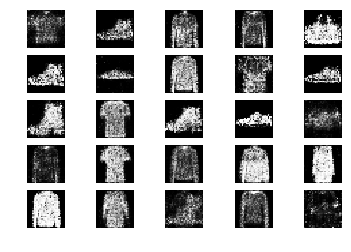

9401 [D loss: 0.629218, acc.: 71.88%] [G loss: 0.856131]
9402 [D loss: 0.685307, acc.: 59.38%] [G loss: 0.932628]
9403 [D loss: 0.595319, acc.: 70.31%] [G loss: 0.902257]
9404 [D loss: 0.701328, acc.: 51.56%] [G loss: 0.986528]
9405 [D loss: 0.705592, acc.: 62.50%] [G loss: 0.930801]
9406 [D loss: 0.629988, acc.: 59.38%] [G loss: 0.935082]
9407 [D loss: 0.673523, acc.: 57.81%] [G loss: 0.956785]
9408 [D loss: 0.694267, acc.: 57.81%] [G loss: 0.982930]
9409 [D loss: 0.710371, acc.: 45.31%] [G loss: 0.950340]
9410 [D loss: 0.686492, acc.: 54.69%] [G loss: 0.852160]
9411 [D loss: 0.692585, acc.: 51.56%] [G loss: 0.889048]
9412 [D loss: 0.651602, acc.: 60.94%] [G loss: 0.845245]
9413 [D loss: 0.628803, acc.: 62.50%] [G loss: 0.857862]
9414 [D loss: 0.582349, acc.: 79.69%] [G loss: 0.867825]
9415 [D loss: 0.646985, acc.: 59.38%] [G loss: 0.873536]
9416 [D loss: 0.764221, acc.: 45.31%] [G loss: 0.797946]
9417 [D loss: 0.634781, acc.: 65.62%] [G loss: 0.854023]
9418 [D loss: 0.637565, acc.: 6

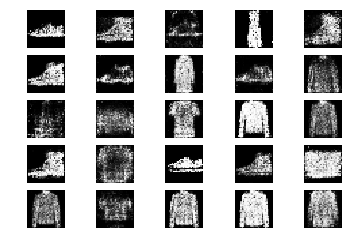

9451 [D loss: 0.692139, acc.: 60.94%] [G loss: 0.945080]
9452 [D loss: 0.654334, acc.: 56.25%] [G loss: 0.859496]
9453 [D loss: 0.722579, acc.: 50.00%] [G loss: 0.821295]
9454 [D loss: 0.673410, acc.: 57.81%] [G loss: 0.898907]
9455 [D loss: 0.653539, acc.: 62.50%] [G loss: 0.860801]
9456 [D loss: 0.677705, acc.: 65.62%] [G loss: 0.859870]
9457 [D loss: 0.658674, acc.: 54.69%] [G loss: 0.865594]
9458 [D loss: 0.629077, acc.: 62.50%] [G loss: 0.913534]
9459 [D loss: 0.628834, acc.: 62.50%] [G loss: 0.841941]
9460 [D loss: 0.596640, acc.: 68.75%] [G loss: 0.919794]
9461 [D loss: 0.661222, acc.: 60.94%] [G loss: 0.958506]
9462 [D loss: 0.692449, acc.: 59.38%] [G loss: 0.979566]
9463 [D loss: 0.655579, acc.: 62.50%] [G loss: 0.950671]
9464 [D loss: 0.671397, acc.: 54.69%] [G loss: 0.873755]
9465 [D loss: 0.654797, acc.: 62.50%] [G loss: 0.954512]
9466 [D loss: 0.672977, acc.: 60.94%] [G loss: 0.875193]
9467 [D loss: 0.660189, acc.: 56.25%] [G loss: 0.899912]
9468 [D loss: 0.657739, acc.: 5

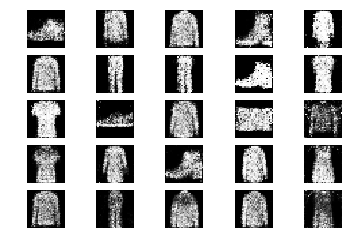

9501 [D loss: 0.631524, acc.: 60.94%] [G loss: 0.977008]
9502 [D loss: 0.687141, acc.: 56.25%] [G loss: 0.936998]
9503 [D loss: 0.706342, acc.: 51.56%] [G loss: 1.003366]
9504 [D loss: 0.673893, acc.: 67.19%] [G loss: 0.911518]
9505 [D loss: 0.652817, acc.: 64.06%] [G loss: 0.903463]
9506 [D loss: 0.723948, acc.: 51.56%] [G loss: 0.861521]
9507 [D loss: 0.655166, acc.: 51.56%] [G loss: 0.909706]
9508 [D loss: 0.618644, acc.: 62.50%] [G loss: 1.074154]
9509 [D loss: 0.692924, acc.: 56.25%] [G loss: 1.053330]
9510 [D loss: 0.742430, acc.: 53.12%] [G loss: 0.882549]
9511 [D loss: 0.644448, acc.: 64.06%] [G loss: 0.890583]
9512 [D loss: 0.625511, acc.: 68.75%] [G loss: 0.780334]
9513 [D loss: 0.711694, acc.: 53.12%] [G loss: 0.902010]
9514 [D loss: 0.762562, acc.: 42.19%] [G loss: 0.908208]
9515 [D loss: 0.671713, acc.: 64.06%] [G loss: 0.994830]
9516 [D loss: 0.598606, acc.: 68.75%] [G loss: 0.957002]
9517 [D loss: 0.644180, acc.: 65.62%] [G loss: 0.878575]
9518 [D loss: 0.692113, acc.: 5

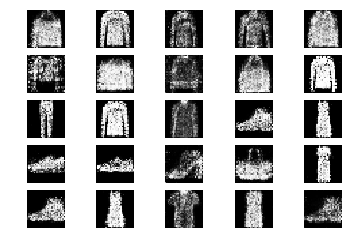

9551 [D loss: 0.667005, acc.: 59.38%] [G loss: 0.963490]
9552 [D loss: 0.709623, acc.: 48.44%] [G loss: 0.857224]
9553 [D loss: 0.749598, acc.: 48.44%] [G loss: 0.876886]
9554 [D loss: 0.683789, acc.: 54.69%] [G loss: 0.864129]
9555 [D loss: 0.653348, acc.: 60.94%] [G loss: 0.884185]
9556 [D loss: 0.667613, acc.: 59.38%] [G loss: 0.869247]
9557 [D loss: 0.703657, acc.: 51.56%] [G loss: 0.919653]
9558 [D loss: 0.643937, acc.: 65.62%] [G loss: 0.898977]
9559 [D loss: 0.633445, acc.: 70.31%] [G loss: 0.887729]
9560 [D loss: 0.627134, acc.: 67.19%] [G loss: 1.012810]
9561 [D loss: 0.636975, acc.: 57.81%] [G loss: 0.894708]
9562 [D loss: 0.645106, acc.: 65.62%] [G loss: 0.838245]
9563 [D loss: 0.686128, acc.: 57.81%] [G loss: 0.943667]
9564 [D loss: 0.716734, acc.: 43.75%] [G loss: 0.931233]
9565 [D loss: 0.590889, acc.: 70.31%] [G loss: 0.873793]
9566 [D loss: 0.643903, acc.: 60.94%] [G loss: 0.899035]
9567 [D loss: 0.663185, acc.: 57.81%] [G loss: 0.846604]
9568 [D loss: 0.675109, acc.: 6

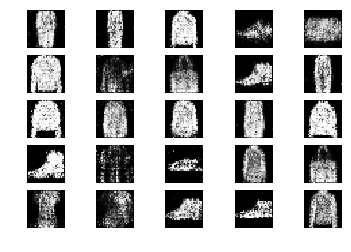

9601 [D loss: 0.673891, acc.: 59.38%] [G loss: 0.881137]
9602 [D loss: 0.670113, acc.: 60.94%] [G loss: 0.936193]
9603 [D loss: 0.689341, acc.: 59.38%] [G loss: 0.884132]
9604 [D loss: 0.604999, acc.: 64.06%] [G loss: 0.881886]
9605 [D loss: 0.633130, acc.: 62.50%] [G loss: 0.945744]
9606 [D loss: 0.733168, acc.: 57.81%] [G loss: 0.910342]
9607 [D loss: 0.581983, acc.: 71.88%] [G loss: 0.954507]
9608 [D loss: 0.599276, acc.: 73.44%] [G loss: 0.923833]
9609 [D loss: 0.590444, acc.: 60.94%] [G loss: 1.008810]
9610 [D loss: 0.605872, acc.: 64.06%] [G loss: 0.880090]
9611 [D loss: 0.753374, acc.: 48.44%] [G loss: 0.943729]
9612 [D loss: 0.629998, acc.: 65.62%] [G loss: 0.921556]
9613 [D loss: 0.676915, acc.: 59.38%] [G loss: 0.908259]
9614 [D loss: 0.698317, acc.: 53.12%] [G loss: 0.939386]
9615 [D loss: 0.694002, acc.: 54.69%] [G loss: 0.939067]
9616 [D loss: 0.600398, acc.: 71.88%] [G loss: 0.968081]
9617 [D loss: 0.616284, acc.: 65.62%] [G loss: 0.922997]
9618 [D loss: 0.715473, acc.: 5

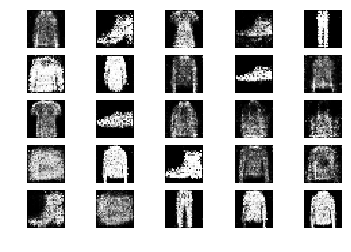

9651 [D loss: 0.619035, acc.: 67.19%] [G loss: 0.862148]
9652 [D loss: 0.631766, acc.: 68.75%] [G loss: 0.889872]
9653 [D loss: 0.686176, acc.: 56.25%] [G loss: 0.966664]
9654 [D loss: 0.647447, acc.: 60.94%] [G loss: 0.988373]
9655 [D loss: 0.663442, acc.: 65.62%] [G loss: 0.888668]
9656 [D loss: 0.592378, acc.: 71.88%] [G loss: 0.957275]
9657 [D loss: 0.602598, acc.: 71.88%] [G loss: 0.944454]
9658 [D loss: 0.676726, acc.: 60.94%] [G loss: 0.948878]
9659 [D loss: 0.635582, acc.: 59.38%] [G loss: 0.922897]
9660 [D loss: 0.690864, acc.: 46.88%] [G loss: 0.891891]
9661 [D loss: 0.629849, acc.: 68.75%] [G loss: 0.961469]
9662 [D loss: 0.608811, acc.: 70.31%] [G loss: 0.898416]
9663 [D loss: 0.621737, acc.: 67.19%] [G loss: 0.805160]
9664 [D loss: 0.686576, acc.: 57.81%] [G loss: 0.934250]
9665 [D loss: 0.664398, acc.: 60.94%] [G loss: 0.781965]
9666 [D loss: 0.696794, acc.: 51.56%] [G loss: 0.907747]
9667 [D loss: 0.655393, acc.: 60.94%] [G loss: 0.836975]
9668 [D loss: 0.635905, acc.: 5

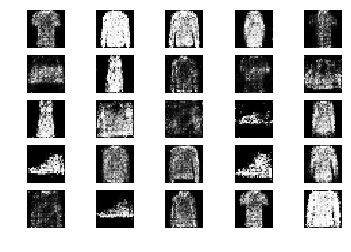

9701 [D loss: 0.678460, acc.: 56.25%] [G loss: 0.868436]
9702 [D loss: 0.658412, acc.: 67.19%] [G loss: 0.841593]
9703 [D loss: 0.616513, acc.: 64.06%] [G loss: 1.001329]
9704 [D loss: 0.669027, acc.: 57.81%] [G loss: 0.914638]
9705 [D loss: 0.654818, acc.: 60.94%] [G loss: 0.897022]
9706 [D loss: 0.660493, acc.: 57.81%] [G loss: 0.902639]
9707 [D loss: 0.632003, acc.: 62.50%] [G loss: 1.017905]
9708 [D loss: 0.666909, acc.: 54.69%] [G loss: 0.856701]
9709 [D loss: 0.705111, acc.: 50.00%] [G loss: 0.846959]
9710 [D loss: 0.574919, acc.: 70.31%] [G loss: 0.866209]
9711 [D loss: 0.609221, acc.: 68.75%] [G loss: 0.850494]
9712 [D loss: 0.663501, acc.: 60.94%] [G loss: 0.820993]
9713 [D loss: 0.726321, acc.: 50.00%] [G loss: 0.855573]
9714 [D loss: 0.615804, acc.: 64.06%] [G loss: 0.843900]
9715 [D loss: 0.719215, acc.: 53.12%] [G loss: 0.919025]
9716 [D loss: 0.595369, acc.: 70.31%] [G loss: 0.932109]
9717 [D loss: 0.698771, acc.: 46.88%] [G loss: 0.817628]
9718 [D loss: 0.628071, acc.: 7

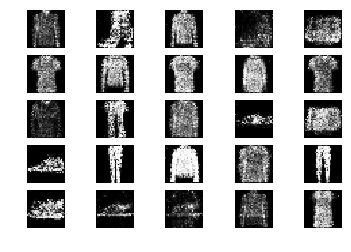

9751 [D loss: 0.627810, acc.: 56.25%] [G loss: 0.872920]
9752 [D loss: 0.619689, acc.: 65.62%] [G loss: 0.812930]
9753 [D loss: 0.665300, acc.: 53.12%] [G loss: 0.928406]
9754 [D loss: 0.565270, acc.: 71.88%] [G loss: 1.001457]
9755 [D loss: 0.673568, acc.: 54.69%] [G loss: 0.899195]
9756 [D loss: 0.671429, acc.: 54.69%] [G loss: 1.009566]
9757 [D loss: 0.638436, acc.: 59.38%] [G loss: 0.863777]
9758 [D loss: 0.629153, acc.: 68.75%] [G loss: 0.861233]
9759 [D loss: 0.622349, acc.: 59.38%] [G loss: 0.855167]
9760 [D loss: 0.680585, acc.: 54.69%] [G loss: 0.938421]
9761 [D loss: 0.576580, acc.: 67.19%] [G loss: 0.872073]
9762 [D loss: 0.611163, acc.: 68.75%] [G loss: 0.806362]
9763 [D loss: 0.657759, acc.: 57.81%] [G loss: 0.834702]
9764 [D loss: 0.671176, acc.: 51.56%] [G loss: 0.919260]
9765 [D loss: 0.607936, acc.: 64.06%] [G loss: 0.950510]
9766 [D loss: 0.697929, acc.: 56.25%] [G loss: 1.035492]
9767 [D loss: 0.636533, acc.: 64.06%] [G loss: 1.097219]
9768 [D loss: 0.642120, acc.: 5

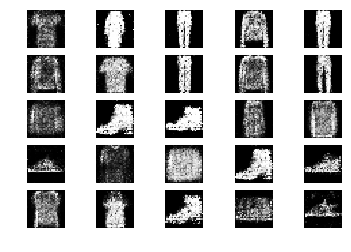

9801 [D loss: 0.670194, acc.: 60.94%] [G loss: 0.879824]
9802 [D loss: 0.619319, acc.: 65.62%] [G loss: 0.903264]
9803 [D loss: 0.639152, acc.: 64.06%] [G loss: 0.912439]
9804 [D loss: 0.671316, acc.: 59.38%] [G loss: 0.907263]
9805 [D loss: 0.630546, acc.: 67.19%] [G loss: 0.905928]
9806 [D loss: 0.711390, acc.: 54.69%] [G loss: 0.971693]
9807 [D loss: 0.642932, acc.: 68.75%] [G loss: 0.953031]
9808 [D loss: 0.656958, acc.: 57.81%] [G loss: 0.849383]
9809 [D loss: 0.616491, acc.: 75.00%] [G loss: 0.889274]
9810 [D loss: 0.658708, acc.: 64.06%] [G loss: 0.864453]
9811 [D loss: 0.628147, acc.: 67.19%] [G loss: 0.959435]
9812 [D loss: 0.622136, acc.: 67.19%] [G loss: 0.978863]
9813 [D loss: 0.650705, acc.: 64.06%] [G loss: 0.927701]
9814 [D loss: 0.665938, acc.: 56.25%] [G loss: 0.851552]
9815 [D loss: 0.657090, acc.: 60.94%] [G loss: 0.847999]
9816 [D loss: 0.614397, acc.: 71.88%] [G loss: 0.899463]
9817 [D loss: 0.623404, acc.: 62.50%] [G loss: 0.894992]
9818 [D loss: 0.629537, acc.: 6

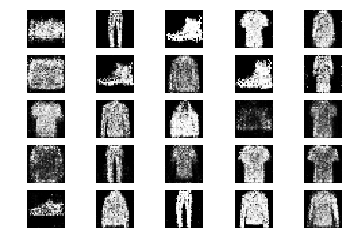

9851 [D loss: 0.596964, acc.: 65.62%] [G loss: 0.870836]
9852 [D loss: 0.647933, acc.: 54.69%] [G loss: 0.996215]
9853 [D loss: 0.693815, acc.: 56.25%] [G loss: 0.958026]
9854 [D loss: 0.678273, acc.: 50.00%] [G loss: 0.933901]
9855 [D loss: 0.674981, acc.: 57.81%] [G loss: 0.931499]
9856 [D loss: 0.723206, acc.: 46.88%] [G loss: 0.847345]
9857 [D loss: 0.644455, acc.: 57.81%] [G loss: 0.921221]
9858 [D loss: 0.710111, acc.: 50.00%] [G loss: 0.870866]
9859 [D loss: 0.608045, acc.: 62.50%] [G loss: 0.874130]
9860 [D loss: 0.622720, acc.: 65.62%] [G loss: 0.933381]
9861 [D loss: 0.673333, acc.: 60.94%] [G loss: 0.934341]
9862 [D loss: 0.650325, acc.: 62.50%] [G loss: 0.885236]
9863 [D loss: 0.635390, acc.: 64.06%] [G loss: 0.915264]
9864 [D loss: 0.662449, acc.: 59.38%] [G loss: 0.899874]
9865 [D loss: 0.676880, acc.: 53.12%] [G loss: 0.838386]
9866 [D loss: 0.676366, acc.: 59.38%] [G loss: 0.872068]
9867 [D loss: 0.599513, acc.: 73.44%] [G loss: 0.821687]
9868 [D loss: 0.626688, acc.: 6

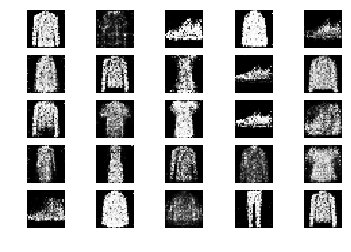

9901 [D loss: 0.697570, acc.: 54.69%] [G loss: 0.900009]
9902 [D loss: 0.691483, acc.: 56.25%] [G loss: 0.899431]
9903 [D loss: 0.618106, acc.: 68.75%] [G loss: 0.902760]
9904 [D loss: 0.643099, acc.: 59.38%] [G loss: 0.913928]
9905 [D loss: 0.662459, acc.: 64.06%] [G loss: 0.909626]
9906 [D loss: 0.660947, acc.: 60.94%] [G loss: 0.890541]
9907 [D loss: 0.633844, acc.: 65.62%] [G loss: 0.941599]
9908 [D loss: 0.616065, acc.: 62.50%] [G loss: 0.875428]
9909 [D loss: 0.638566, acc.: 60.94%] [G loss: 0.984687]
9910 [D loss: 0.704397, acc.: 48.44%] [G loss: 0.921800]
9911 [D loss: 0.638288, acc.: 59.38%] [G loss: 0.909565]
9912 [D loss: 0.701272, acc.: 59.38%] [G loss: 0.868489]
9913 [D loss: 0.623613, acc.: 64.06%] [G loss: 0.891324]
9914 [D loss: 0.664912, acc.: 62.50%] [G loss: 0.910001]
9915 [D loss: 0.647942, acc.: 67.19%] [G loss: 0.999711]
9916 [D loss: 0.578055, acc.: 75.00%] [G loss: 0.960634]
9917 [D loss: 0.696425, acc.: 56.25%] [G loss: 0.863177]
9918 [D loss: 0.629155, acc.: 6

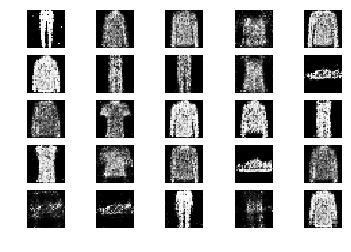

9951 [D loss: 0.639839, acc.: 59.38%] [G loss: 0.814323]
9952 [D loss: 0.657448, acc.: 56.25%] [G loss: 0.929116]
9953 [D loss: 0.671037, acc.: 59.38%] [G loss: 0.933418]
9954 [D loss: 0.658637, acc.: 62.50%] [G loss: 0.825626]
9955 [D loss: 0.633937, acc.: 57.81%] [G loss: 0.916464]
9956 [D loss: 0.651869, acc.: 62.50%] [G loss: 0.851329]
9957 [D loss: 0.588271, acc.: 67.19%] [G loss: 0.866125]
9958 [D loss: 0.702285, acc.: 59.38%] [G loss: 0.893972]
9959 [D loss: 0.663113, acc.: 57.81%] [G loss: 0.863733]
9960 [D loss: 0.689392, acc.: 60.94%] [G loss: 0.945968]
9961 [D loss: 0.629053, acc.: 64.06%] [G loss: 0.869379]
9962 [D loss: 0.709078, acc.: 51.56%] [G loss: 0.912701]
9963 [D loss: 0.632540, acc.: 65.62%] [G loss: 0.899261]
9964 [D loss: 0.643810, acc.: 62.50%] [G loss: 0.862510]
9965 [D loss: 0.647653, acc.: 60.94%] [G loss: 0.850337]
9966 [D loss: 0.650652, acc.: 62.50%] [G loss: 0.853434]
9967 [D loss: 0.699716, acc.: 50.00%] [G loss: 0.924943]
9968 [D loss: 0.635555, acc.: 6

In [12]:
epochs = 10000

batch_size = 32
valid = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

for epoch in range(epochs):
  # Train discriminator
  idx = np.random.randint(0, x_train.shape[0], batch_size)
  imgs = x_train[idx]

  noise = np.random.normal(0, 1, (batch_size, 100))

  gen_imgs = generator.predict(noise)

  d_loss_real = discriminator.train_on_batch(imgs, valid)
  d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
  d_loss = 0.5*np.add(d_loss_real, d_loss_fake)

  # Train generator
  noise = np.random.normal(0, 1, (batch_size, 100))

  g_loss = combined.train_on_batch(noise, valid)

  print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

  if epoch % 50 == 0:
    sample_images(epoch)

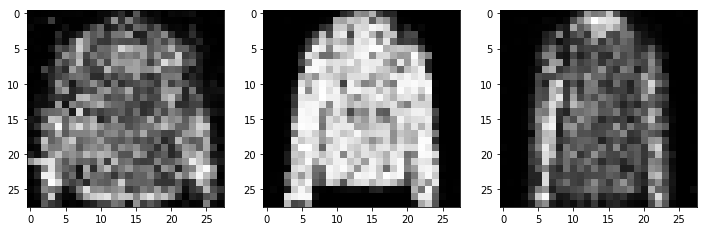

In [13]:
r, c = 5, 5
noise = np.random.normal(0, 1, (r*c, 100))
gen_imgs = generator.predict(noise)

gen_imgs = 0.5*gen_imgs+0.5

plt.figure(figsize=(12, 6))
plt.subplot(131)
plt.imshow(gen_imgs[0, :, :, 0], cmap='gray')
plt.subplot(132)
plt.imshow(gen_imgs[1, :, :, 0], cmap='gray')
plt.subplot(133)
plt.imshow(gen_imgs[2, :, :, 0], cmap='gray')
plt.show()
plt.close()